In [46]:
import os
import pandas as pd

def create_dataframe_from_folder(fold_path, df=None):
    if df is None:
        df = pd.DataFrame(columns=['pdf_file_name', 'col_0_txt_files', 'col_0_content'])

    # Initialize dictionaries
    folder_data = {}
    data = {}

    # Iterate through files in the folder
    for filename in os.listdir(fold_path):
        if "column_0" in filename and filename.endswith(".txt"):
            file_path = os.path.join(fold_path, filename)
            with open(file_path, "r") as file:
                file_content = file.read()
                folder_data[filename] = file_content

    if folder_data:
        data[fold_path] = folder_data

    foldername = fold_path.split('/')[-2]
    # Extracting data from the dictionary
    df_data = []
    for folder_name, folder_content in data.items():
        for file_name, file_content in folder_content.items():
            df_data.append([foldername, file_name, file_content.strip()])

    # Appending data to the dataframe
    df = pd.concat([df, pd.DataFrame(df_data, columns=['pdf_file_name', 'col_0_txt_files', 'col_0_content'])], ignore_index=True)

    return df

df = None
folder_paths = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf"

for folder in os.listdir(folder_paths):
    folder_path = os.path.join(folder_paths, folder)
    for fold in os.listdir(folder_path):
        fold_path = os.path.join(folder_path, fold)
        for fol in os.listdir(fold_path):
            fol_path = os.path.join(fold_path, fol)
            if "pdf_to_images" in os.path.basename(fol_path):
                #for files in os.listdir(fol_path):
                    #file_path = os.path.join(fol_path,files)
                    df = create_dataframe_from_folder(fol_path, df)

# Displaying the final dataframe
df



,pdf_file_name,col_0_txt_files,col_0_content
0,041_pg2,column_0_row_2_041_pg2_cropped.txt,खसरा आईडी : 121288437 ऋण पुस्तिकाः?
1,041_pg2,column_0_row_3_041_pg2_cropped.txt,खसरा आईडी : 121269750 ऋण पुस्तिकाः?
2,041_pg2,column_0_row_1_041_pg2_cropped.txt,खसरा आईडी : 121272802 ऋण पुस्तिकाः?
3,041_pg2,column_0_row_4_041_pg2_cropped.txt,खसरा आईडी : 121273201 ऋण पुस्तिकाः?
4,041_pg1,column_0_row_2_041_pg1_cropped.txt,खसरा आईडी : 121266301 ऋण पुस्तिकाः?
...,...,...,...
279,019_pg3,column_0_row_1_019_pg3_cropped.txt,खसरा आईडी : 121288406 ऋण\nपुस्तिका:2292423
280,019_pg3,column_0_row_4_019_pg3_cropped.txt,खसरा आईडी : 121270028 ऋण\nपुस्तिका:2292423
281,019_pg3,column_0_row_2_019_pg3_cropped.txt,खसरा आईडी : 121265335 ऋण\nपुस्तिका:2292423
282,029_pg1,column_0_row_1_029_pg1_cropped.txt,खसरा आईडी : 105309578 छोटे झाड़ के\nजंगल व घांस


In [47]:
import os
import pandas as pd

folder_paths = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf"

# Assuming df is your DataFrame with a column named "column" containing image names
# and you want to add a new column "image_path" to it.
df['image_path_col0'] = ''


for folder in os.listdir(folder_paths):
    folder_path = os.path.join(folder_paths, folder)
    for fold in os.listdir(folder_path):
        fold_path = os.path.join(folder_path, fold)
        for fol in os.listdir(fold_path):
            fol_path = os.path.join(fold_path, fol)
            if "pdf_to_images" in os.path.basename(fol_path):
                for files in os.listdir(fol_path):
                    file_path = os.path.join(fol_path,files)
                    if "column_0" in files and files.endswith(".jpg"): 
                        image_name = os.path.splitext(files)[0]  # Get image name without extension
                        # Check if image name exists in "column" column of DataFrame
                        mask = df['col_0_txt_files'].str.contains(image_name)
                        # Update the 'image_path' column with the image_path for matching rows
                        df.loc[mask, 'image_path_col0'] = os.path.join(fol_path, files)

df

,pdf_file_name,col_0_txt_files,col_0_content,image_path_col0
0,041_pg2,column_0_row_2_041_pg2_cropped.txt,खसरा आईडी : 121288437 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
1,041_pg2,column_0_row_3_041_pg2_cropped.txt,खसरा आईडी : 121269750 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
2,041_pg2,column_0_row_1_041_pg2_cropped.txt,खसरा आईडी : 121272802 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
3,041_pg2,column_0_row_4_041_pg2_cropped.txt,खसरा आईडी : 121273201 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
4,041_pg1,column_0_row_2_041_pg1_cropped.txt,खसरा आईडी : 121266301 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
...,...,...,...,...
279,019_pg3,column_0_row_1_019_pg3_cropped.txt,खसरा आईडी : 121288406 ऋण\nपुस्तिका:2292423,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
280,019_pg3,column_0_row_4_019_pg3_cropped.txt,खसरा आईडी : 121270028 ऋण\nपुस्तिका:2292423,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
281,019_pg3,column_0_row_2_019_pg3_cropped.txt,खसरा आईडी : 121265335 ऋण\nपुस्तिका:2292423,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
282,029_pg1,column_0_row_1_029_pg1_cropped.txt,खसरा आईडी : 105309578 छोटे झाड़ के\nजंगल व घांस,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...


In [15]:
df['image_path_col0'][0]

'/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/column_0_row_2_041_pg2_cropped.jpg'

In [ ]:
import os

folder_paths = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf"

for folder in os.listdir(folder_paths):
    folder_path = os.path.join(folder_paths, folder)
    for fold in os.listdir(folder_path):
        fold_path = os.path.join(folder_path, fold)
        for fol in os.listdir(fold_path):
            fol_path = os.path.join(fold_path, fol)
            if "pdf_to_images" in os.path.basename(fol_path):
                for files in os.listdir(fol_path):
                    file_path = os.path.join(fol_path,files)
                    print(file_path)

In [48]:
import os
import pandas as pd

def create_dataframe_from_folder(fold_path, df1=None):
    if df1 is None:
        df1 = pd.DataFrame(columns=['pdf_file_name1', 'col_1_txt_files', 'col_1_content'])

    # Initialize dictionaries
    folder_data = {}
    data = {}

    # Iterate through files in the folder
    for filename in os.listdir(fold_path):
        if "column_1" in filename and filename.endswith(".txt"):
            file_path = os.path.join(fold_path, filename)
            with open(file_path, "r") as file:
                file_content = file.read()
                folder_data[filename] = file_content

    if folder_data:
        data[fold_path] = folder_data

    foldername = fold_path.split('/')[-2]
    # Extracting data from the dictionary
    df1_data = []
    for folder_name, folder_content in data.items():
        for file_name, file_content in folder_content.items():
            df1_data.append([foldername, file_name, file_content.strip()])

    # Appending data to the dataframe
    df1 = pd.concat([df1, pd.DataFrame(df1_data, columns=['pdf_file_name1', 'col_1_txt_files', 'col_1_content'])], ignore_index=True)

    return df1

df1 = None
folder_paths = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf"

for folder in os.listdir(folder_paths):
    folder_path = os.path.join(folder_paths, folder)
    for fold in os.listdir(folder_path):
        fold_path = os.path.join(folder_path, fold)
        for fol in os.listdir(fold_path):
            fol_path = os.path.join(fold_path, fol)
            if "pdf_to_images" in os.path.basename(fol_path):
                #for files in os.listdir(fol_path):
                    #file_path = os.path.join(fol_path,files)
                    df1 = create_dataframe_from_folder(fol_path, df1)

# Displaying the final dataframe
df1



,pdf_file_name1,col_1_txt_files,col_1_content
0,041_pg2,column_1_row_1_041_pg2_cropped.txt,1134
1,041_pg2,column_1_row_3_041_pg2_cropped.txt,1350
2,041_pg2,column_1_row_4_041_pg2_cropped.txt,1409
3,041_pg2,column_1_row_2_041_pg2_cropped.txt,1348
4,041_pg1,column_1_row_1_041_pg1_cropped.txt,718
...,...,...,...
279,019_pg3,column_1_row_2_019_pg3_cropped.txt,1540/1
280,019_pg3,column_1_row_4_019_pg3_cropped.txt,1545/11
281,019_pg3,column_1_row_3_019_pg3_cropped.txt,1545/7
282,029_pg1,column_1_row_1_029_pg1_cropped.txt,98


In [49]:
import os
import pandas as pd

folder_paths = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf"

# Assuming df is your DataFrame with a column named "column" containing image names
# and you want to add a new column "image_path" to it.
df1['image_path_col1'] = ''


for folder in os.listdir(folder_paths):
    folder_path = os.path.join(folder_paths, folder)
    for fold in os.listdir(folder_path):
        fold_path = os.path.join(folder_path, fold)
        for fol in os.listdir(fold_path):
            fol_path = os.path.join(fold_path, fol)
            if "pdf_to_images" in os.path.basename(fol_path):
                for files in os.listdir(fol_path):
                    file_path = os.path.join(fol_path,files)
                    if "column_1" in files and files.endswith(".jpg"): 
                        image_name = os.path.splitext(files)[0]  # Get image name without extension
                        # Check if image name exists in "column" column of DataFrame
                        mask = df1['col_1_txt_files'].str.contains(image_name)
                        # Update the 'image_path' column with the image_path for matching rows
                        df1.loc[mask, 'image_path_col1'] = os.path.join(fol_path, files)

df1

,pdf_file_name1,col_1_txt_files,col_1_content,image_path_col1
0,041_pg2,column_1_row_1_041_pg2_cropped.txt,1134,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
1,041_pg2,column_1_row_3_041_pg2_cropped.txt,1350,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
2,041_pg2,column_1_row_4_041_pg2_cropped.txt,1409,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
3,041_pg2,column_1_row_2_041_pg2_cropped.txt,1348,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
4,041_pg1,column_1_row_1_041_pg1_cropped.txt,718,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
...,...,...,...,...
279,019_pg3,column_1_row_2_019_pg3_cropped.txt,1540/1,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
280,019_pg3,column_1_row_4_019_pg3_cropped.txt,1545/11,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
281,019_pg3,column_1_row_3_019_pg3_cropped.txt,1545/7,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
282,029_pg1,column_1_row_1_029_pg1_cropped.txt,98,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...


In [19]:
df1['image_path_col1'][0]

'/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/column_1_row_1_041_pg2_cropped.jpg'

खसरा आईडी : 103080503 ऋण

पुस्तिका:G-640738

यद खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


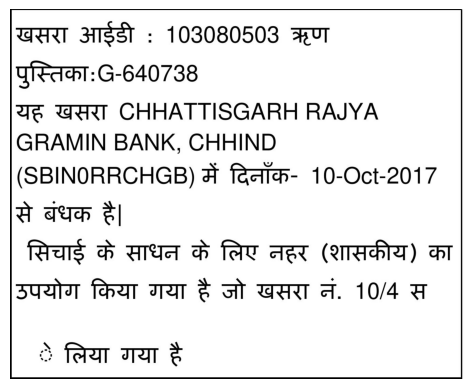

In [111]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

a = 98

# Assuming imagePath contains the path to the image you want to display
imagePath = df['image_path'][a]
print(df['Content'][a])
# Load the image
img = mpimg.imread(imagePath)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes
#plt.title(df['Content'][a])  # Set the title
plt.show()


In [98]:
10,59,70,74,83,88,98

(10,)

In [51]:
file_path = os.path.join('/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/','last_column_data.csv')
df.to_csv(file_path, index=False)

In [52]:
file_path = os.path.join('/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/','first_column_data.csv')
df1.to_csv(file_path, index=False)

In [53]:
merged_df = pd.concat([df, df1], axis=1)
#merged_df[merged_df['pdf_file_name'] == '041_pg2']

In [54]:
merged_df.drop(columns=['pdf_file_name1'], axis=1, inplace=True)

In [55]:
merged_df[merged_df['pdf_file_name'] == '041_pg2']

,pdf_file_name,col_0_txt_files,col_0_content,image_path_col0,col_1_txt_files,col_1_content,image_path_col1
0,041_pg2,column_0_row_2_041_pg2_cropped.txt,खसरा आईडी : 121288437 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_1_041_pg2_cropped.txt,1134,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
1,041_pg2,column_0_row_3_041_pg2_cropped.txt,खसरा आईडी : 121269750 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_3_041_pg2_cropped.txt,1350,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
2,041_pg2,column_0_row_1_041_pg2_cropped.txt,खसरा आईडी : 121272802 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_4_041_pg2_cropped.txt,1409,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
3,041_pg2,column_0_row_4_041_pg2_cropped.txt,खसरा आईडी : 121273201 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_2_041_pg2_cropped.txt,1348,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...


In [56]:
file_path = os.path.join('/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/','ch_ocr_Data_validation.csv')
merged_df.to_csv(file_path, index=False)

In [71]:
import camelot
pdf_path = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/023.pdf"
table = camelot.read_pdf(pdf_path, encoding='utf-8')
cell = table[0].cells

ZeroDivisionError: float division by zero

In [72]:
import camelot

def parse_pdf(pdf_path):
    try:
        tables = camelot.read_pdf(pdf_path, encoding='utf-8')
        for table in tables:
            # Process each table
            print(table.df)  # Example: Print DataFrame representation of the table
    except ZeroDivisionError as e:
        # Handle the ZeroDivisionError gracefully
        print("ZeroDivisionError occurred:", e)
        # Optionally, you can log the error or perform any other actions needed

# Example usage
pdf_path = "/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/023.pdf"
parse_pdf(pdf_path)


ZeroDivisionError occurred: float division by zero


In [57]:
merged_df.head(2)

,pdf_file_name,col_0_txt_files,col_0_content,image_path_col0,col_1_txt_files,col_1_content,image_path_col1
0,041_pg2,column_0_row_2_041_pg2_cropped.txt,खसरा आईडी : 121288437 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_1_041_pg2_cropped.txt,1134,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
1,041_pg2,column_0_row_3_041_pg2_cropped.txt,खसरा आईडी : 121269750 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_3_041_pg2_cropped.txt,1350,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...


row_id = 0
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_0_row_2_041_pg2_cropped.jpg

खसरा आईडी : 121288437 ऋण पुस्तिकाः?


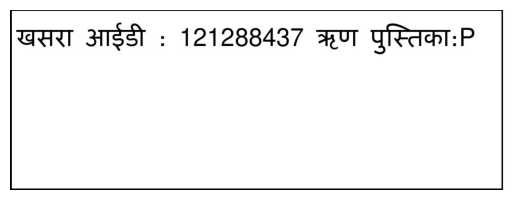


-----------------------------------------------------------------------------------

row_id = 1
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_0_row_3_041_pg2_cropped.jpg

खसरा आईडी : 121269750 ऋण पुस्तिकाः?


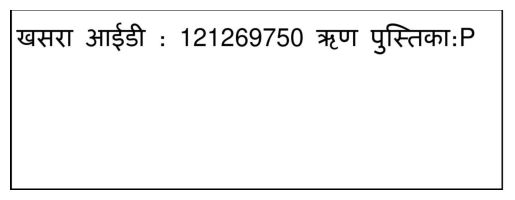


-----------------------------------------------------------------------------------

row_id = 2
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_0_row_1_041_pg2_cropped.jpg

खसरा आईडी : 121272802 ऋण पुस्तिकाः?


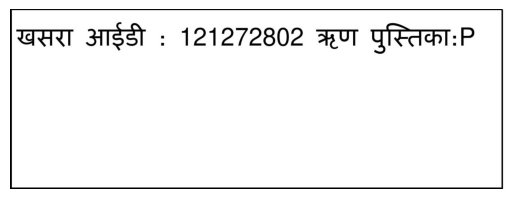


-----------------------------------------------------------------------------------

row_id = 3
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_0_row_4_041_pg2_cropped.jpg

खसरा आईडी : 121273201 ऋण पुस्तिकाः?


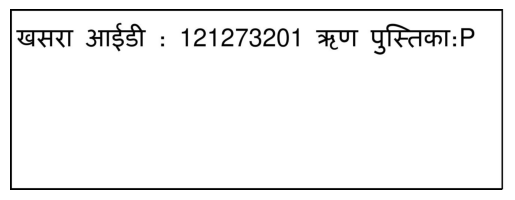


-----------------------------------------------------------------------------------

row_id = 4
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_0_row_2_041_pg1_cropped.jpg

खसरा आईडी : 121266301 ऋण पुस्तिकाः?


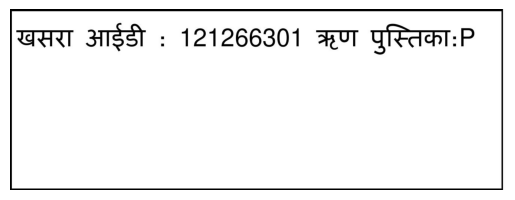


-----------------------------------------------------------------------------------

row_id = 5
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_0_row_1_041_pg1_cropped.jpg

खसरा आईडी : 121266300 ऋण पुस्तिकाः? 0


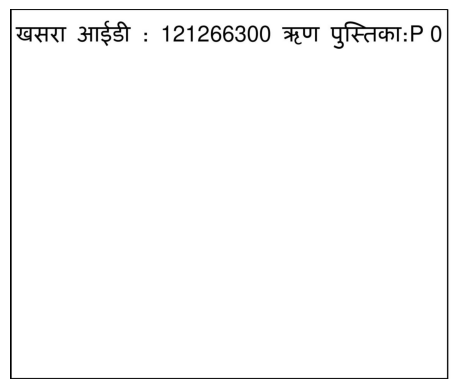


-----------------------------------------------------------------------------------

row_id = 6
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_0_row_3_041_pg1_cropped.jpg

खसरा आईडी : 121272799 ऋण पुस्तिकाः?


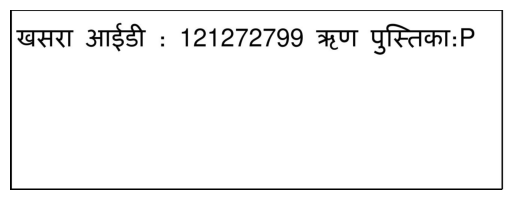


-----------------------------------------------------------------------------------

row_id = 7
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_0_row_1_041_pg3_cropped.jpg

खसरा आईडी : 121269773 ऋण पुस्तिकाः?


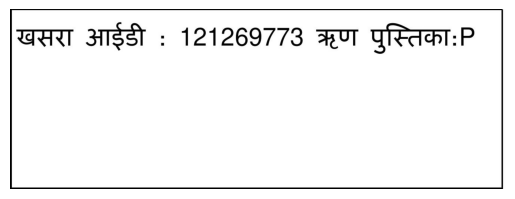


-----------------------------------------------------------------------------------

row_id = 8
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_0_row_2_041_pg3_cropped.jpg

खसरा आईडी : 121265325 ऋण पुस्तिकाः?
महुआ 2 आम 2 बांस 2


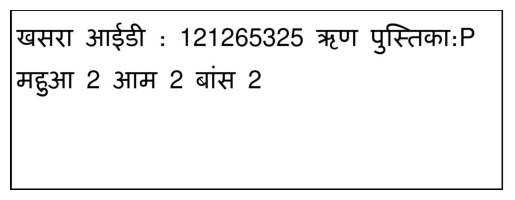


-----------------------------------------------------------------------------------

row_id = 9
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_0_row_3_041_pg3_cropped.jpg

खसरा आईडी : 121288561 ऋण पुस्तिकाः?
मकान आंम 4 महुआ 1 जीवनधारा पक्का कुआं
1


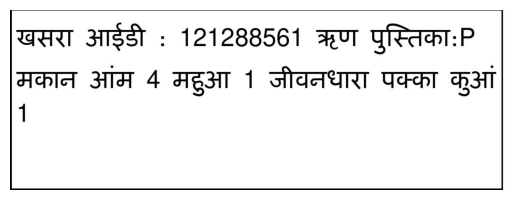


-----------------------------------------------------------------------------------

row_id = 10
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_0_row_4_041_pg3_cropped.jpg

खसरा आईडी : 121265327 ऋण पुस्तिकाः?


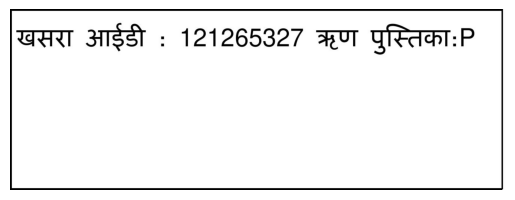


-----------------------------------------------------------------------------------

row_id = 11
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_0_row_1_041_pg4_cropped.jpg

खसरा आईडी : 121273356 ऋण पुस्तिकाः?


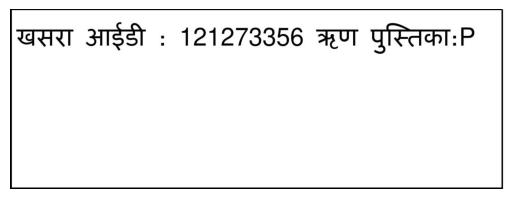


-----------------------------------------------------------------------------------

row_id = 12
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_0_row_3_041_pg4_cropped.jpg

खसरा आईडी : 121288633 ऋण पुस्तिकाः?


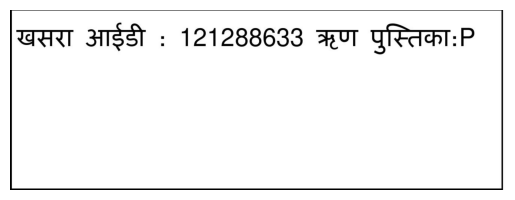


-----------------------------------------------------------------------------------

row_id = 13
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_0_row_2_041_pg4_cropped.jpg

खसरा आईडी : 121265537 ऋण पुस्तिकाः?


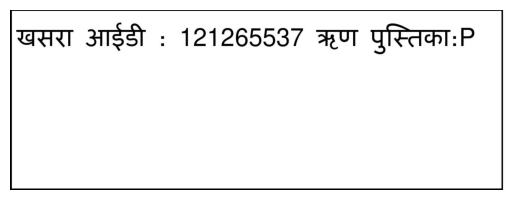


-----------------------------------------------------------------------------------

row_id = 14
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_0_row_4_041_pg4_cropped.jpg

खसरा आईडी : 121273570 ऋण पुस्तिकाः?


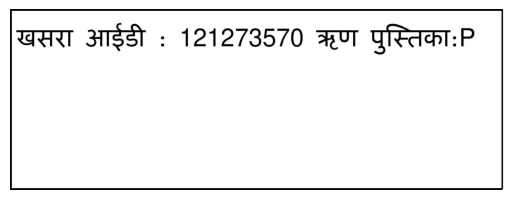


-----------------------------------------------------------------------------------

row_id = 15
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_0_row_4_063_pg1_cropped.jpg

_———


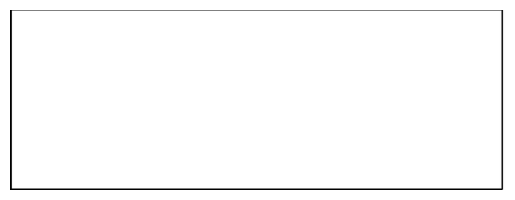


-----------------------------------------------------------------------------------

row_id = 16
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_0_row_3_063_pg1_cropped.jpg

———


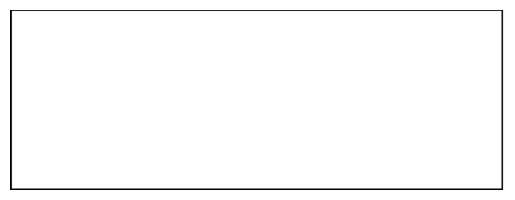


-----------------------------------------------------------------------------------

row_id = 17
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_0_row_2_063_pg1_cropped.jpg

——_—


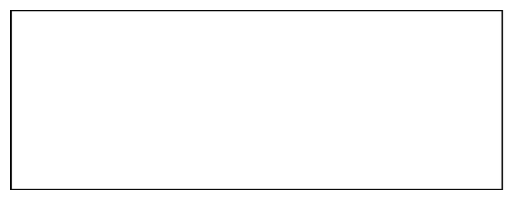


-----------------------------------------------------------------------------------

row_id = 18
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_0_row_1_063_pg1_cropped.jpg

खसरा आईडी : 105314890 ऋण
पुस्तिका:511107 *

यह खसरा JILA SAHAKARI KENDRIYA
BANK RAJNANDGAON, PACS MOHALA
(UTIBOSJSN01) में दिनॉक- 01-Apr-2019 से
बंधक है|


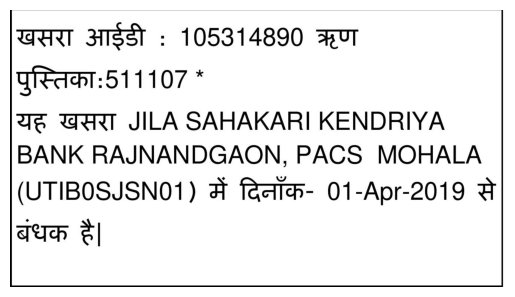


-----------------------------------------------------------------------------------

row_id = 19
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg2/pdf_to_images/column_0_row_2_063_pg2_cropped.jpg

खसरा आईडी : 105318969 ऋण
पुस्तिका:511107 उड़ान नम्बर 140

यह खसरा JILA SAHAKARI KENDRIYA
BANK RAJNANDGAON, PACS MOHALA
(UTIBO0SJSN01) में दिनॉक- 01-Apr-2019 से
बंधक है|


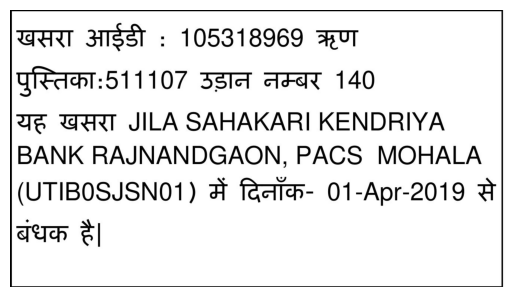


-----------------------------------------------------------------------------------

row_id = 20
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg2/pdf_to_images/column_0_row_1_063_pg2_cropped.jpg

खसरा आईडी : 105309288 ऋण
पुस्तिका:511107

यह खसरा JILA SAHAKARI KENDRIYA
BANK RAJNANDGAON, PACS MOHALA
(UTIBOSJSN01) में दिनॉक- 01-Apr-2019 से
बंधक है|


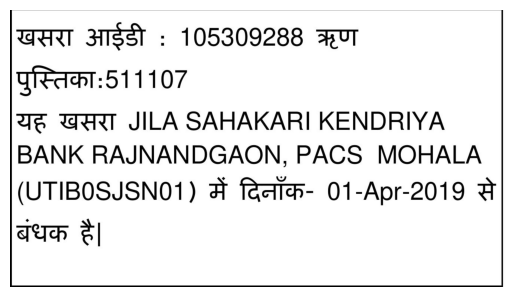


-----------------------------------------------------------------------------------

row_id = 21
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_0_row_3_065_pg1_cropped.jpg

खसरा आईडी : 123023885


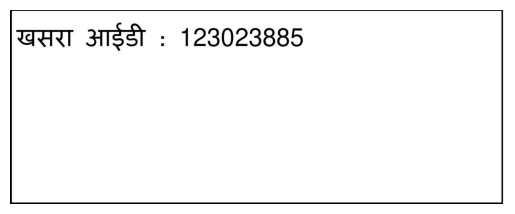


-----------------------------------------------------------------------------------

row_id = 22
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_0_row_2_065_pg1_cropped.jpg

खसरा आईडी : 123026078 बंटवारा से आया
,ना0 क्र0 10 प्र0 क्र0 21 बैठक दि0 07-03-
2019 के अनुसार।


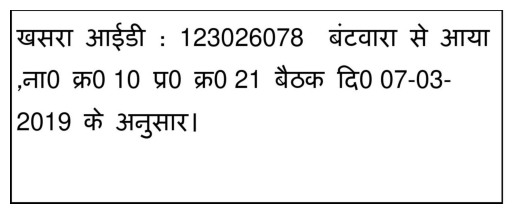


-----------------------------------------------------------------------------------

row_id = 23
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_0_row_4_065_pg1_cropped.jpg

खसरा आईडी : 123023888


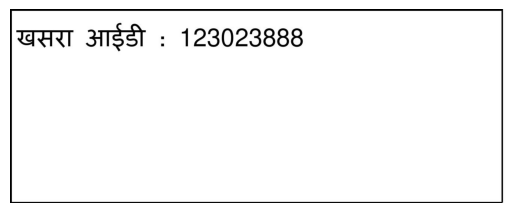


-----------------------------------------------------------------------------------

row_id = 24
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_0_row_1_065_pg1_cropped.jpg

खसरा आईडी : 123026057 बंटवारा से
आया, ना0 क्र0 10 प्र0 क्र0 21 बैठक दि0 07-
03-2019 के अनुसार


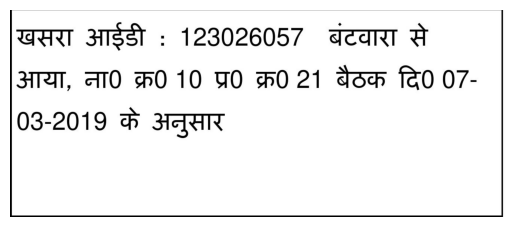


-----------------------------------------------------------------------------------

row_id = 25
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_0_row_1_026_pg1_cropped.jpg

खसरा आईडी : 110645045 ऋण
पुस्तिका:498322 *
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दहै जो खसरा नं. 273 स

र लिया गया दै


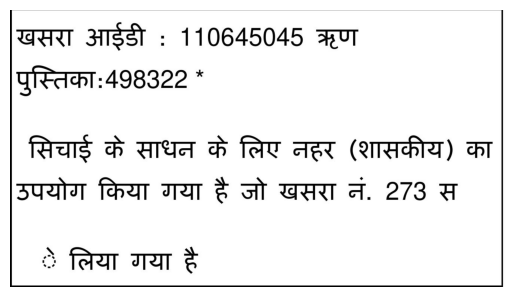


-----------------------------------------------------------------------------------

row_id = 26
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_0_row_2_026_pg1_cropped.jpg

खसरा आईडी : 110631538 ऋण
पुस्तिका:498322
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दहै जो खसरा नं. 273 स

र लिया गया दै


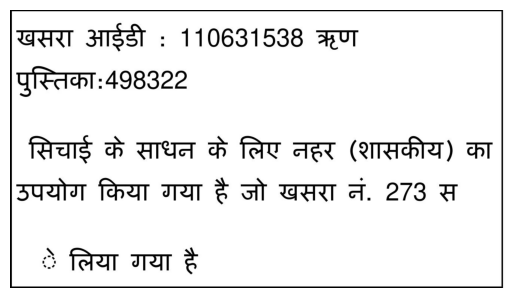


-----------------------------------------------------------------------------------

row_id = 27
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_0_row_3_026_pg1_cropped.jpg

खसरा आईडी : 110631809 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


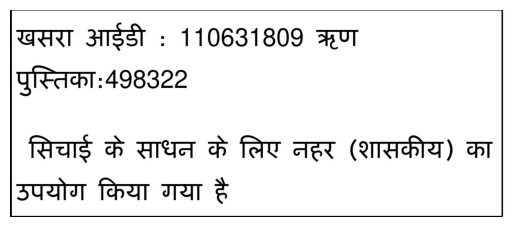


-----------------------------------------------------------------------------------

row_id = 28
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg3/pdf_to_images/column_0_row_1_026_pg3_cropped.jpg

खसरा आईडी : 110631093 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


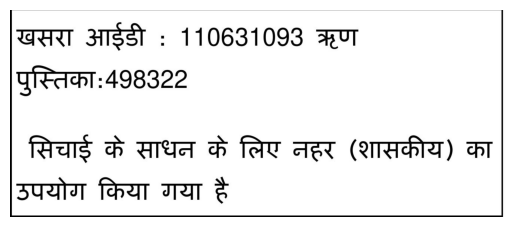


-----------------------------------------------------------------------------------

row_id = 29
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg3/pdf_to_images/column_0_row_2_026_pg3_cropped.jpg

खसरा आईडी : 110645609 ऋण
पुस्तिका:498322


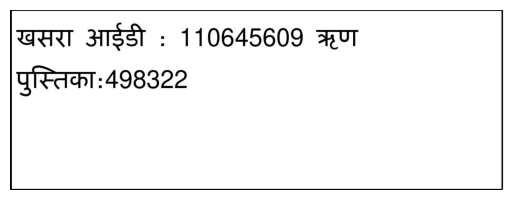


-----------------------------------------------------------------------------------

row_id = 30
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_0_row_2_026_pg2_cropped.jpg

खसरा आईडी : 110645501 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


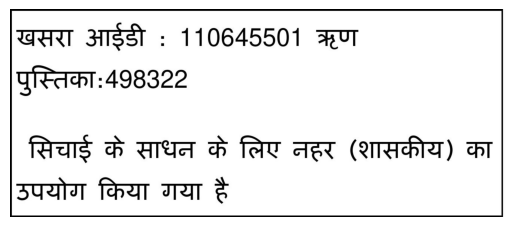


-----------------------------------------------------------------------------------

row_id = 31
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_0_row_3_026_pg2_cropped.jpg

खसरा आईडी : 110631929 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


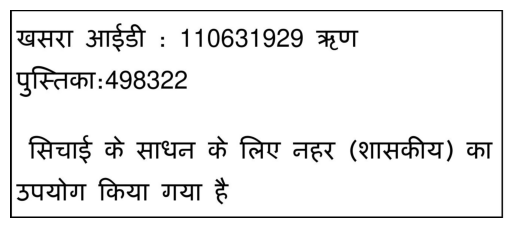


-----------------------------------------------------------------------------------

row_id = 32
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_0_row_1_026_pg2_cropped.jpg

खसरा आईडी : 110645499 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


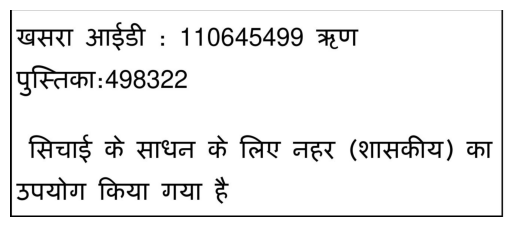


-----------------------------------------------------------------------------------

row_id = 33
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_0_row_4_026_pg2_cropped.jpg

खसरा आईडी : 110645502 ऋण
पुस्तिका:498322

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


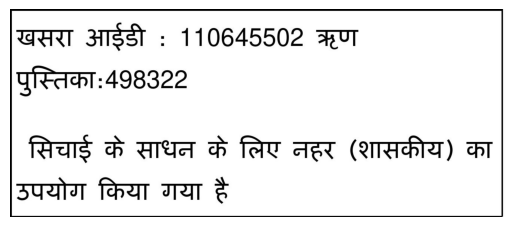


-----------------------------------------------------------------------------------

row_id = 34
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_0_row_3_020_pg1_cropped.jpg

खसरा आईडी : 100640164 ऋण
पुस्तिका:1816606


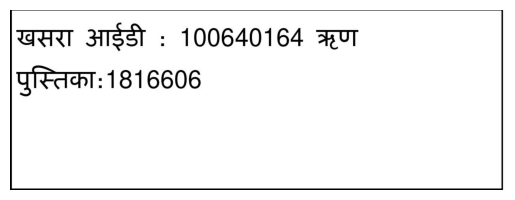


-----------------------------------------------------------------------------------

row_id = 35
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_0_row_1_020_pg1_cropped.jpg

खसरा आईडी : 100715563 ऋण
पुस्तिका:1816606 *


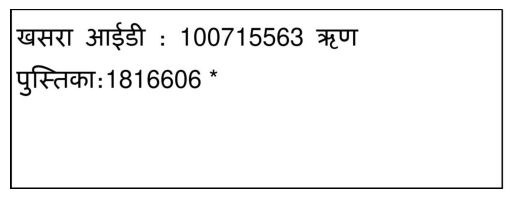


-----------------------------------------------------------------------------------

row_id = 36
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_0_row_2_020_pg1_cropped.jpg

खसरा आईडी : 100715565 ऋण
पुस्तिका:1816606


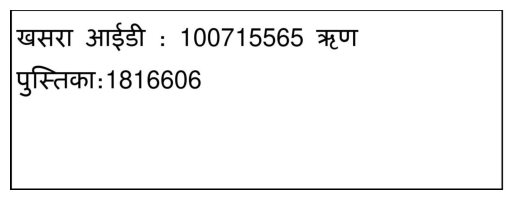


-----------------------------------------------------------------------------------

row_id = 37
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_0_row_4_020_pg1_cropped.jpg

खसरा आईडी : 100641045 ऋण
पुस्तिका:1816606


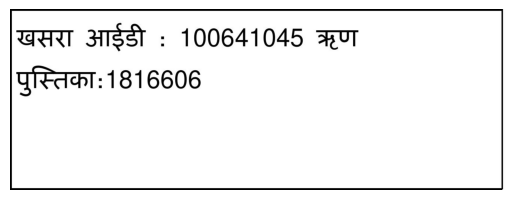


-----------------------------------------------------------------------------------

row_id = 38
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_0_row_1_020_pg2_cropped.jpg

खसरा आईडी : 100653852 ऋण
पुस्तिका:1816606


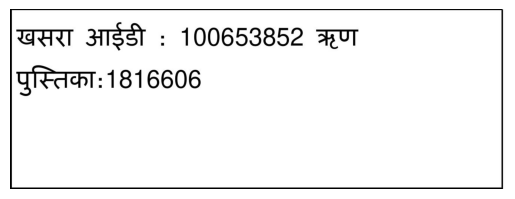


-----------------------------------------------------------------------------------

row_id = 39
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_0_row_4_020_pg2_cropped.jpg

खसरा आईडी : 100652498 ऋण
पुस्तिका:1816606


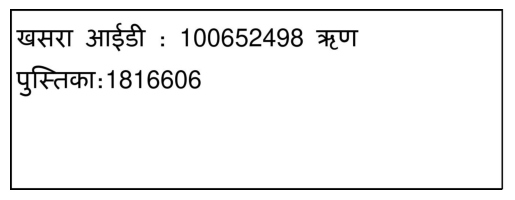


-----------------------------------------------------------------------------------

row_id = 40
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_0_row_3_020_pg2_cropped.jpg

खसरा आईडी : 100640810 ऋण
पुस्तिका:1816606


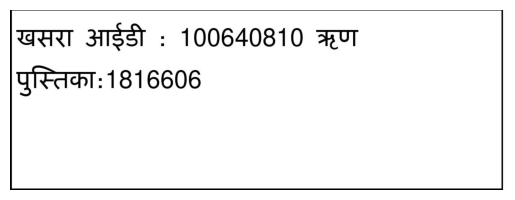


-----------------------------------------------------------------------------------

row_id = 41
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_0_row_2_020_pg2_cropped.jpg

खसरा आईडी : 100639924 ऋण
पुस्तिका:1816606


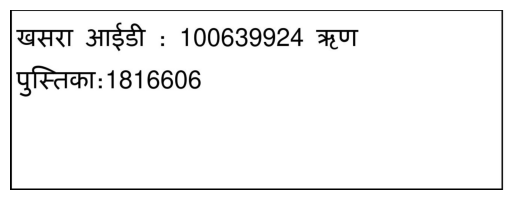


-----------------------------------------------------------------------------------

row_id = 42
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_0_row_4_020_pg3_cropped.jpg

खसरा आईडी : 100715346 ऋण
पुस्तिका:1816606


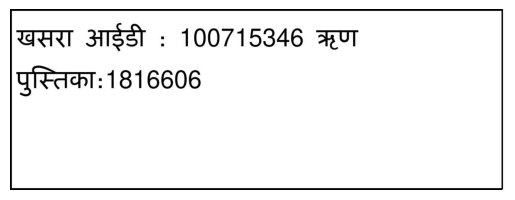


-----------------------------------------------------------------------------------

row_id = 43
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_0_row_3_020_pg3_cropped.jpg

खसरा आईडी : 100652503 ऋण
पुस्तिका:1816606


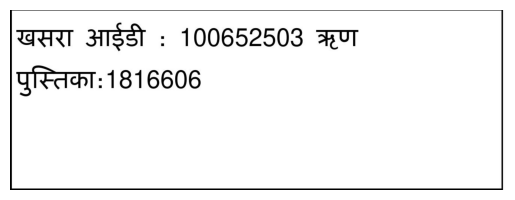


-----------------------------------------------------------------------------------

row_id = 44
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_0_row_2_020_pg3_cropped.jpg

खसरा आईडी : 100640813 ऋण
पुस्तिका:1816606


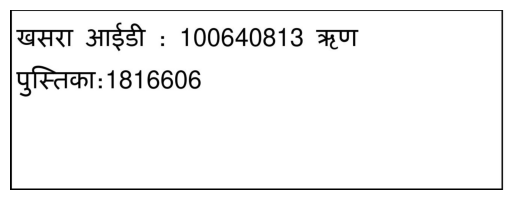


-----------------------------------------------------------------------------------

row_id = 45
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_0_row_1_020_pg3_cropped.jpg

खसरा आईडी : 100640812 ऋण
पुस्तिका:1816606


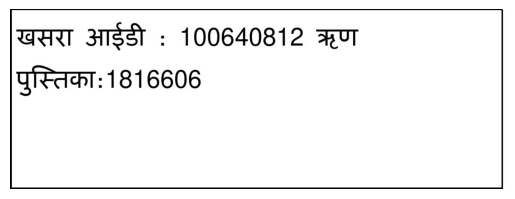


-----------------------------------------------------------------------------------

row_id = 46
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_0_row_2_020_pg4_cropped.jpg

खसरा आईडी : 100715415 ऋण
पुस्तिका:1816606


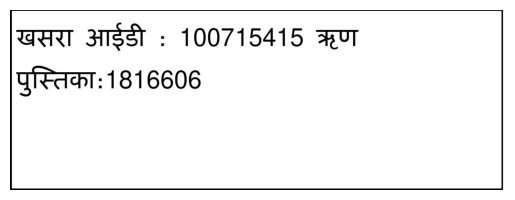


-----------------------------------------------------------------------------------

row_id = 47
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_0_row_1_020_pg4_cropped.jpg

खसरा आईडी : 100640826 ऋण
पुस्तिका:1816606


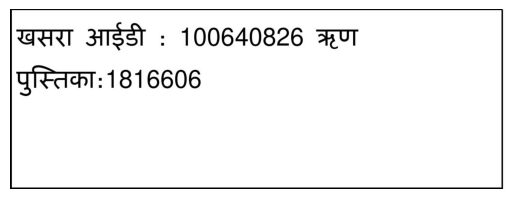


-----------------------------------------------------------------------------------

row_id = 48
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_0_row_3_020_pg4_cropped.jpg

खसरा आईडी : 100715427 ऋण
पुस्तिका:1816606


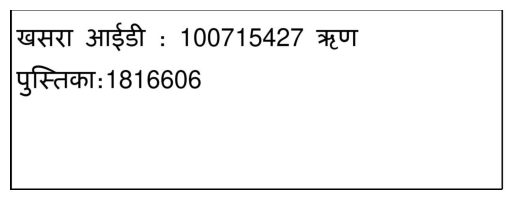


-----------------------------------------------------------------------------------

row_id = 49
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg6/pdf_to_images/column_0_row_1_038_pg6_cropped.jpg

खसरा आईडी : 117464544 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 940 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 940 स
छ लिया गया दै


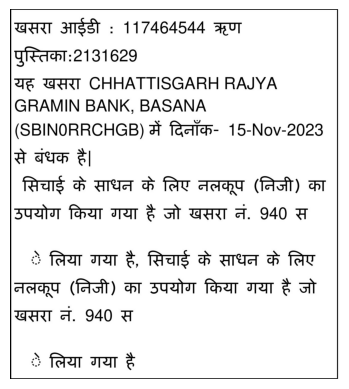


-----------------------------------------------------------------------------------

row_id = 50
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg3/pdf_to_images/column_0_row_1_038_pg3_cropped.jpg

खसरा आईडी : 117463882 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 343/1 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 344 स
छ लिया गया दै


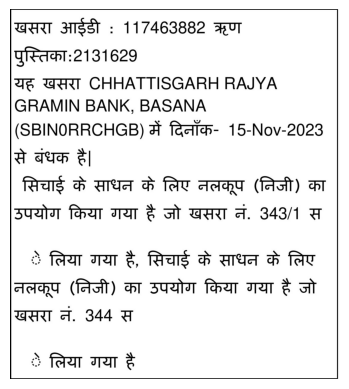


-----------------------------------------------------------------------------------

row_id = 51
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg8/pdf_to_images/column_0_row_1_038_pg8_cropped.jpg

खसरा आईडी : 117448915 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 940 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 940 स
छ लिया गया दै


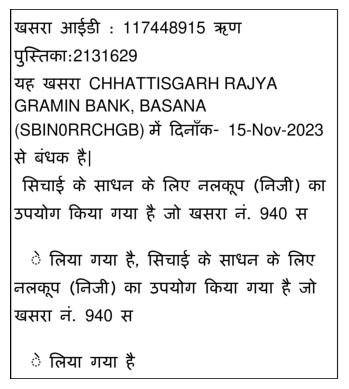


-----------------------------------------------------------------------------------

row_id = 52
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg1/pdf_to_images/column_0_row_1_038_pg1_cropped.jpg

खसरा आईडी : 117467089 ऋण
पुस्तिका:2131629

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|


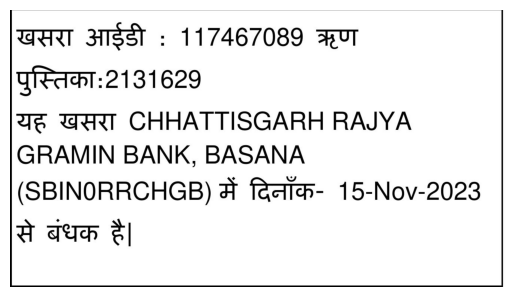


-----------------------------------------------------------------------------------

row_id = 53
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg1/pdf_to_images/column_0_row_2_038_pg1_cropped.jpg

——_—


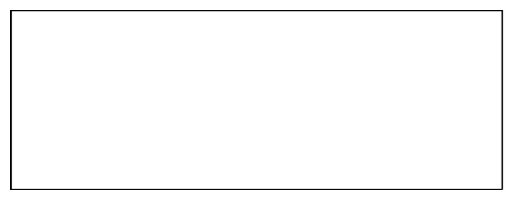


-----------------------------------------------------------------------------------

row_id = 54
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg9/pdf_to_images/column_0_row_1_038_pg9_cropped.jpg

खसरा आईडी : 117448917 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 940 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 959// स
छ लिया गया दै


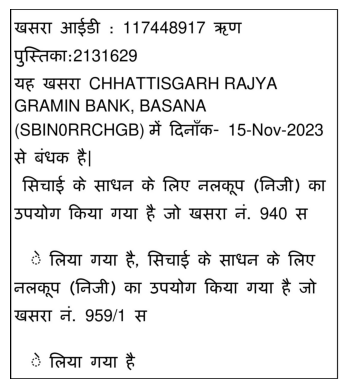


-----------------------------------------------------------------------------------

row_id = 55
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg7/pdf_to_images/column_0_row_1_038_pg7_cropped.jpg

खसरा आईडी : 117448914 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 940 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 940 स
छ लिया गया दै


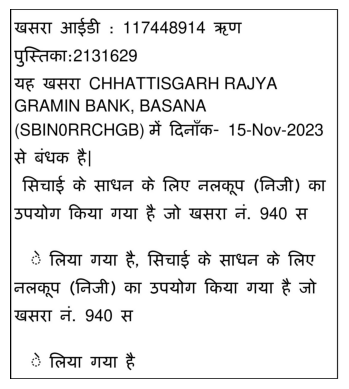


-----------------------------------------------------------------------------------

row_id = 56
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg5/pdf_to_images/column_0_row_1_038_pg5_cropped.jpg

खसरा आईडी : 117436331 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 940 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 940 स
छ लिया गया दै


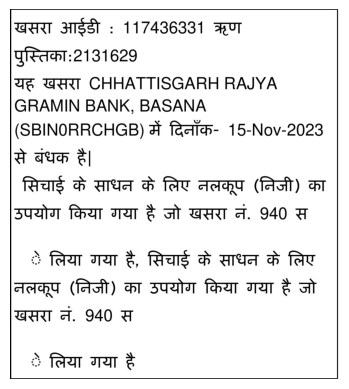


-----------------------------------------------------------------------------------

row_id = 57
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg4/pdf_to_images/column_0_row_1_038_pg4_cropped.jpg

खसरा आईडी : 117464542 ऋण
पुस्तिका:2131629

यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|

सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है, सिचाई के साधन के
लिए नलकूप (निजी) का उपयोग किया गया है


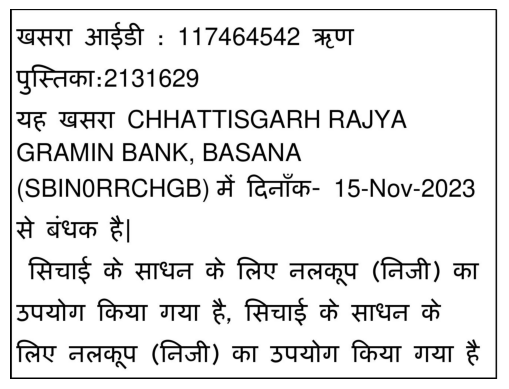


-----------------------------------------------------------------------------------

row_id = 58
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg4/pdf_to_images/column_0_row_2_038_pg4_cropped.jpg

खसरा आईडी : 117448913 ऋण
पुस्तिका:2131629

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनाँक- 15-Nov-2023
से बंधक ट|

सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है, सिचाई के साधन के
लिए नलकूप (निजी) का उपयोग किया गया है


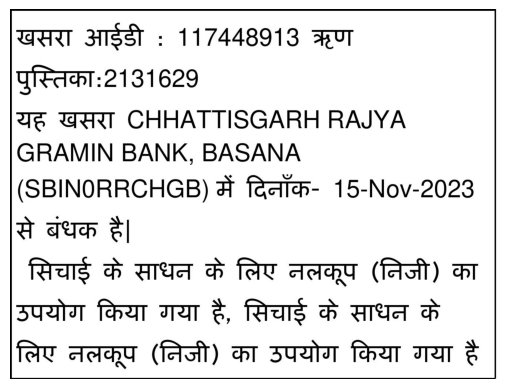


-----------------------------------------------------------------------------------

row_id = 59
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg2/pdf_to_images/column_0_row_1_038_pg2_cropped.jpg

खसरा आईडी : 117447758 ऋण
पुस्तिका:2131629
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASANA
(SBINORRCHGB) में दिनॉँक- 15-Nov-2023
से बंधक ट|
सिचाई के साधन के लिए नलकूप (निजी) का
उपयोग किया गया है जो खसरा नं. 343/1 स
` लिया गया दै, सिचाई के साधन के लिए
नलकूप (निजी) का उपयोग किया गया है जो
खसरा नं. 344 स
छ लिया गया दै


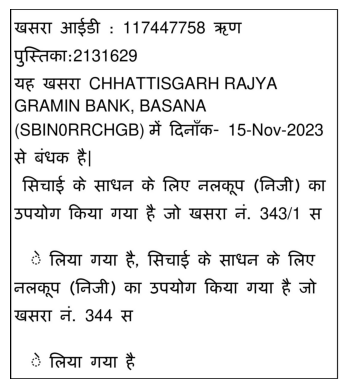


-----------------------------------------------------------------------------------

row_id = 60
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/025/025_pg1/pdf_to_images/column_0_row_1_025_pg1_cropped.jpg

खसरा आईडी : 114296216


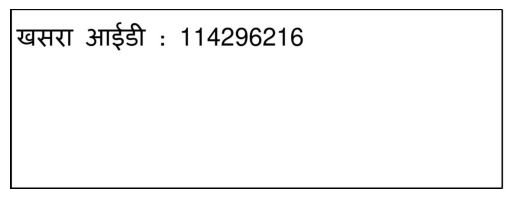


-----------------------------------------------------------------------------------

row_id = 61
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/064/064_pg1/pdf_to_images/column_0_row_1_064_pg1_cropped.jpg

SS —_——


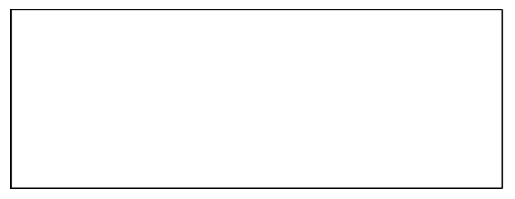


-----------------------------------------------------------------------------------

row_id = 62
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_0_row_2_032_pg2_cropped.jpg

ऋण पुस्तिकाः:0 75687


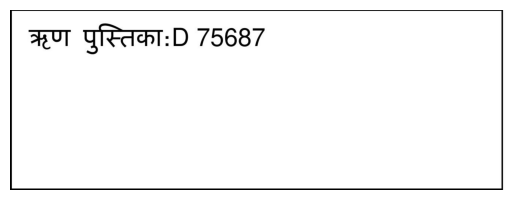


-----------------------------------------------------------------------------------

row_id = 63
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_0_row_3_032_pg2_cropped.jpg

ऋण पुस्तिकाः:0 75687


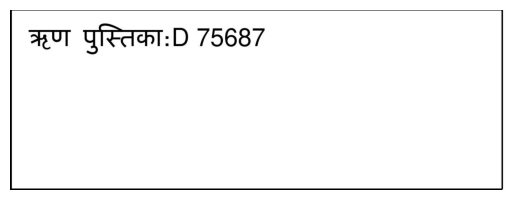


-----------------------------------------------------------------------------------

row_id = 64
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_0_row_1_032_pg2_cropped.jpg

ऋण पुस्तिका:0 75687


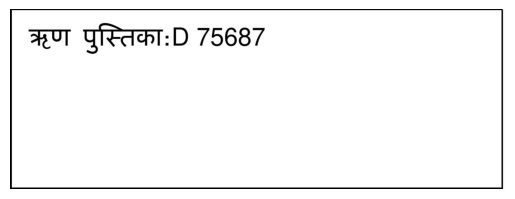


-----------------------------------------------------------------------------------

row_id = 65
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_0_row_1_032_pg1_cropped.jpg

ऋण पुस्तिका:0 75687


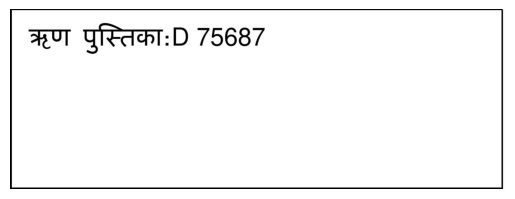


-----------------------------------------------------------------------------------

row_id = 66
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_0_row_4_032_pg1_cropped.jpg

ऋण पुस्तिका:0 75687


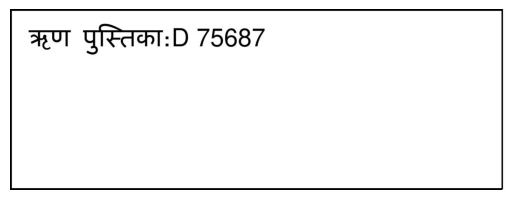


-----------------------------------------------------------------------------------

row_id = 67
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_0_row_2_032_pg1_cropped.jpg

ऋण पुस्तिकाः:0 75687


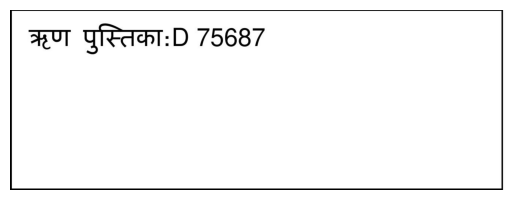


-----------------------------------------------------------------------------------

row_id = 68
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_0_row_3_032_pg1_cropped.jpg

ऋण पुस्तिकाः:0 75687


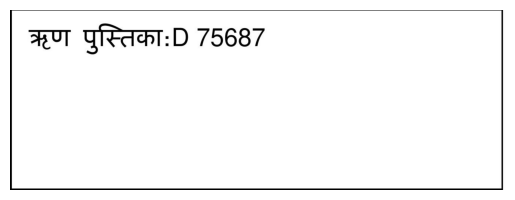


-----------------------------------------------------------------------------------

row_id = 69
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/055/055_pg1/pdf_to_images/column_0_row_1_055_pg1_cropped.jpg

खसरा आईडी : 123563457


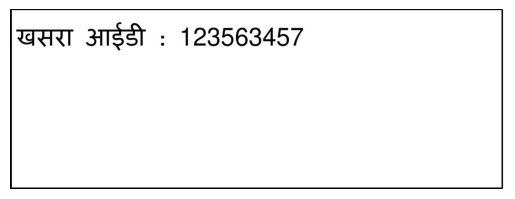


-----------------------------------------------------------------------------------

row_id = 70
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/022/022_pg1/pdf_to_images/column_0_row_1_022_pg1_cropped.jpg

खसरा आईडी : 124671459 ऋण
पुस्तिका:3533619
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दहै जो खसरा नं. 10/4 स

३ लिया गया द्वै


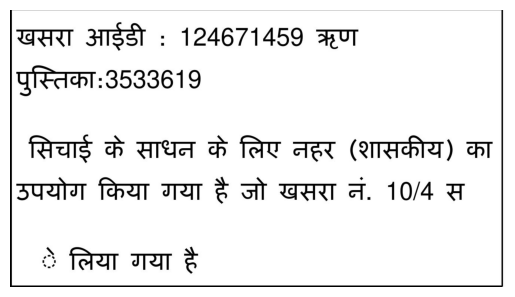


-----------------------------------------------------------------------------------

row_id = 71
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/049/049_pg1/pdf_to_images/column_0_row_1_049_pg1_cropped.jpg

खसरा आईडी : 108323972 अ.वन885पे


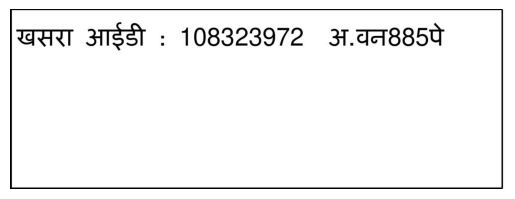


-----------------------------------------------------------------------------------

row_id = 72
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/058/058_pg1/pdf_to_images/column_0_row_1_058_pg1_cropped.jpg

खसरा आईडी : 108206876 बड़े झाड़ के
जंगल


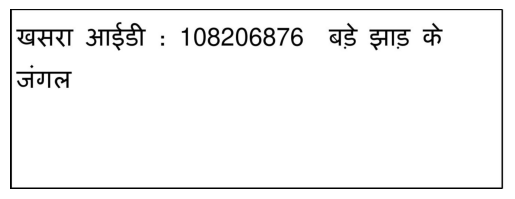


-----------------------------------------------------------------------------------

row_id = 73
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/060/060_pg1/pdf_to_images/column_0_row_2_060_pg1_cropped.jpg

खसरा आईडी : 101556775
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है जो खसरा नं. 30 स

र लिया गया दै


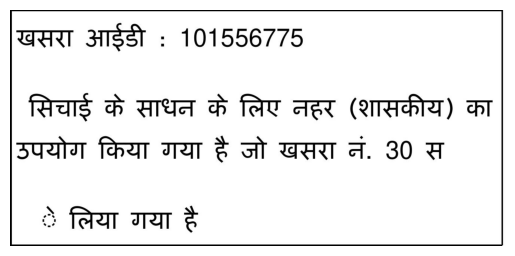


-----------------------------------------------------------------------------------

row_id = 74
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/060/060_pg1/pdf_to_images/column_0_row_1_060_pg1_cropped.jpg

खसरा आईडी : 101440343
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है जो खसरा नं. 30 स

र लिया गया दै


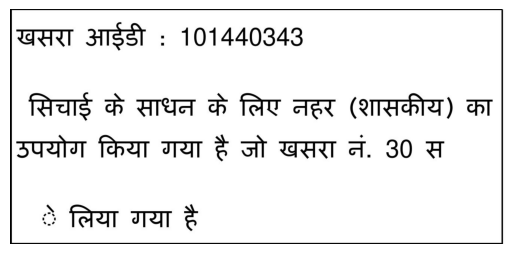


-----------------------------------------------------------------------------------

row_id = 75
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/037/037_pg1/pdf_to_images/column_0_row_1_037_pg1_cropped.jpg

खसरा आईडी : 105722086 भारी उद्योग क्षेत्र
के लिए सुरक्षित न्या./ अति. तह.के
रा.मा.क्र.01 /अ/6सन2012/13 आदेश दि.
11/10/2012 क अनुसारन्या. अति. तह.के
रा.मा.क्र.01 /अ/6सन2012/13 आदेश दि.
11/10/2012 क अनुसार


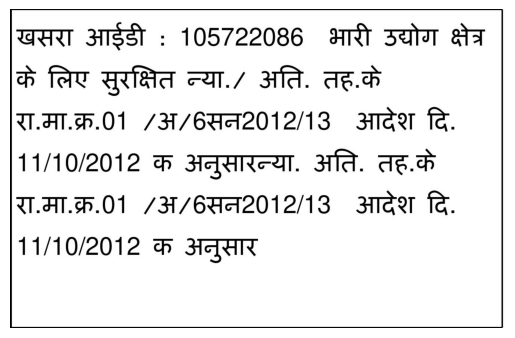


-----------------------------------------------------------------------------------

row_id = 76
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/061/061_pg1/pdf_to_images/column_0_row_1_061_pg1_cropped.jpg

खसरा आईडी : 105722633 जिला व्यापार
एव उद्योग केन्द्र दुर्ग के पत्र क्र 8416 दि.
16/09/2011 के संदर्भ मे अति. तह. आदेश
दि. 19/09/2011 के अनुसार


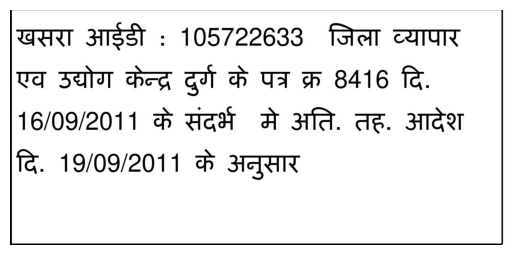


-----------------------------------------------------------------------------------

row_id = 77
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/034/034_pg1/pdf_to_images/column_0_row_1_034_pg1_cropped.jpg

SS —_——


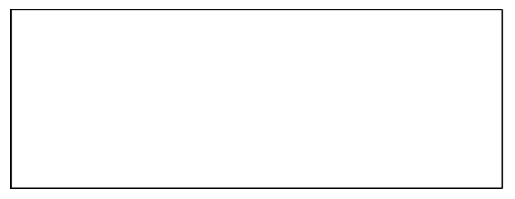


-----------------------------------------------------------------------------------

row_id = 78
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/046/046_pg1/pdf_to_images/column_0_row_1_046_pg1_cropped.jpg

खसरा आईडी : 109026606 सरार


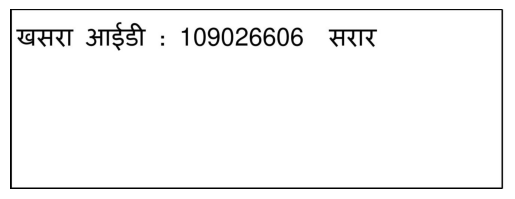


-----------------------------------------------------------------------------------

row_id = 79
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_0_row_2_052_pg1_cropped.jpg

खसरा आईडी : 120961442 ऋण
पुस्तिका:6583

यह खसरा HDFC BANK, MUNGELI RD -
BILASPUR(HDFCO0002414) में दिनॉक- 06-
Feb-2021 से बंधक है|


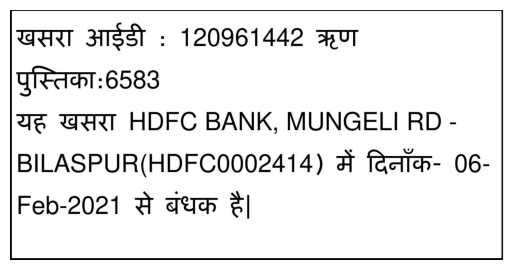


-----------------------------------------------------------------------------------

row_id = 80
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_0_row_3_052_pg1_cropped.jpg

खसरा आईडी : 120925380 ऋण
पुस्तिका:6583

यह खसरा HDFC BANK, MUNGELI RD -
BILASPUR(HDFCO0002414) में दिनॉक- 06-
Feb-2021 से बंधक है|


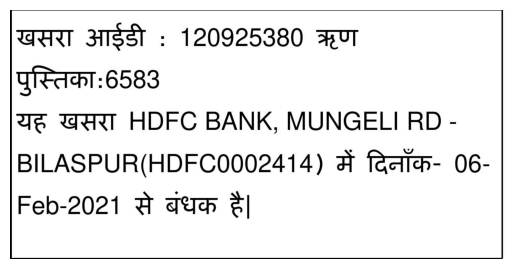


-----------------------------------------------------------------------------------

row_id = 81
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_0_row_1_052_pg1_cropped.jpg

खसरा आईडी : 120962835 ऋण
पुस्तिका:6583

यह खसरा HDFC BANK, MUNGELI RD -
BILASPUR(HDFCO0002414) में दिनॉक- 06-
Feb-2021 से बंधक है|


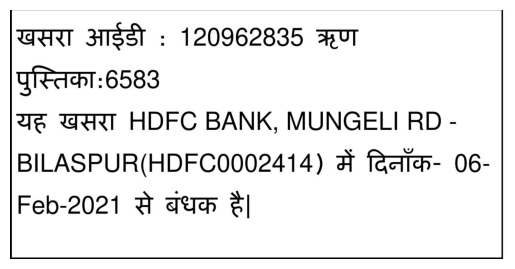


-----------------------------------------------------------------------------------

row_id = 82
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg2/pdf_to_images/column_0_row_1_059_pg2_cropped.jpg

खसरा आईडी : 104611438 ऋण

पुस्तिका:3551146

सिचाई के साधन के लिए नलकूप (निजी) का

उपयोग किया गया दै जो खसरा नं. 344/2 स
लिया गया दै


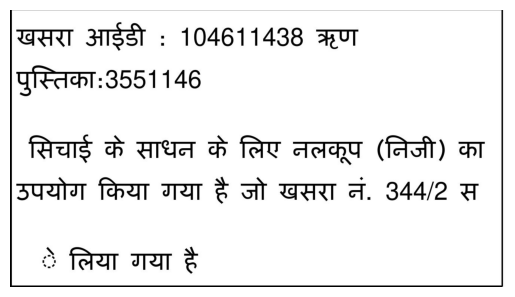


-----------------------------------------------------------------------------------

row_id = 83
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_0_row_2_059_pg1_cropped.jpg

खसरा आईडी : 104647085 ऋण

पुस्तिका:3551146 *

सिचाई के साधन के लिए नलकूप (निजी) का

उपयोग किया गया है जो खसरा नं. 344/2 स
`; लिया गया है


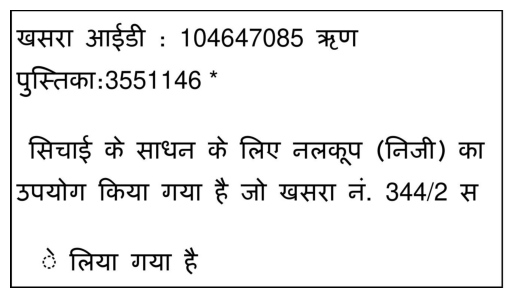


-----------------------------------------------------------------------------------

row_id = 84
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_0_row_1_059_pg1_cropped.jpg

खसरा आईडी : 104611437 ऋण

पुस्तिका:3551146 *

सिचाई के साधन के लिए नलकूप (निजी) का

उपयोग किया गया दै जो खसरा नं. 344/2 स
लिया गया दै


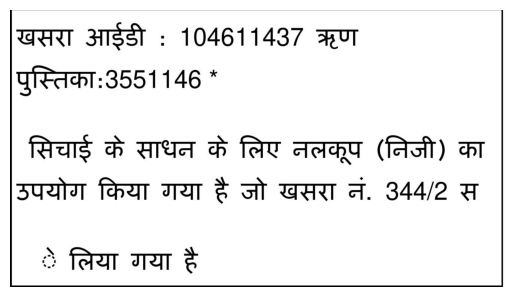


-----------------------------------------------------------------------------------

row_id = 85
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_0_row_3_059_pg1_cropped.jpg

खसरा आईडी : 104647086 ऋण

पुस्तिका:3551146

सिचाई के साधन के लिए नलकूप (निजी) का

उपयोग किया गया है जो खसरा नं. 344/2 स
`; लिया गया है


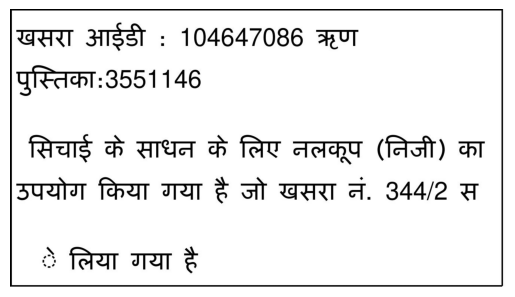


-----------------------------------------------------------------------------------

row_id = 86
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg1/pdf_to_images/column_0_row_1_040_pg1_cropped.jpg

खसरा आईडी : 103142485 ऋण

पुस्तिका:G-640738 *

यह खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


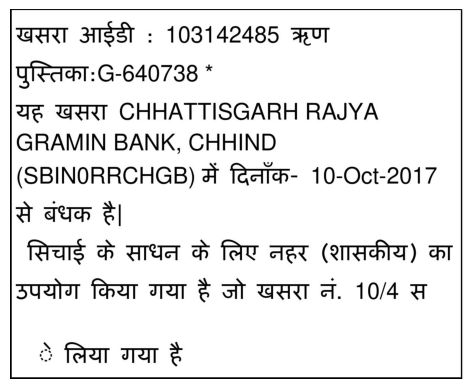


-----------------------------------------------------------------------------------

row_id = 87
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg1/pdf_to_images/column_0_row_2_040_pg1_cropped.jpg

खसरा आईडी : 103142827 ऋण
पुस्तिका:G-640738
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै जो खसरा नं. 10/4 स

३ लिया गया द्वै


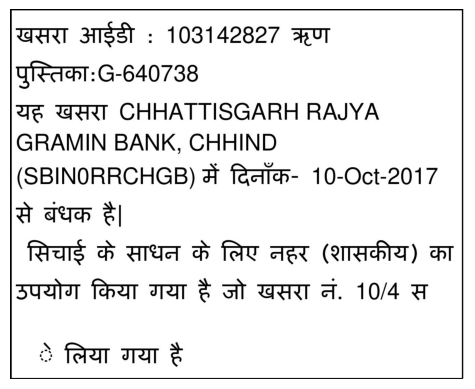


-----------------------------------------------------------------------------------

row_id = 88
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg7/pdf_to_images/column_0_row_1_040_pg7_cropped.jpg

खसरा आईडी : 103142533 ऋण

पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


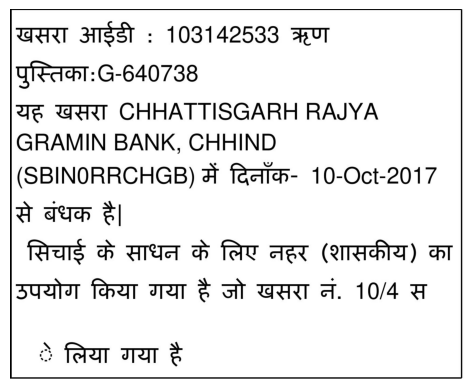


-----------------------------------------------------------------------------------

row_id = 89
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg6/pdf_to_images/column_0_row_2_040_pg6_cropped.jpg

खसरा आईडी : 103080194 ऋण
पुस्तिका:G-640738
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै जो खसरा नं. 10/4 स

३ लिया गया द्वै


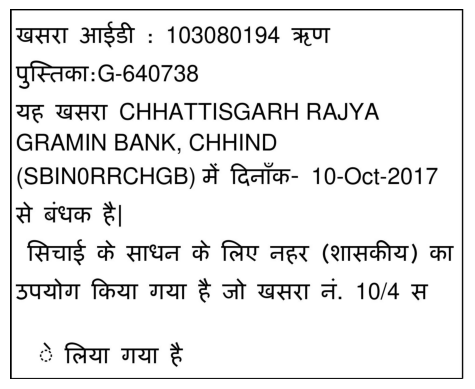


-----------------------------------------------------------------------------------

row_id = 90
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg6/pdf_to_images/column_0_row_1_040_pg6_cropped.jpg

खसरा आईडी : 103132598 ऋण

पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


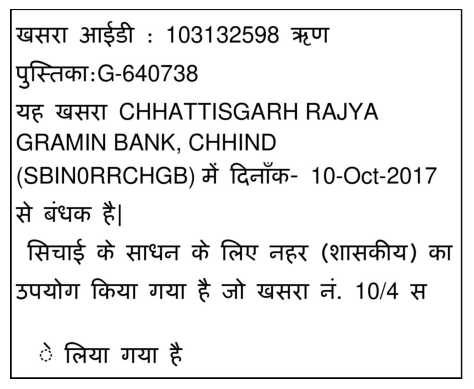


-----------------------------------------------------------------------------------

row_id = 91
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg5/pdf_to_images/column_0_row_1_040_pg5_cropped.jpg

खसरा आईडी : 103085069 ऋण

पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


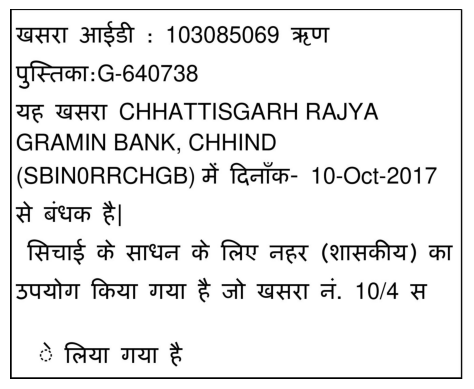


-----------------------------------------------------------------------------------

row_id = 92
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg5/pdf_to_images/column_0_row_2_040_pg5_cropped.jpg

खसरा आईडी : 103079750 ऋण
पुस्तिका:G-640738
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै जो खसरा नं. 10/4 स

३ लिया गया द्वै


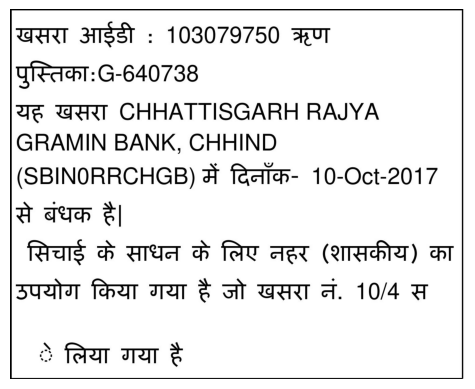


-----------------------------------------------------------------------------------

row_id = 93
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg4/pdf_to_images/column_0_row_2_040_pg4_cropped.jpg

खसरा आईडी : 103080588 ऋण
पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|


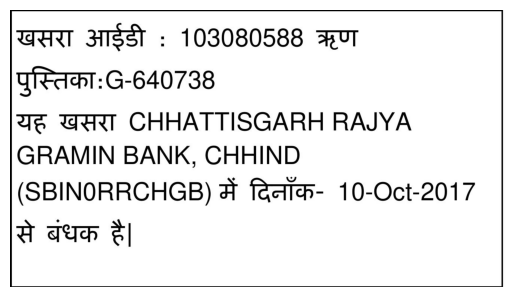


-----------------------------------------------------------------------------------

row_id = 94
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg4/pdf_to_images/column_0_row_1_040_pg4_cropped.jpg

खसरा आईडी : 103080521 ऋण
पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनाँंक- 10-Oct-2017
से बंधक ट|


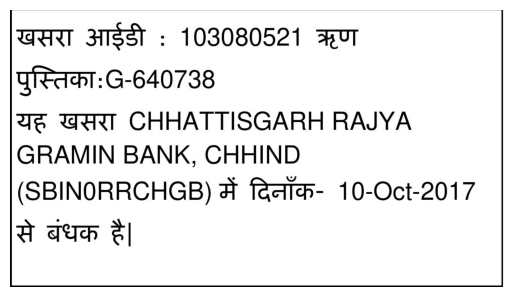


-----------------------------------------------------------------------------------

row_id = 95
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg2/pdf_to_images/column_0_row_2_040_pg2_cropped.jpg

खसरा आईडी : 103080502 ऋण
पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|


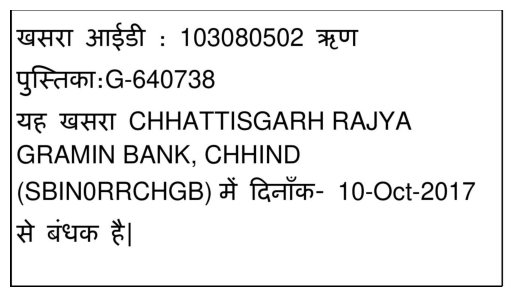


-----------------------------------------------------------------------------------

row_id = 96
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg2/pdf_to_images/column_0_row_1_040_pg2_cropped.jpg

खसरा आईडी : 103085018 ऋण

पुस्तिका:G-640738

यह खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


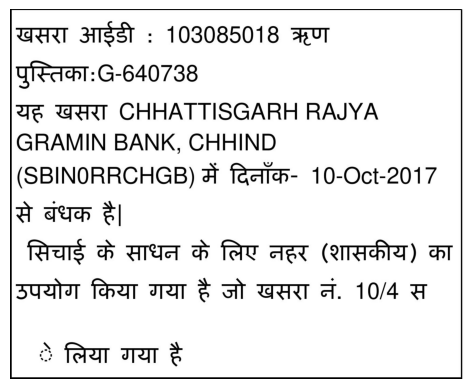


-----------------------------------------------------------------------------------

row_id = 97
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg3/pdf_to_images/column_0_row_2_040_pg3_cropped.jpg

खसरा आईडी : 103143144 ऋण
पुस्तिका:G-640738
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHHIND
(SBINORRCHGB) में दिनॉंक- 10-Oct-2017
से बंधक ट|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै जो खसरा नं. 10/4 स

३ लिया गया द्वै


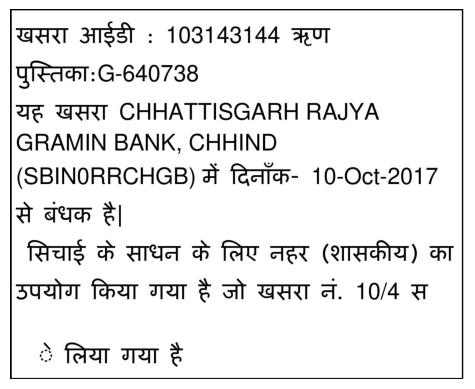


-----------------------------------------------------------------------------------

row_id = 98
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg3/pdf_to_images/column_0_row_1_040_pg3_cropped.jpg

खसरा आईडी : 103080503 ऋण

पुस्तिका:G-640738

यद खसरा CHHATTISGARH RAJYA

GRAMIN BANK, CHHIND

(SBINORRCHGB) में दिनाँंक- 10-Oct-2017

से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का

उपयोग किया गया दै जो खसरा नं. 10/4 स
लिया गया दै


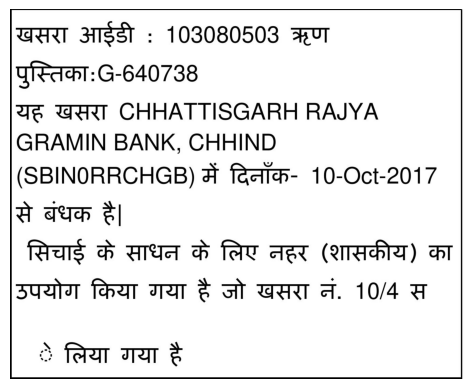


-----------------------------------------------------------------------------------

row_id = 99
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_0_row_4_021_pg1_cropped.jpg

खसरा आईडी : 120316144 ऋण
पुस्तिका:2358394 *


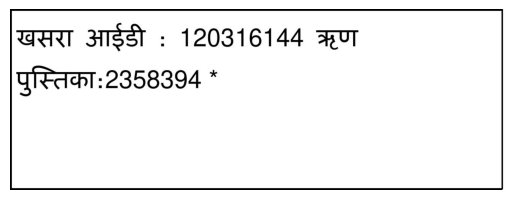


-----------------------------------------------------------------------------------

row_id = 100
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_0_row_1_021_pg1_cropped.jpg

खसरा आईडी : 120315902 ऋण
पुस्तिका:2358394


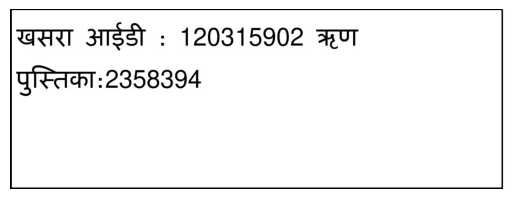


-----------------------------------------------------------------------------------

row_id = 101
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_0_row_2_021_pg1_cropped.jpg

खसरा आईडी : 120316744 ऋण
पुस्तिका:2358394 *


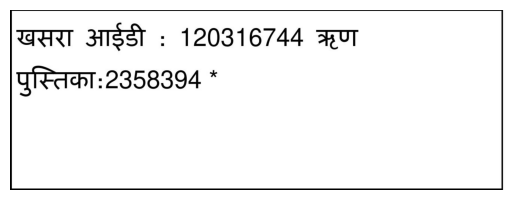


-----------------------------------------------------------------------------------

row_id = 102
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_0_row_3_021_pg1_cropped.jpg

खसरा आईडी : 125252344 ऋण
पुस्तिका:2358394


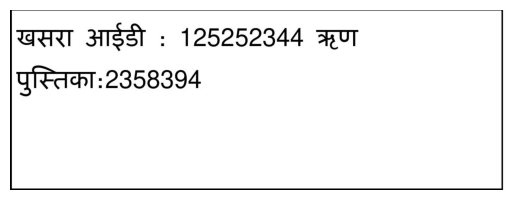


-----------------------------------------------------------------------------------

row_id = 103
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg2/pdf_to_images/column_0_row_1_021_pg2_cropped.jpg

खसरा आईडी : 120316308 ऋण
पुस्तिका:2358394


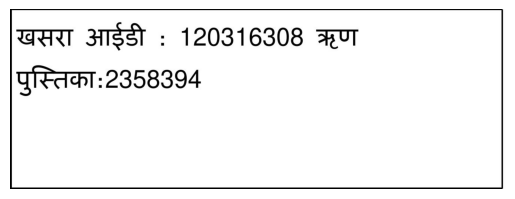


-----------------------------------------------------------------------------------

row_id = 104
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/066/066_pg1/pdf_to_images/column_0_row_1_066_pg1_cropped.jpg

खसरा आईडी : 104102742


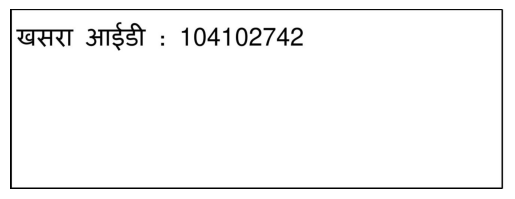


-----------------------------------------------------------------------------------

row_id = 105
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/035/035_pg1/pdf_to_images/column_0_row_1_035_pg1_cropped.jpg

खसरा आईडी : 117465469

सिचाई के साधन के लिए नलकूप (निजी) का

उपयोग किया गया दहै जो खसरा नं. 107/10 स
र लिया गया दै


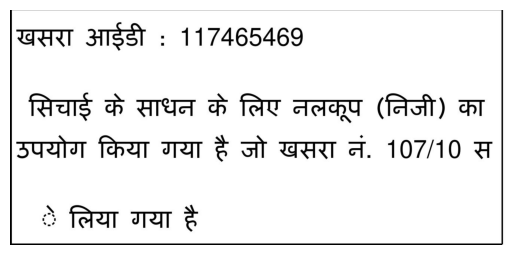


-----------------------------------------------------------------------------------

row_id = 106
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_0_row_4_053_pg1_cropped.jpg

खसरा आईडी : 107971660 ऋण
पुस्तिका:0519434 तेंदु 20, टिंवसा 2,पिकड
1,महुआ 1


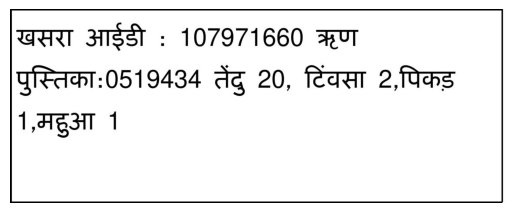


-----------------------------------------------------------------------------------

row_id = 107
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_0_row_1_053_pg1_cropped.jpg

खसरा आईडी : 107972680 ऋण
पुस्तिका:0519434 इमली 1,आम2,कटहल
1,आदन 1,बांस 1गुच्चा,बीजा 1*


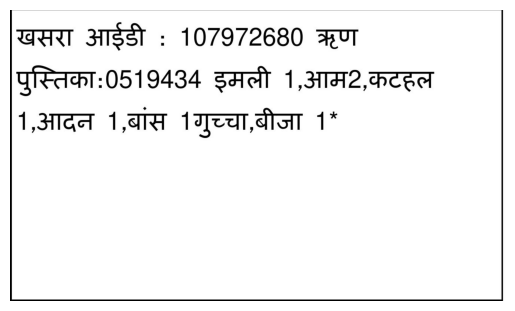


-----------------------------------------------------------------------------------

row_id = 108
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_0_row_2_053_pg1_cropped.jpg

———


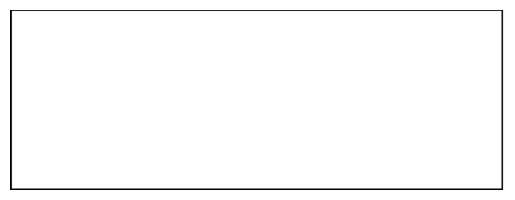


-----------------------------------------------------------------------------------

row_id = 109
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_0_row_3_053_pg1_cropped.jpg

खसरा आईडी : 107985809 ऋण
पुस्तिका:0519434 महुआ 9,इमली 1, बेहडा
2,आम 6


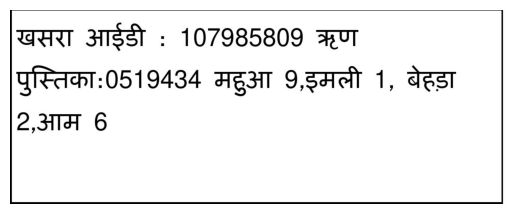


-----------------------------------------------------------------------------------

row_id = 110
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg2/pdf_to_images/column_0_row_1_053_pg2_cropped.jpg

खसरा आईडी : 107974320 ऋण
पुस्तिका:0519434


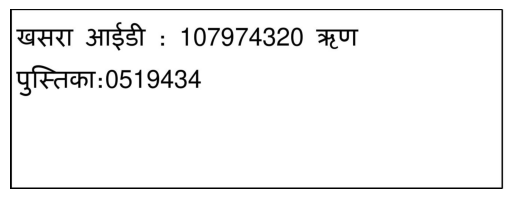


-----------------------------------------------------------------------------------

row_id = 111
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/051/051_pg1/pdf_to_images/column_0_row_2_051_pg1_cropped.jpg

खसरा आईडी : 111662525 ऋण
पुस्तिका:?631632


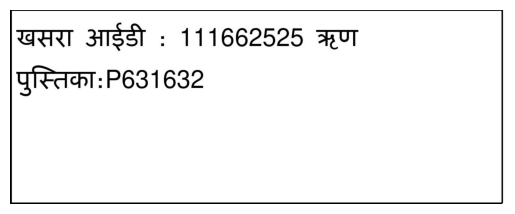


-----------------------------------------------------------------------------------

row_id = 112
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/051/051_pg1/pdf_to_images/column_0_row_1_051_pg1_cropped.jpg

खसरा आईडी : 111661306 ऋण
पुस्तिका:?631632


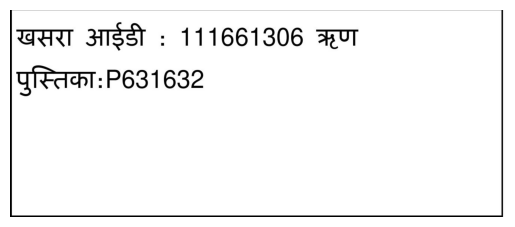


-----------------------------------------------------------------------------------

row_id = 113
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/024/024_pg1/pdf_to_images/column_0_row_1_024_pg1_cropped.jpg

खसरा आईडी : 103240397


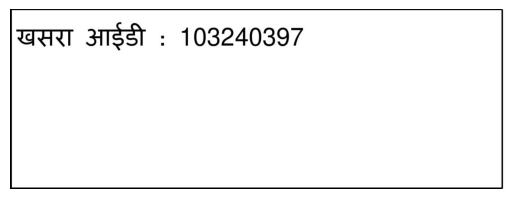


-----------------------------------------------------------------------------------

row_id = 114
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_0_row_1_017_pg2_cropped.jpg

खसरा आईडी : 107972868


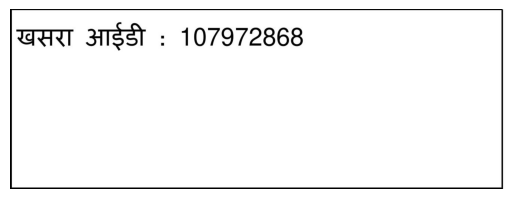


-----------------------------------------------------------------------------------

row_id = 115
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_0_row_2_017_pg2_cropped.jpg

खसरा आईडी : 107985813


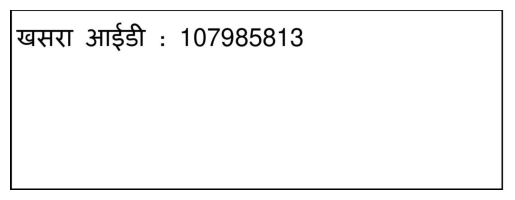


-----------------------------------------------------------------------------------

row_id = 116
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_0_row_3_017_pg2_cropped.jpg

खसरा आईडी : 107985827


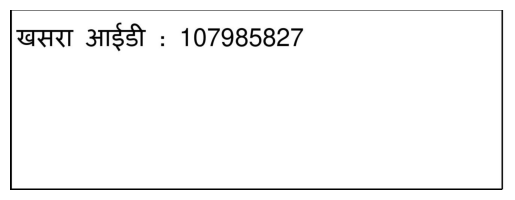


-----------------------------------------------------------------------------------

row_id = 117
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_0_row_4_017_pg1_cropped.jpg

खसरा आईडी : 107985860


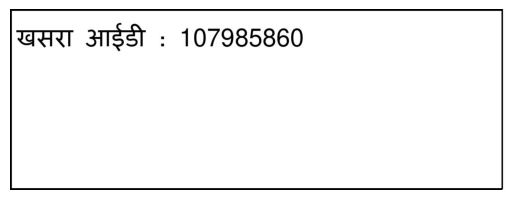


-----------------------------------------------------------------------------------

row_id = 118
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_0_row_1_017_pg1_cropped.jpg

खसरा आईडी : 107985842 0000


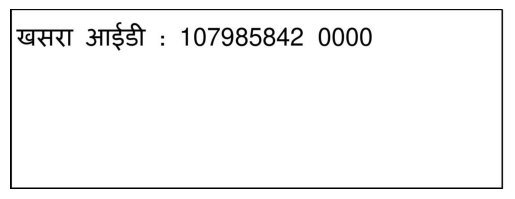


-----------------------------------------------------------------------------------

row_id = 119
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_0_row_3_017_pg1_cropped.jpg

खसरा आईडी : 107971561


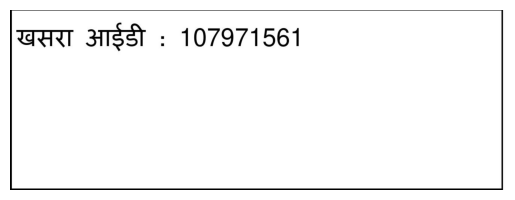


-----------------------------------------------------------------------------------

row_id = 120
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_0_row_2_017_pg1_cropped.jpg

खसरा आईडी : 107972711


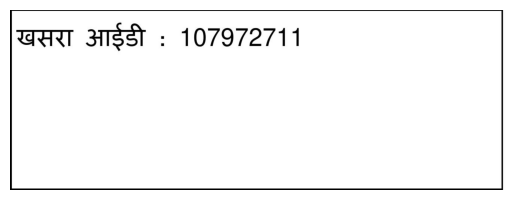


-----------------------------------------------------------------------------------

row_id = 121
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/047/047_pg1/pdf_to_images/column_0_row_1_047_pg1_cropped.jpg

खसरा आईडी : 119707988


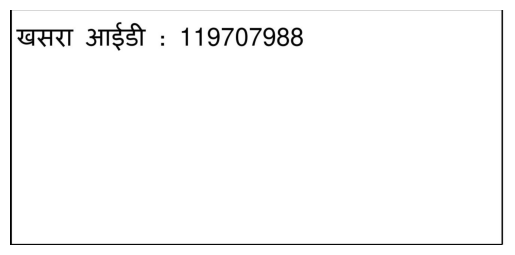


-----------------------------------------------------------------------------------

row_id = 122
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/043/043_pg1/pdf_to_images/column_0_row_1_043_pg1_cropped.jpg

खसरा आईडी : 116259873 घास


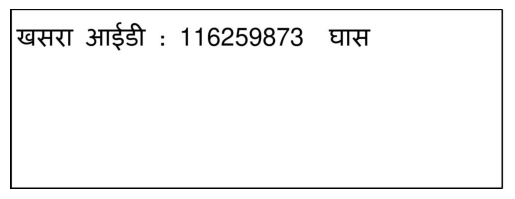


-----------------------------------------------------------------------------------

row_id = 123
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/018/018_pg1/pdf_to_images/column_0_row_1_018_pg1_cropped.jpg

खसरा आईडी : 108324367 अ.वन1450पे


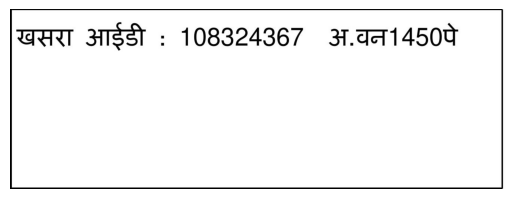


-----------------------------------------------------------------------------------

row_id = 124
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_0_row_3_057_pg4_cropped.jpg

खसरा आईडी : 100652533


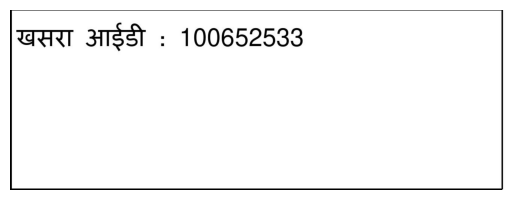


-----------------------------------------------------------------------------------

row_id = 125
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_0_row_2_057_pg4_cropped.jpg

खसरा आईडी : 100640841


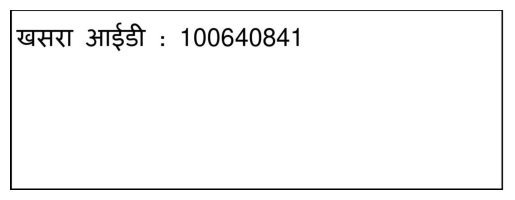


-----------------------------------------------------------------------------------

row_id = 126
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_0_row_1_057_pg4_cropped.jpg

खसरा आईडी : 100715344


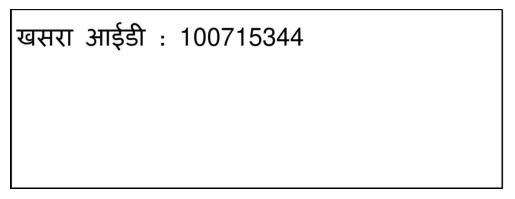


-----------------------------------------------------------------------------------

row_id = 127
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_0_row_1_057_pg1_cropped.jpg

खसरा आईडी : 100715153 *


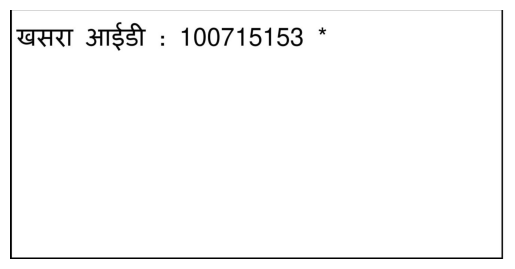


-----------------------------------------------------------------------------------

row_id = 128
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_0_row_2_057_pg1_cropped.jpg

खसरा आईडी : 100640633


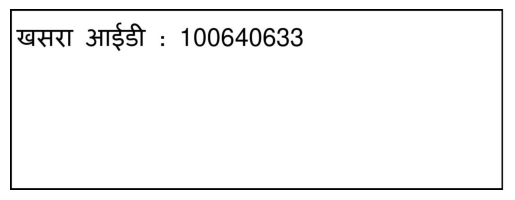


-----------------------------------------------------------------------------------

row_id = 129
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_0_row_3_057_pg1_cropped.jpg

खसरा आईडी : 100652314


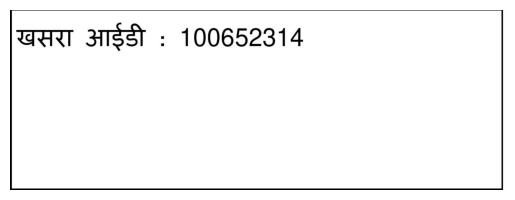


-----------------------------------------------------------------------------------

row_id = 130
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_0_row_4_057_pg1_cropped.jpg

खसरा आईडी : 100715297


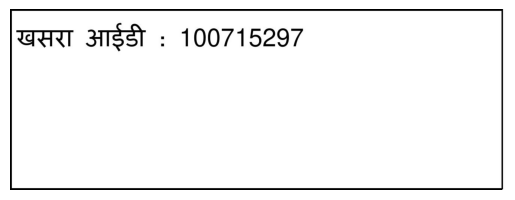


-----------------------------------------------------------------------------------

row_id = 131
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_0_row_3_057_pg2_cropped.jpg

खसरा आईडी : 100652351


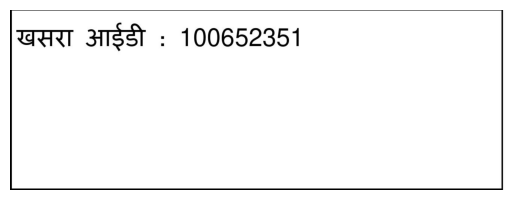


-----------------------------------------------------------------------------------

row_id = 132
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_0_row_4_057_pg2_cropped.jpg

खसरा आईडी : 100639972


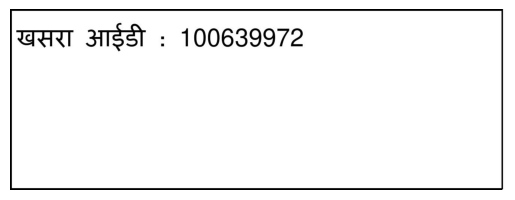


-----------------------------------------------------------------------------------

row_id = 133
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_0_row_2_057_pg2_cropped.jpg

खसरा आईडी : 100652350 आम (मैंगो)
1


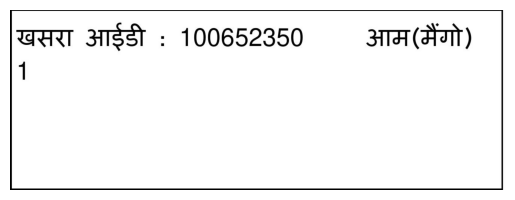


-----------------------------------------------------------------------------------

row_id = 134
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_0_row_1_057_pg2_cropped.jpg

खसरा आईडी : 100640793 मकान


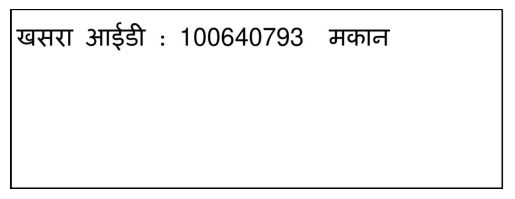


-----------------------------------------------------------------------------------

row_id = 135
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_0_row_2_057_pg3_cropped.jpg

खसरा आईडी : 100715342


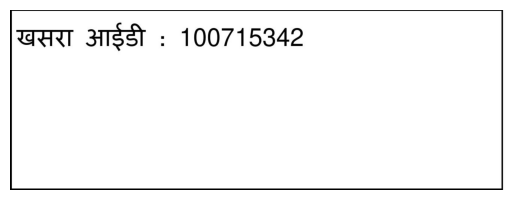


-----------------------------------------------------------------------------------

row_id = 136
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_0_row_3_057_pg3_cropped.jpg

खसरा आईडी : 100640001


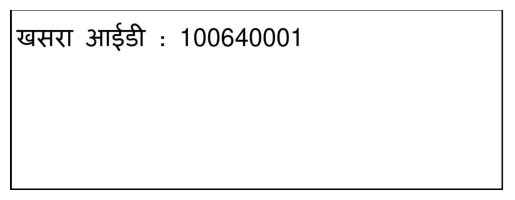


-----------------------------------------------------------------------------------

row_id = 137
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_0_row_4_057_pg3_cropped.jpg

खसरा आईडी : 100715343


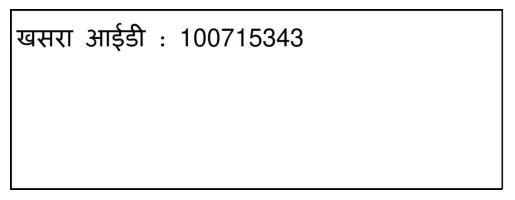


-----------------------------------------------------------------------------------

row_id = 138
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_0_row_1_057_pg3_cropped.jpg

खसरा आईडी : 100652493


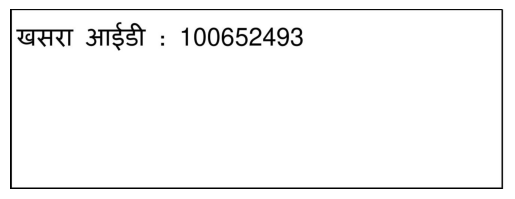


-----------------------------------------------------------------------------------

row_id = 139
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_0_row_3_036_pg3_cropped.jpg

खसरा आईडी : 114296274 ऋण
पुस्तिका:m-55769

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|


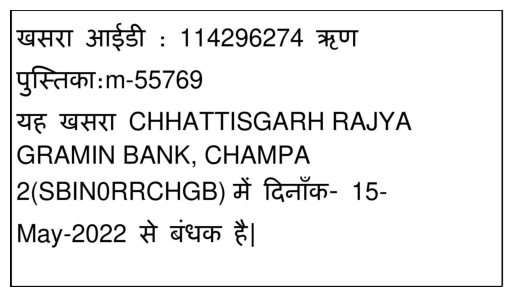


-----------------------------------------------------------------------------------

row_id = 140
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_0_row_2_036_pg3_cropped.jpg

खसरा आईडी : 114296187 ऋण
पुस्तिका:m-55769

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक ट|


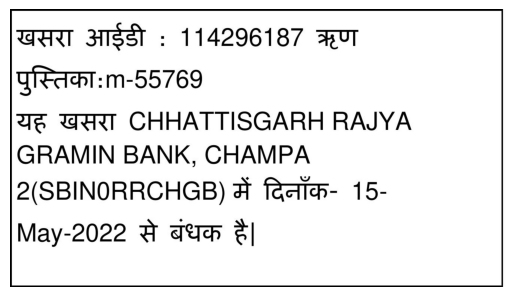


-----------------------------------------------------------------------------------

row_id = 141
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_0_row_1_036_pg3_cropped.jpg

खसरा आईडी : 114296575 ऋण
पुस्तिका:m-55769

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


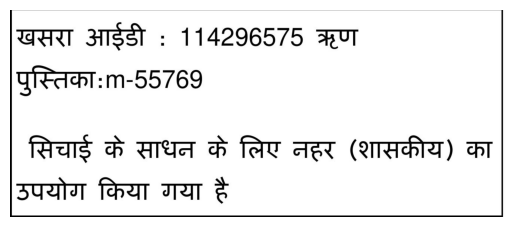


-----------------------------------------------------------------------------------

row_id = 142
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg2/pdf_to_images/column_0_row_1_036_pg2_cropped.jpg

खसरा आईडी : 114296517 ऋण
पुस्तिका:00-55769 सिंचाई शासकीय नहर
से

यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


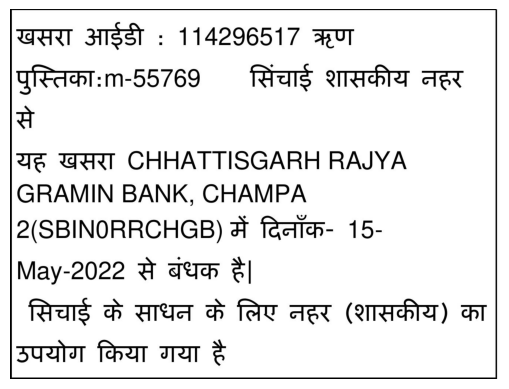


-----------------------------------------------------------------------------------

row_id = 143
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg2/pdf_to_images/column_0_row_2_036_pg2_cropped.jpg

खसरा आईडी : 114296557 ऋण
पुस्तिका:m-55769
यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


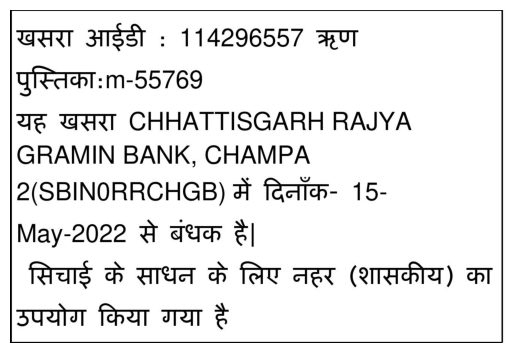


-----------------------------------------------------------------------------------

row_id = 144
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg4/pdf_to_images/column_0_row_2_036_pg4_cropped.jpg

खसरा आईडी : 114296424 ऋण
पुस्तिका:m-55769
यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


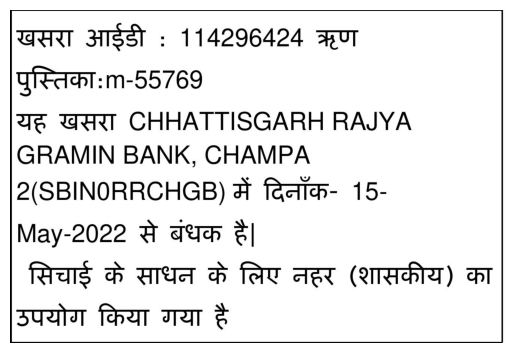


-----------------------------------------------------------------------------------

row_id = 145
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg4/pdf_to_images/column_0_row_1_036_pg4_cropped.jpg

खसरा आईडी : 114296423 ऋण
पुस्तिका:m-55769
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


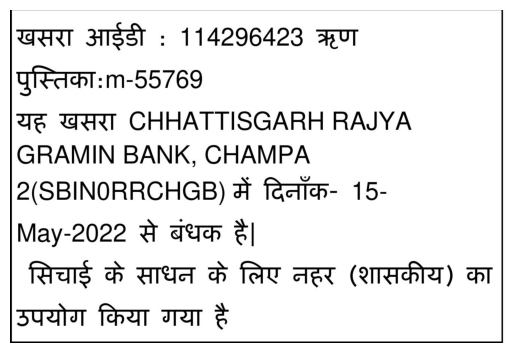


-----------------------------------------------------------------------------------

row_id = 146
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg5/pdf_to_images/column_0_row_1_036_pg5_cropped.jpg

खसरा आईडी : 114296447 ऋण
पुस्तिका:m-55769
यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


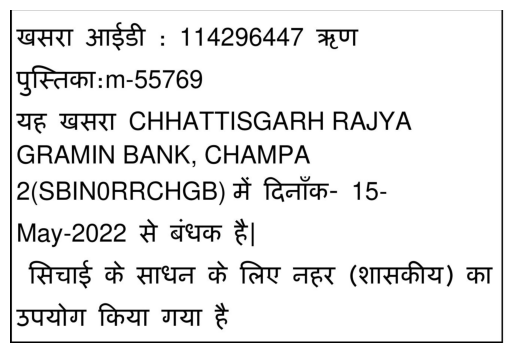


-----------------------------------------------------------------------------------

row_id = 147
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg5/pdf_to_images/column_0_row_2_036_pg5_cropped.jpg

खसरा आईडी : 114296494 ऋण
पुस्तिका:m-55769

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक है|


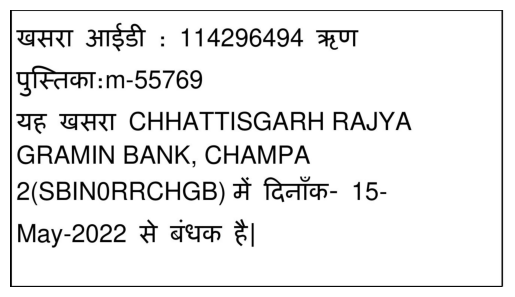


-----------------------------------------------------------------------------------

row_id = 148
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg1/pdf_to_images/column_0_row_2_036_pg1_cropped.jpg

खसरा आईडी : 114296349 ऋण
पुस्तिका:00-55769 सिंचाई शासकीय नहर
से

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक ट|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


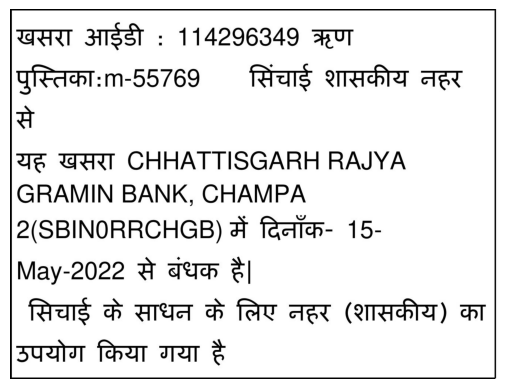


-----------------------------------------------------------------------------------

row_id = 149
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg1/pdf_to_images/column_0_row_1_036_pg1_cropped.jpg

खसरा आईडी : 114296602 ऋण
पुस्तिका:m-55769
न्याया.तहसीलदार.चाम्पा.के.रा.प्र.क्र.31अ6/2017
-18 में आदेश दि.14/06/18

सिंचाई शासकीय नहर से

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, CHAMPA
2(SBINORRCHGB) में दिनॉक- 15-
May-2022 से बंधक ट|


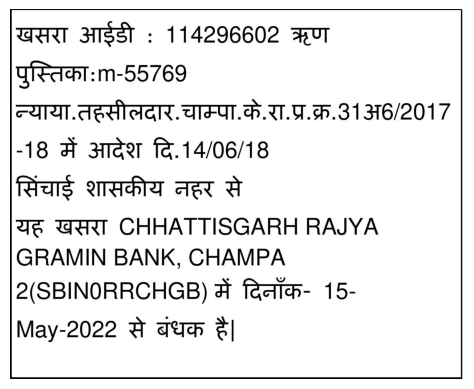


-----------------------------------------------------------------------------------

row_id = 150
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/027/027_pg1/pdf_to_images/column_0_row_1_027_pg1_cropped.jpg

खसरा आईडी : 104143069


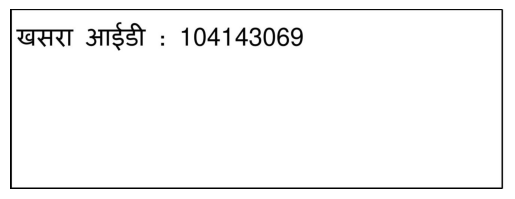


-----------------------------------------------------------------------------------

row_id = 151
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_0_row_1_031_pg2_cropped.jpg

खसरा आईडी : 120938976 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनाँक- 29-May-2015
से बंधक ट|


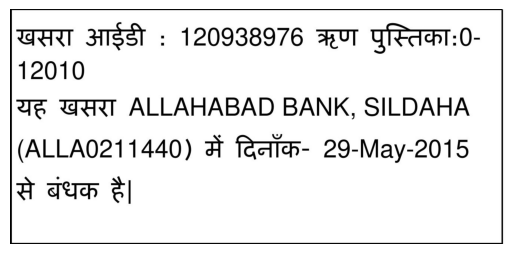


-----------------------------------------------------------------------------------

row_id = 152
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_0_row_2_031_pg2_cropped.jpg

खसरा आईडी : 120962843 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


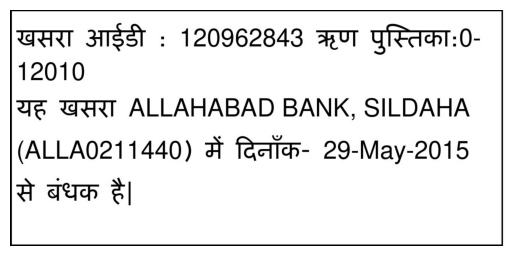


-----------------------------------------------------------------------------------

row_id = 153
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_0_row_3_031_pg2_cropped.jpg

खसरा आईडी : 120961758 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


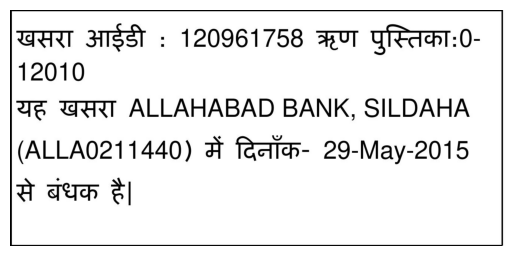


-----------------------------------------------------------------------------------

row_id = 154
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_0_row_3_031_pg3_cropped.jpg

खसरा आईडी : 120963123 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


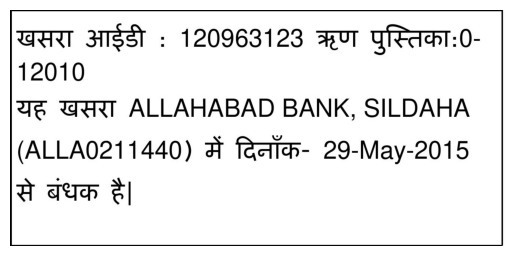


-----------------------------------------------------------------------------------

row_id = 155
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_0_row_2_031_pg3_cropped.jpg

खसरा आईडी : 120961765 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


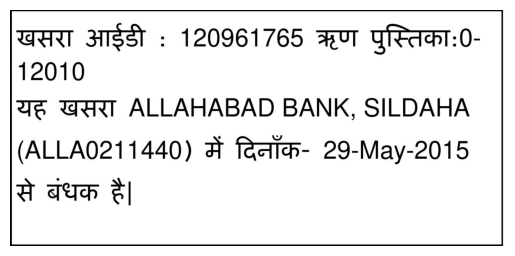


-----------------------------------------------------------------------------------

row_id = 156
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_0_row_1_031_pg3_cropped.jpg

खसरा आईडी : 120961764 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनाँक- 29-May-2015
से बंधक ट|


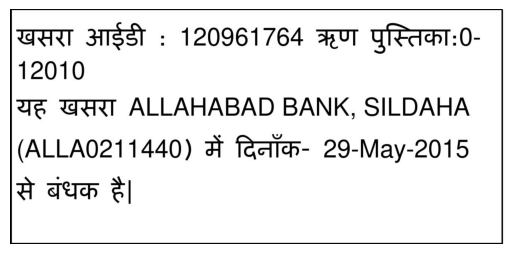


-----------------------------------------------------------------------------------

row_id = 157
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg4/pdf_to_images/column_0_row_1_031_pg4_cropped.jpg

खसरा आईडी : 120939372 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉँक- 29-May-2015
से बंधक ट|


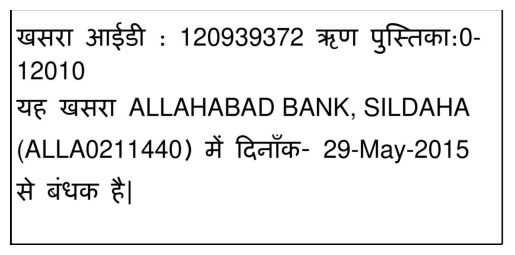


-----------------------------------------------------------------------------------

row_id = 158
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_0_row_1_031_pg1_cropped.jpg

खसरा आईडी : 120963180 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनाँक- 29-May-2015
से बंधक ट|


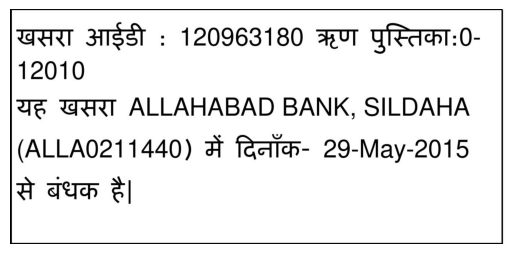


-----------------------------------------------------------------------------------

row_id = 159
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_0_row_3_031_pg1_cropped.jpg

खसरा आईडी : 120938875 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


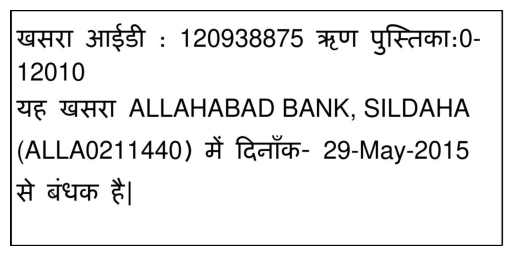


-----------------------------------------------------------------------------------

row_id = 160
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_0_row_2_031_pg1_cropped.jpg

खसरा आईडी : 120963181 ऋण पुस्तिकाः0-
12010

यह खसरा ALLAHABAD BANK, SILDAHA
(ALLAO0211440) में दिनॉक- 29-May-2015
से बंधक ट|


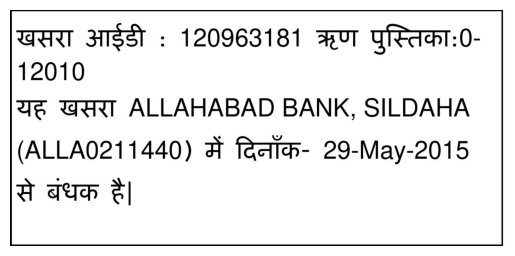


-----------------------------------------------------------------------------------

row_id = 161
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/045/045_pg1/pdf_to_images/column_0_row_1_045_pg1_cropped.jpg

खसरा आईडी : 112282087 मकान


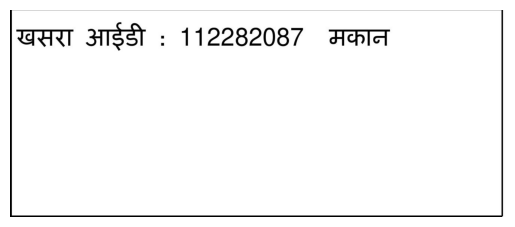


-----------------------------------------------------------------------------------

row_id = 162
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_0_row_1_028_pg1_cropped.jpg

खसरा आईडी : 120315716 ऋण
पुस्तिका:p-2101153


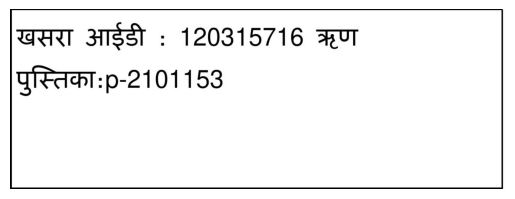


-----------------------------------------------------------------------------------

row_id = 163
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_0_row_3_028_pg1_cropped.jpg

खसरा आईडी : 120331560 ऋण
पुस्तिका:p-2101153


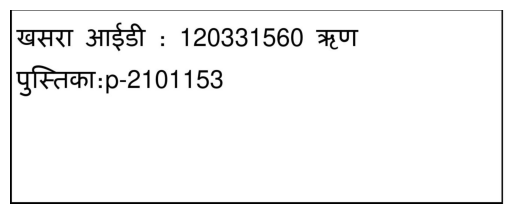


-----------------------------------------------------------------------------------

row_id = 164
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_0_row_4_028_pg1_cropped.jpg

खसरा आईडी : 120331582 ऋण
पुस्तिका:p-2101153


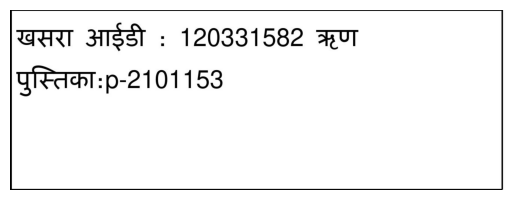


-----------------------------------------------------------------------------------

row_id = 165
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_0_row_2_028_pg1_cropped.jpg

खसरा आईडी : 120331550 ऋण
पुस्तिका:p-2101153 228


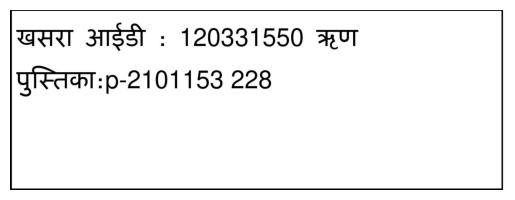


-----------------------------------------------------------------------------------

row_id = 166
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/062/062_pg1/pdf_to_images/column_0_row_1_062_pg1_cropped.jpg

खसरा आईडी : 119706000


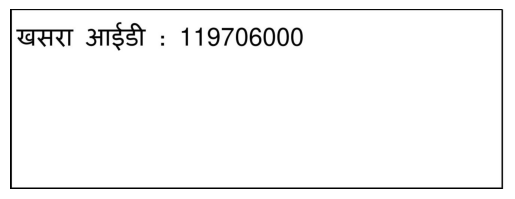


-----------------------------------------------------------------------------------

row_id = 167
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/062/062_pg1/pdf_to_images/column_0_row_2_062_pg1_cropped.jpg

खसरा आईडी : 119732217


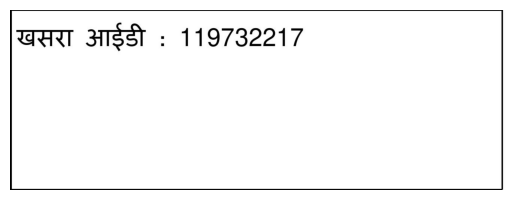


-----------------------------------------------------------------------------------

row_id = 168
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_0_row_2_039_pg2_cropped.jpg

खसरा आईडी : 110630457 ऋण
पुस्तिका:2687083

यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Ju।-2020 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


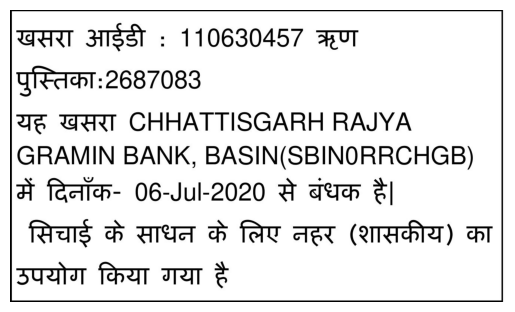


-----------------------------------------------------------------------------------

row_id = 169
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_0_row_1_039_pg2_cropped.jpg

खसरा आईडी : 110631068 ऋण
पुस्तिका:2687083

यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Jul-2020 से बंधक है|


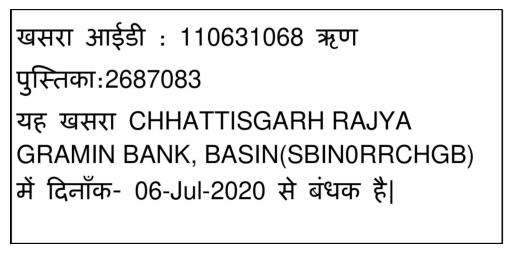


-----------------------------------------------------------------------------------

row_id = 170
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_0_row_3_039_pg2_cropped.jpg

खसरा आईडी : 110679079 ऋण
पुस्तिका:2687083

यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Ju।-2020 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


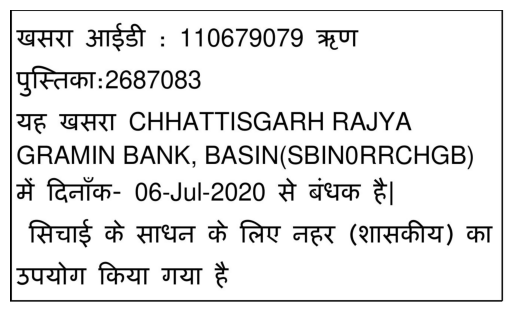


-----------------------------------------------------------------------------------

row_id = 171
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_0_row_1_039_pg3_cropped.jpg

खसरा आईडी : 110631052 ऋण
पुस्तिका:2687083

यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Ju।-2020 से बंधक है|

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


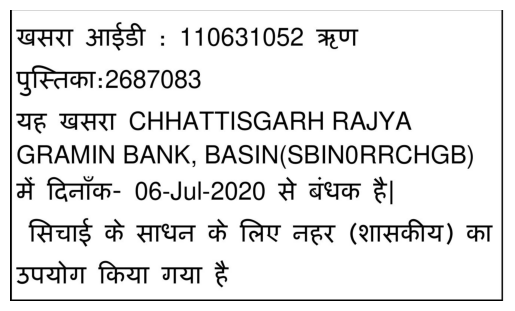


-----------------------------------------------------------------------------------

row_id = 172
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_0_row_3_039_pg3_cropped.jpg

खसरा आईडी : 110631137 ऋण
पुस्तिका:2687083

यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Jul-2020 से बंधक दै

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


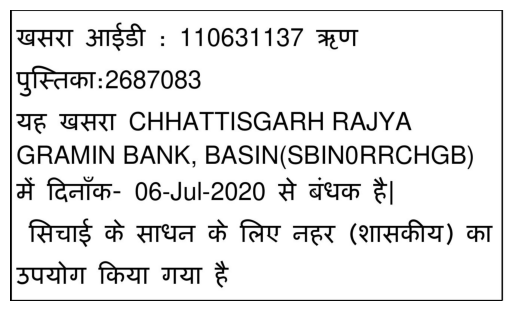


-----------------------------------------------------------------------------------

row_id = 173
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_0_row_2_039_pg3_cropped.jpg

खसरा आईडी : 110679097 ऋण
पुस्तिका:2687083

यद खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Jul-2020 से बंधक दै

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै


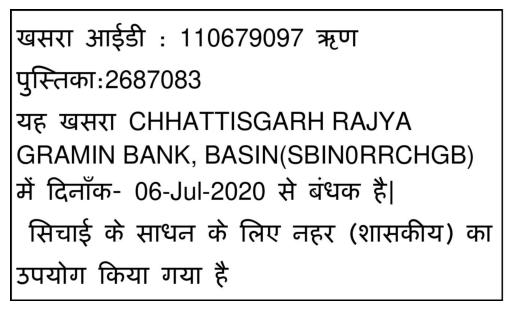


-----------------------------------------------------------------------------------

row_id = 174
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg1/pdf_to_images/column_0_row_2_039_pg1_cropped.jpg

खसरा आईडी : 110645337 ऋण
पुस्तिका:2687083
यदह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Ju।-2020 से बंधक है|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दै जो खसरा नं. 523 स

३ लिया गया द्वै


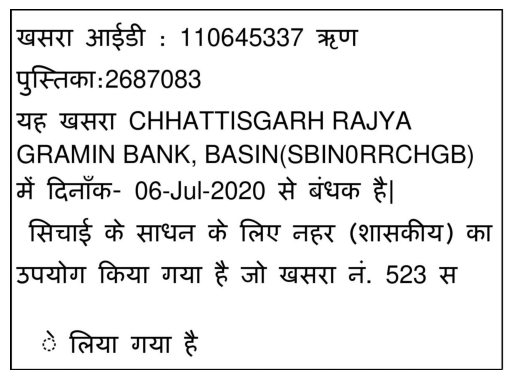


-----------------------------------------------------------------------------------

row_id = 175
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg1/pdf_to_images/column_0_row_1_039_pg1_cropped.jpg

खसरा आईडी : 110645457 ऋण
पुस्तिका:2687083 * मुक्त
यह खसरा CHHATTISGARH RAJYA
GRAMIN BANK, BASIN(SBINORRCHGB)
में दिनॉक- 06-Ju।-2020 से बंधक है|
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया दहै जो खसरा नं. 432 स

३ लिया गया द्वै


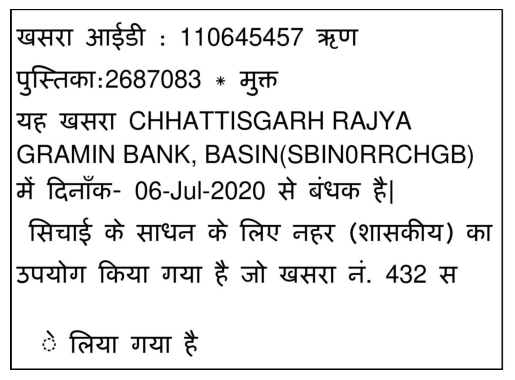


-----------------------------------------------------------------------------------

row_id = 176
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_0_row_2_042_pg1_cropped.jpg

———


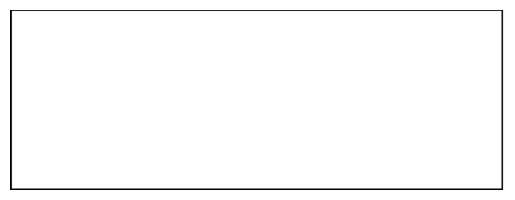


-----------------------------------------------------------------------------------

row_id = 177
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_0_row_1_042_pg1_cropped.jpg

खसरा आईडी : 116259276 *


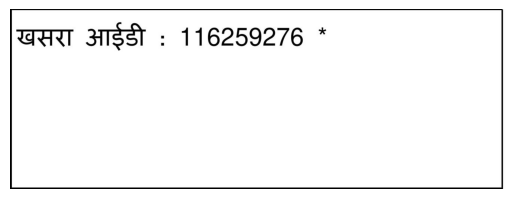


-----------------------------------------------------------------------------------

row_id = 178
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_0_row_4_042_pg1_cropped.jpg

खसरा आईडी : 116259297 ब$313


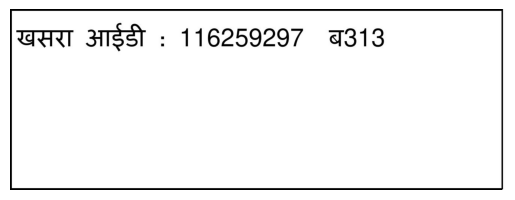


-----------------------------------------------------------------------------------

row_id = 179
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_0_row_3_042_pg1_cropped.jpg

_———


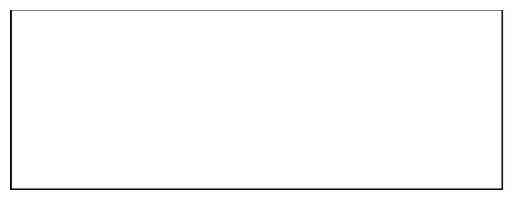


-----------------------------------------------------------------------------------

row_id = 180
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_0_row_3_042_pg2_cropped.jpg

खसरा आईडी : 116260050 ब$313


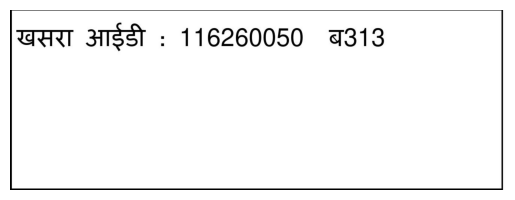


-----------------------------------------------------------------------------------

row_id = 181
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_0_row_4_042_pg2_cropped.jpg

खसरा आईडी : 116260054 313


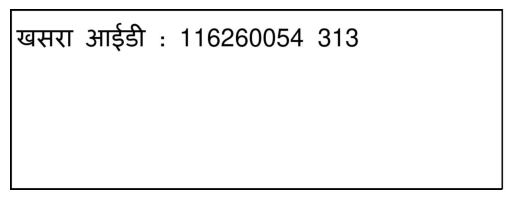


-----------------------------------------------------------------------------------

row_id = 182
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_0_row_2_042_pg2_cropped.jpg

खसरा आईडी : 116259999 313


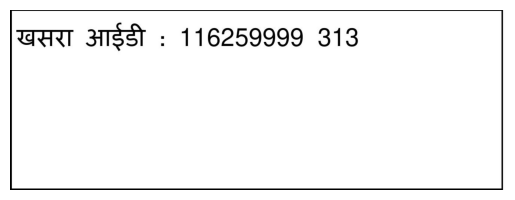


-----------------------------------------------------------------------------------

row_id = 183
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_0_row_1_042_pg2_cropped.jpg

खसरा आईडी : 116259304 313


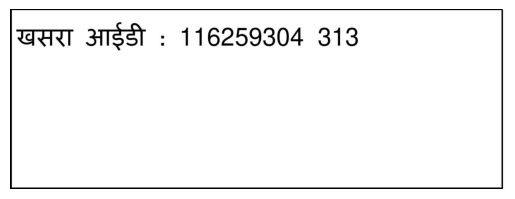


-----------------------------------------------------------------------------------

row_id = 184
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_0_row_4_042_pg3_cropped.jpg

खसरा आईडी : 116258842 313


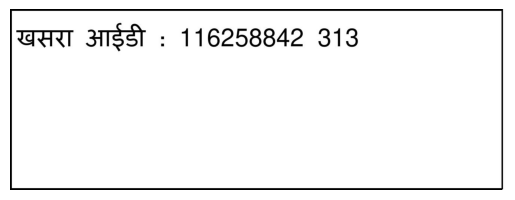


-----------------------------------------------------------------------------------

row_id = 185
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_0_row_3_042_pg3_cropped.jpg

खसरा आईडी : 116260202 313


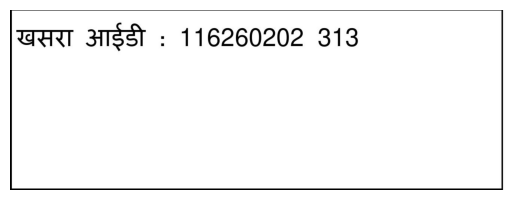


-----------------------------------------------------------------------------------

row_id = 186
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_0_row_2_042_pg3_cropped.jpg

खसरा आईडी : 116260177 494


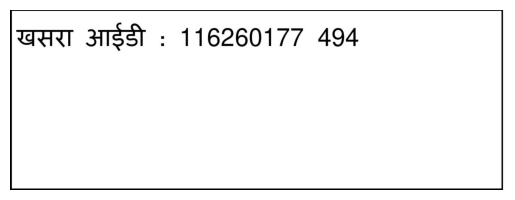


-----------------------------------------------------------------------------------

row_id = 187
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_0_row_1_042_pg3_cropped.jpg

खसरा आईडी : 116260162


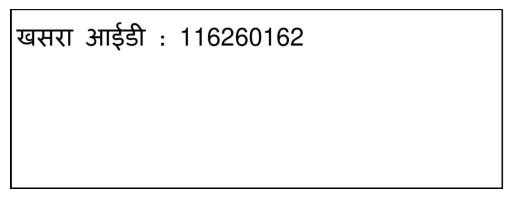


-----------------------------------------------------------------------------------

row_id = 188
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg4/pdf_to_images/column_0_row_2_042_pg4_cropped.jpg

खसरा आईडी : 116258954 313


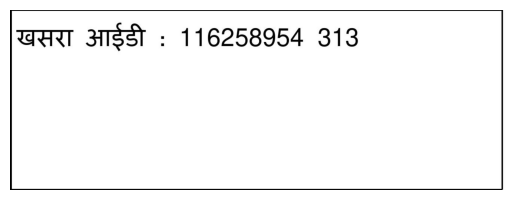


-----------------------------------------------------------------------------------

row_id = 189
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg4/pdf_to_images/column_0_row_1_042_pg4_cropped.jpg

खसरा आईडी : 116258853 313


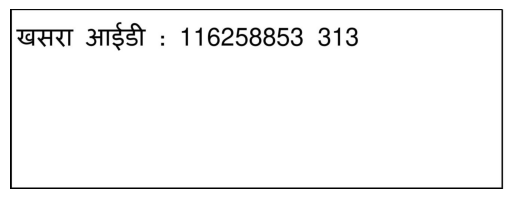


-----------------------------------------------------------------------------------

row_id = 190
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/050/050_pg1/pdf_to_images/column_0_row_1_050_pg1_cropped.jpg

खसरा आईडी : 108486367


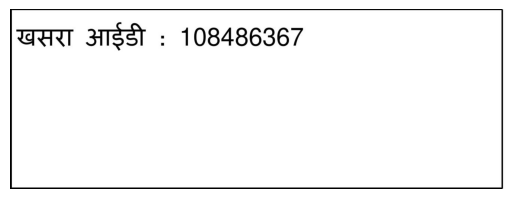


-----------------------------------------------------------------------------------

row_id = 191
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_0_row_4_015_pg5_cropped.jpg

खसरा आईडी : 122651197 ऋण
पुस्तिका:93613


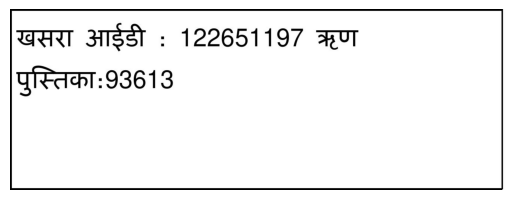


-----------------------------------------------------------------------------------

row_id = 192
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_0_row_1_015_pg5_cropped.jpg

खसरा आईडी : 122650360 ऋण
पुस्तिका:93613


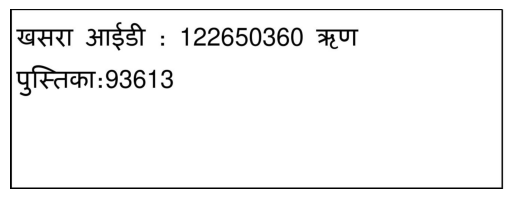


-----------------------------------------------------------------------------------

row_id = 193
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_0_row_3_015_pg5_cropped.jpg

खसरा आईडी : 122651192 ऋण
पुस्तिका:93613


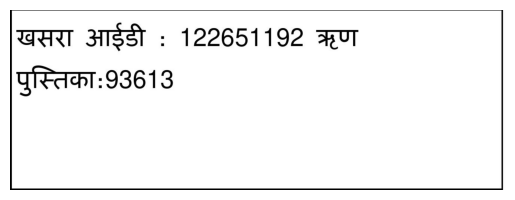


-----------------------------------------------------------------------------------

row_id = 194
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_0_row_2_015_pg5_cropped.jpg

खसरा आईडी : 122663282 ऋण
पुस्तिका:93613


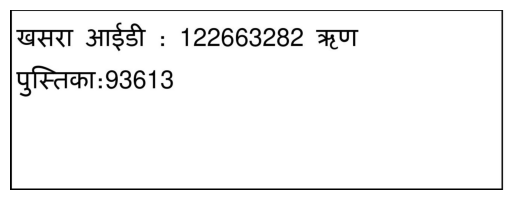


-----------------------------------------------------------------------------------

row_id = 195
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_0_row_4_015_pg2_cropped.jpg

खसरा आईडी : 122658144 ऋण
पुस्तिका:93613


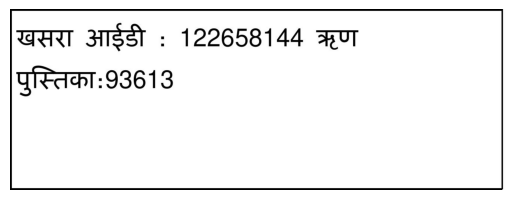


-----------------------------------------------------------------------------------

row_id = 196
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_0_row_3_015_pg2_cropped.jpg

खसरा आईडी : 122658046 ऋण
पुस्तिका:93613


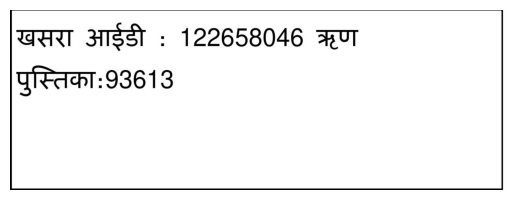


-----------------------------------------------------------------------------------

row_id = 197
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_0_row_1_015_pg2_cropped.jpg

SS —_——


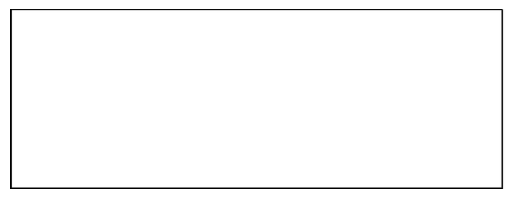


-----------------------------------------------------------------------------------

row_id = 198
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_0_row_2_015_pg2_cropped.jpg

खसरा आईडी : 122650348 ऋण
पुस्तिका:93613


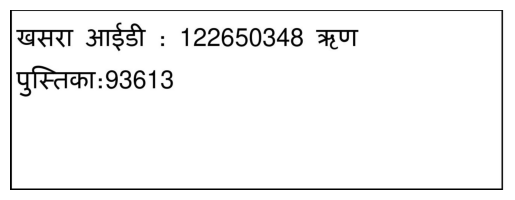


-----------------------------------------------------------------------------------

row_id = 199
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_0_row_2_015_pg1_cropped.jpg

———


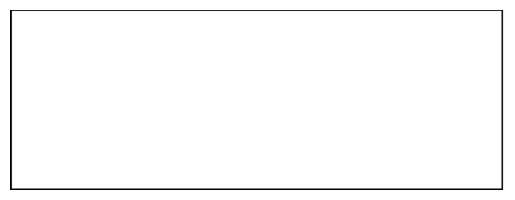


-----------------------------------------------------------------------------------

row_id = 200
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_0_row_4_015_pg1_cropped.jpg

—_—_—


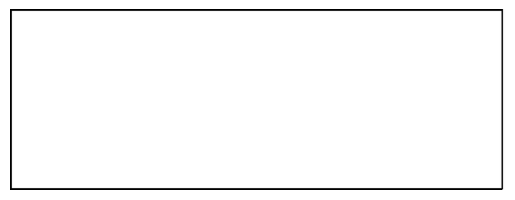


-----------------------------------------------------------------------------------

row_id = 201
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_0_row_1_015_pg1_cropped.jpg

खसरा आईडी : 122649646 ऋण
पुस्तिका:93613 *


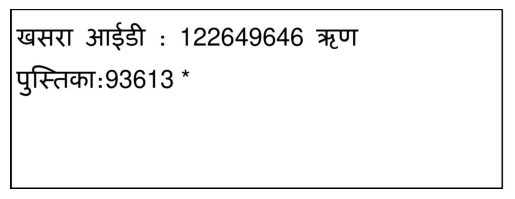


-----------------------------------------------------------------------------------

row_id = 202
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_0_row_3_015_pg1_cropped.jpg

_———


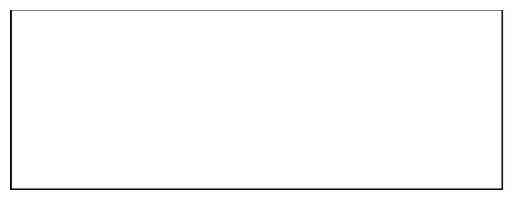


-----------------------------------------------------------------------------------

row_id = 203
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_0_row_2_015_pg7_cropped.jpg

खसरा आईडी : 122651772 ऋण
पुस्तिका:93613


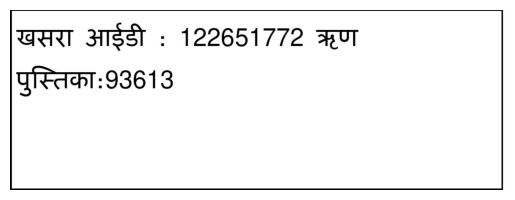


-----------------------------------------------------------------------------------

row_id = 204
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_0_row_3_015_pg7_cropped.jpg

खसरा आईडी : 122651777 ऋण
पुस्तिका:93613


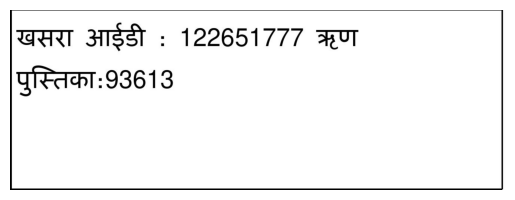


-----------------------------------------------------------------------------------

row_id = 205
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_0_row_1_015_pg7_cropped.jpg

खसरा आईडी : 122651436 ऋण
पुस्तिका:93613


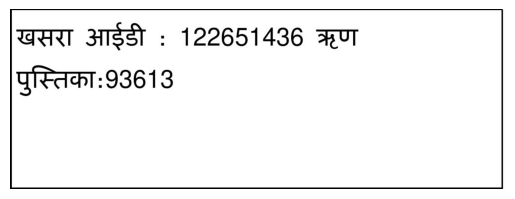


-----------------------------------------------------------------------------------

row_id = 206
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_0_row_4_015_pg3_cropped.jpg

खसरा आईडी : 122658173 ऋण
पुस्तिका:93613


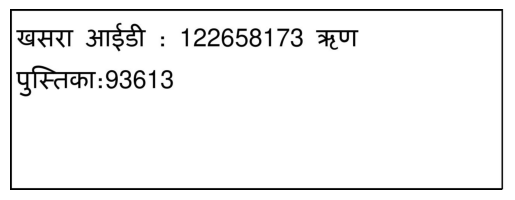


-----------------------------------------------------------------------------------

row_id = 207
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_0_row_3_015_pg3_cropped.jpg

खसरा आईडी : 122662926 ऋण
पुस्तिका:93613


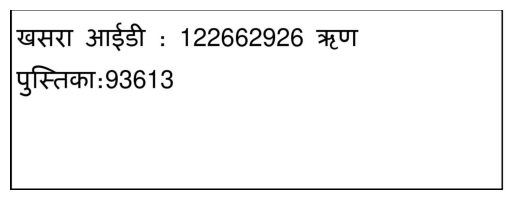


-----------------------------------------------------------------------------------

row_id = 208
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_0_row_1_015_pg3_cropped.jpg

खसरा आईडी : 122662904 ऋण
पुस्तिका:93613


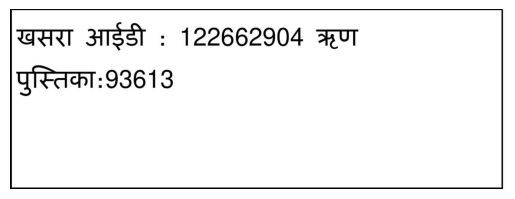


-----------------------------------------------------------------------------------

row_id = 209
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_0_row_2_015_pg3_cropped.jpg

खसरा आईडी : 122648855 ऋण
पुस्तिका:93613


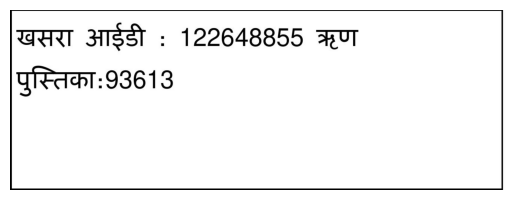


-----------------------------------------------------------------------------------

row_id = 210
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_0_row_2_015_pg6_cropped.jpg

खसरा आईडी : 122651236 ऋण
पुस्तिका:93613


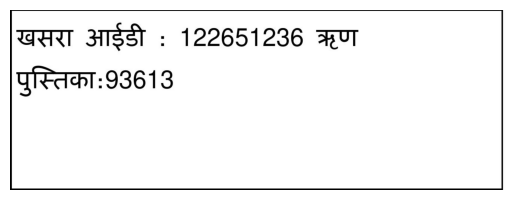


-----------------------------------------------------------------------------------

row_id = 211
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_0_row_4_015_pg6_cropped.jpg

खसरा आईडी : 122663368 ऋण
पुस्तिका:93613


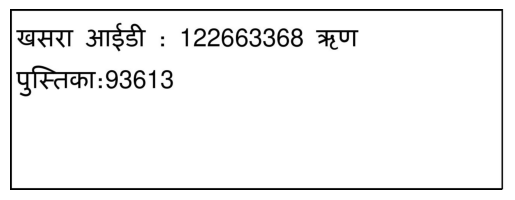


-----------------------------------------------------------------------------------

row_id = 212
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_0_row_1_015_pg6_cropped.jpg

खसरा आईडी : 122660521 ऋण
पुस्तिका:93613


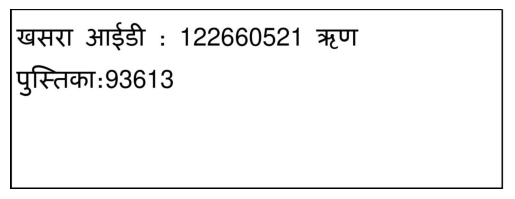


-----------------------------------------------------------------------------------

row_id = 213
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_0_row_3_015_pg6_cropped.jpg

खसरा आईडी : 122651246 ऋण
पुस्तिका:93613


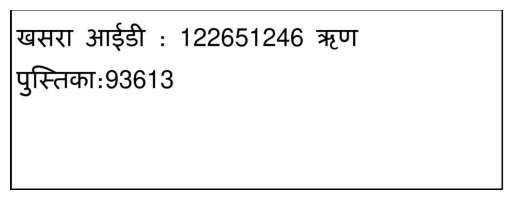


-----------------------------------------------------------------------------------

row_id = 214
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_0_row_4_015_pg4_cropped.jpg

खसरा आईडी : 122663178 ऋण
पुस्तिका:93613


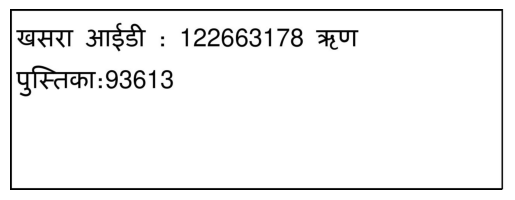


-----------------------------------------------------------------------------------

row_id = 215
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_0_row_2_015_pg4_cropped.jpg

खसरा आईडी : 122663128 ऋण
पुस्तिका:93613 छत्तीसगढ़ शासन


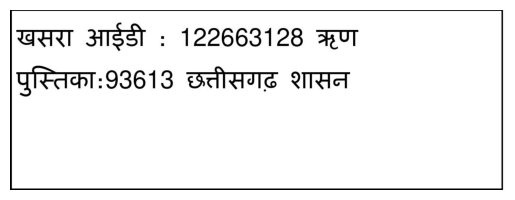


-----------------------------------------------------------------------------------

row_id = 216
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_0_row_3_015_pg4_cropped.jpg

खसरा आईडी : 122660236 ऋण
पुस्तिका:93613


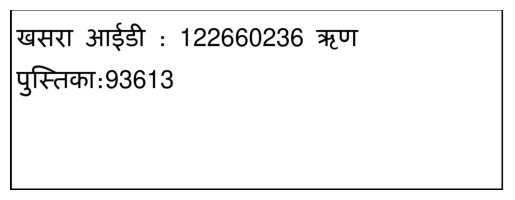


-----------------------------------------------------------------------------------

row_id = 217
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_0_row_1_015_pg4_cropped.jpg

खसरा आईडी : 122658297 ऋण
पुस्तिका:93613


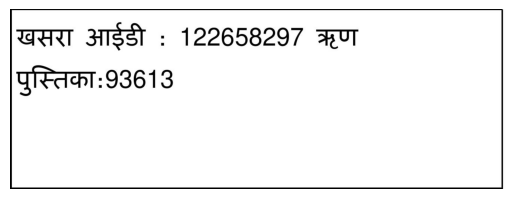


-----------------------------------------------------------------------------------

row_id = 218
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/048/048_pg1/pdf_to_images/column_0_row_1_048_pg1_cropped.jpg

खसरा आईडी : 112282091 छत्तीसगढ़ शासन


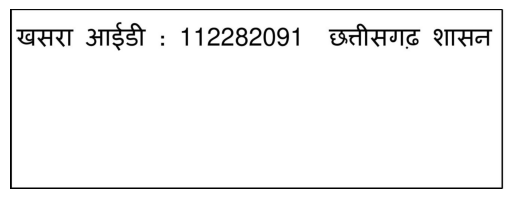


-----------------------------------------------------------------------------------

row_id = 219
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_0_row_2_044_pg1_cropped.jpg

खसरा आईडी : 123023926 ऋण
पुस्तिका:P-0356214


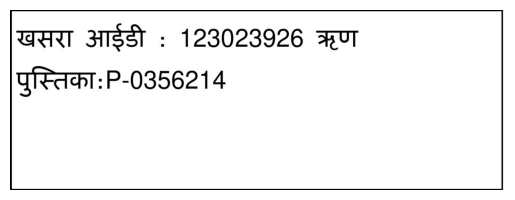


-----------------------------------------------------------------------------------

row_id = 220
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_0_row_1_044_pg1_cropped.jpg

खसरा आईडी : 123023289 ऋण
पुस्तिका:?-0356214 बटवारा से
आया,न्यायालय तहसीलदार मरवाही के ज्ञापन
क्र/क/वा/तह0/2019/मरवाही/दि0 23-9-19
के रा0प्र0क्र0 206अ27/2017-18 पा0 दि0
31.08.2019 के अनुसार।


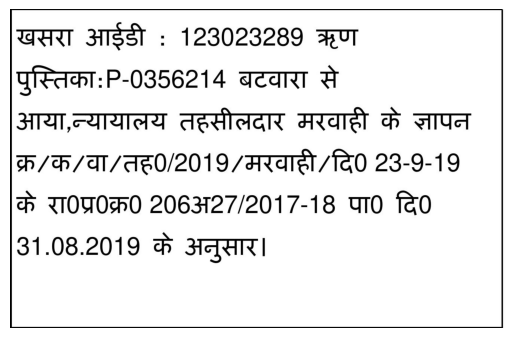


-----------------------------------------------------------------------------------

row_id = 221
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_0_row_3_044_pg1_cropped.jpg

खसरा आईडी : 123023927 ऋण
पुस्तिका:?-0356214


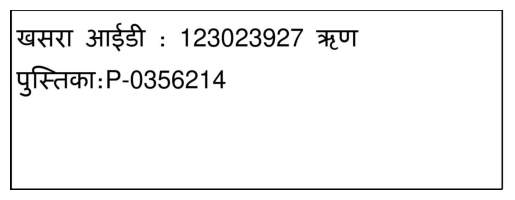


-----------------------------------------------------------------------------------

row_id = 222
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_0_row_4_016_pg5_cropped.jpg

खसरा आईडी : 122658557 ऋण
पुस्तिका:836594


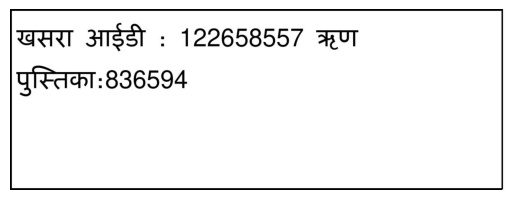


-----------------------------------------------------------------------------------

row_id = 223
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_0_row_2_016_pg5_cropped.jpg

खसरा आईडी : 122663223 ऋण
पुस्तिका:836594


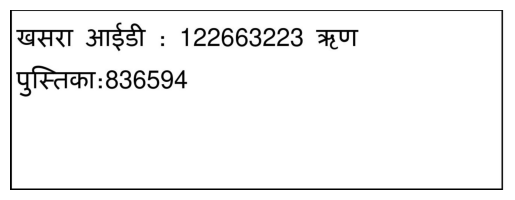


-----------------------------------------------------------------------------------

row_id = 224
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_0_row_1_016_pg5_cropped.jpg

खसरा आईडी : 122649894 ऋण
पुस्तिका:836594


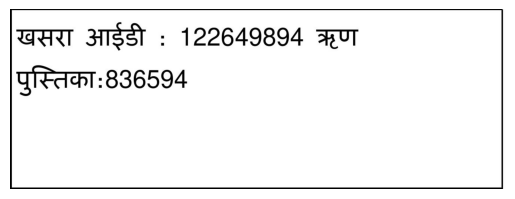


-----------------------------------------------------------------------------------

row_id = 225
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_0_row_3_016_pg5_cropped.jpg

खसरा आईडी : 122649921 ऋण
पुस्तिका:836594


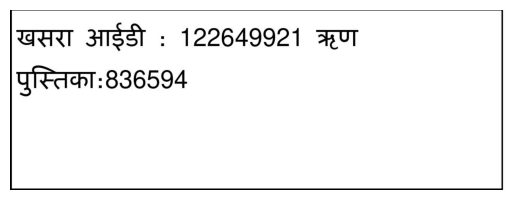


-----------------------------------------------------------------------------------

row_id = 226
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_0_row_1_016_pg1_cropped.jpg

खसरा आईडी : 122662816 ऋण
पुस्तिका:836594 *


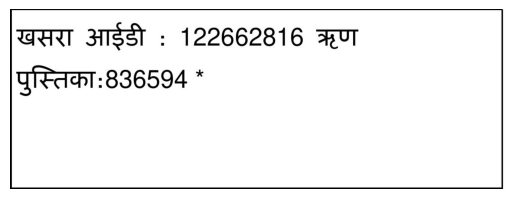


-----------------------------------------------------------------------------------

row_id = 227
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_0_row_4_016_pg1_cropped.jpg

खसरा आईडी : 122659641 ऋण
पुस्तिका:836594


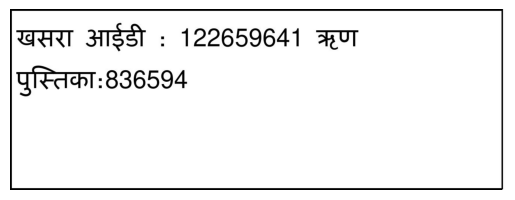


-----------------------------------------------------------------------------------

row_id = 228
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_0_row_2_016_pg1_cropped.jpg

खसरा आईडी : 122660355 ऋण
पुस्तिका:836594


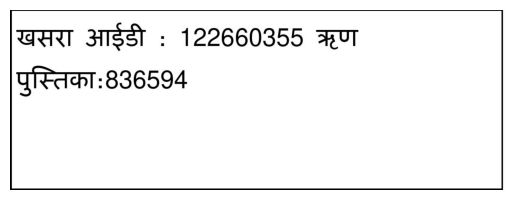


-----------------------------------------------------------------------------------

row_id = 229
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_0_row_3_016_pg1_cropped.jpg

खसरा आईडी : 122663290 ऋण
पुस्तिका:836594


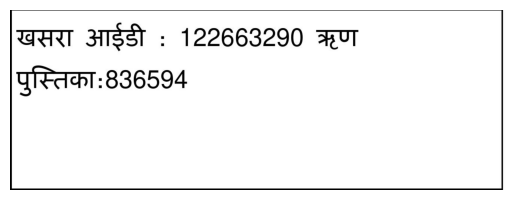


-----------------------------------------------------------------------------------

row_id = 230
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_0_row_4_016_pg4_cropped.jpg

खसरा आईडी : 122658493 ऋण
पुस्तिका:836594


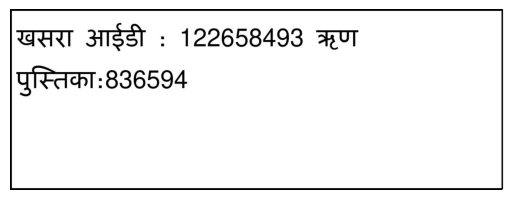


-----------------------------------------------------------------------------------

row_id = 231
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_0_row_1_016_pg4_cropped.jpg

खसरा आईडी : 122649877 ऋण
पुस्तिका:836594


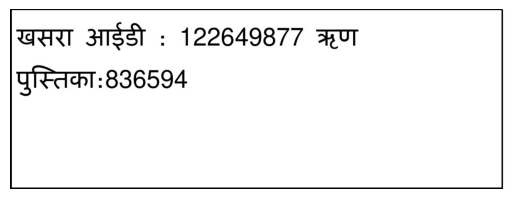


-----------------------------------------------------------------------------------

row_id = 232
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_0_row_3_016_pg4_cropped.jpg

खसरा आईडी : 122660247 ऋण
पुस्तिका:836594


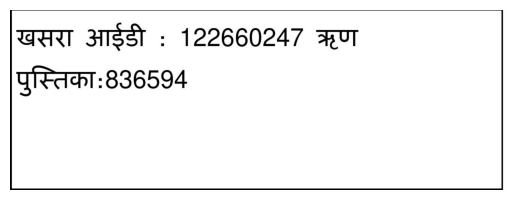


-----------------------------------------------------------------------------------

row_id = 233
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_0_row_2_016_pg4_cropped.jpg

खसरा आईडी : 122660246 ऋण
पुस्तिका:836594


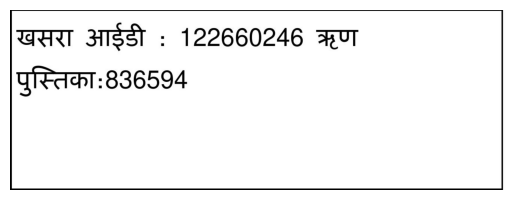


-----------------------------------------------------------------------------------

row_id = 234
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_0_row_2_016_pg3_cropped.jpg

खसरा आईडी : 122658210 ऋण
पुस्तिका:836594


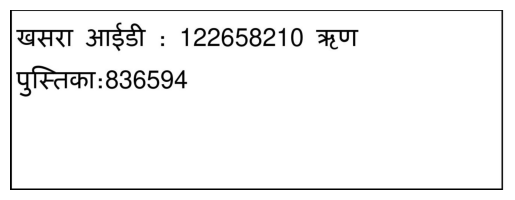


-----------------------------------------------------------------------------------

row_id = 235
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_0_row_3_016_pg3_cropped.jpg

खसरा आईडी : 122660224 ऋण
पुस्तिका:836594


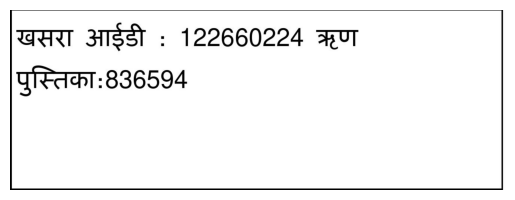


-----------------------------------------------------------------------------------

row_id = 236
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_0_row_4_016_pg3_cropped.jpg

खसरा आईडी : 122660245 ऋण
पुस्तिका:836594


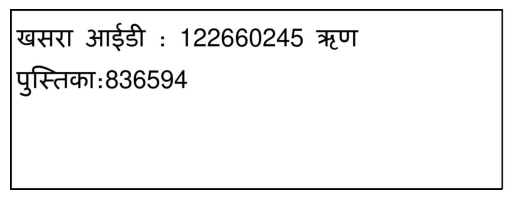


-----------------------------------------------------------------------------------

row_id = 237
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_0_row_1_016_pg3_cropped.jpg

खसरा आईडी : 122648832 ऋण
पुस्तिका:836594


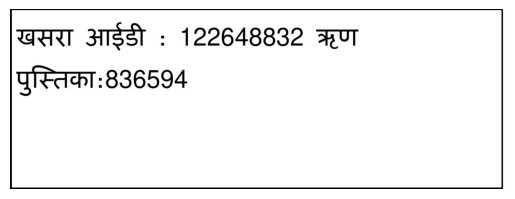


-----------------------------------------------------------------------------------

row_id = 238
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg6/pdf_to_images/column_0_row_2_016_pg6_cropped.jpg

खसरा आईडी : 122663346 ऋण
पुस्तिका:836594


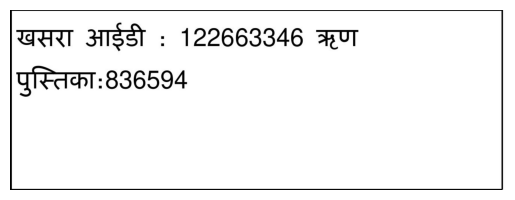


-----------------------------------------------------------------------------------

row_id = 239
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg6/pdf_to_images/column_0_row_1_016_pg6_cropped.jpg

खसरा आईडी : 122663295 ऋण
पुस्तिका:836594


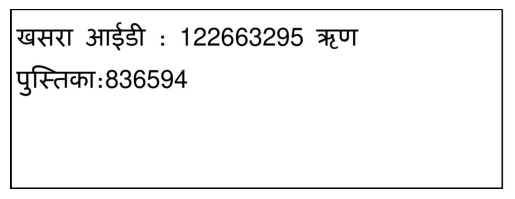


-----------------------------------------------------------------------------------

row_id = 240
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_0_row_3_016_pg2_cropped.jpg

खसरा आईडी : 122662861 ऋण
पुस्तिका:836594


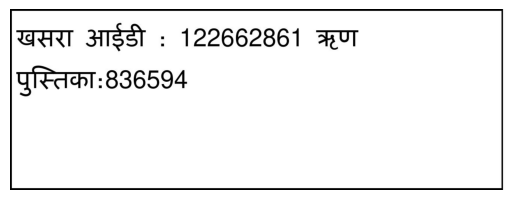


-----------------------------------------------------------------------------------

row_id = 241
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_0_row_1_016_pg2_cropped.jpg

खसरा आईडी : 122648212 ऋण
पुस्तिका:836594 0.002 कुवा1,सिचाई कुवां से


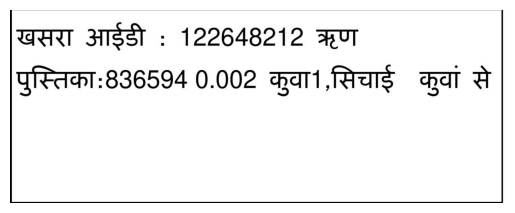


-----------------------------------------------------------------------------------

row_id = 242
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_0_row_2_016_pg2_cropped.jpg

खसरा आईडी : 122648218 ऋण
पुस्तिका:836594


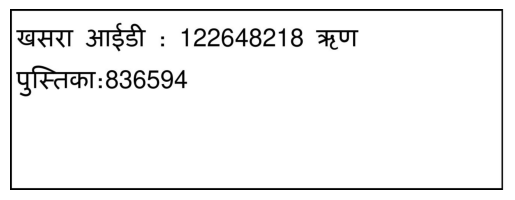


-----------------------------------------------------------------------------------

row_id = 243
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_0_row_4_016_pg2_cropped.jpg

खसरा आईडी : 122648825 ऋण
पुस्तिका:836594


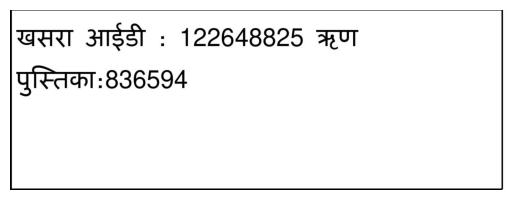


-----------------------------------------------------------------------------------

row_id = 244
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_0_row_2_054_pg3_cropped.jpg

खसरा आईडी : 104682368
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


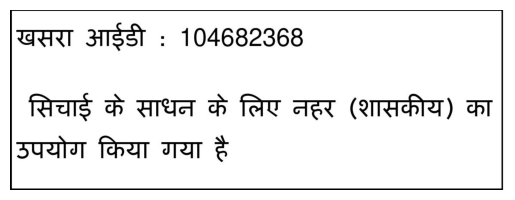


-----------------------------------------------------------------------------------

row_id = 245
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_0_row_1_054_pg3_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


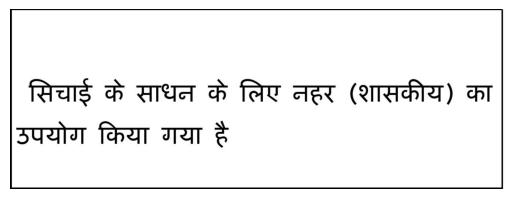


-----------------------------------------------------------------------------------

row_id = 246
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_0_row_3_054_pg3_cropped.jpg

खसरा आईडी : 104611556
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


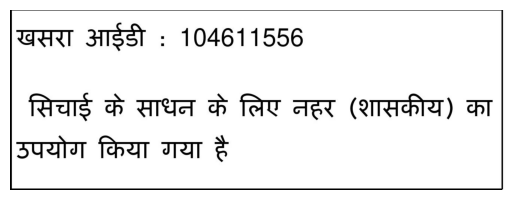


-----------------------------------------------------------------------------------

row_id = 247
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_1_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


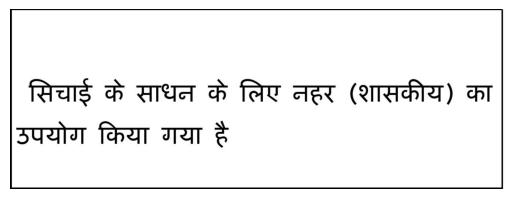


-----------------------------------------------------------------------------------

row_id = 248
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_3_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


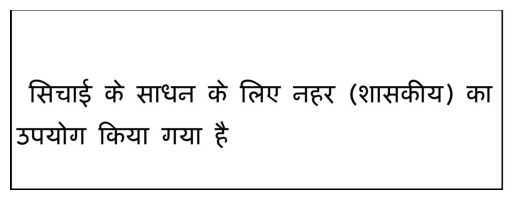


-----------------------------------------------------------------------------------

row_id = 249
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_2_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


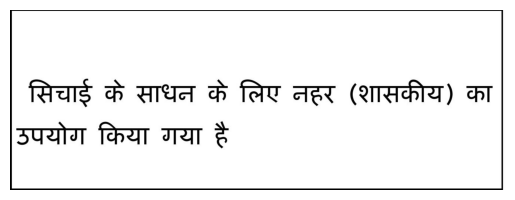


-----------------------------------------------------------------------------------

row_id = 250
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_4_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


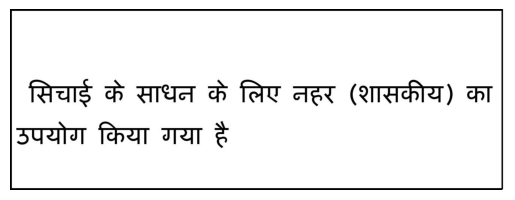


-----------------------------------------------------------------------------------

row_id = 251
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_1_054_pg1_cropped.jpg

खसरा आईडी : 104605318 *
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


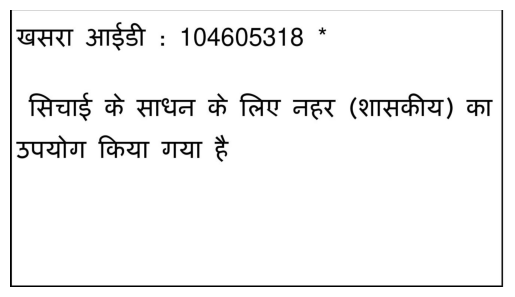


-----------------------------------------------------------------------------------

row_id = 252
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_2_054_pg1_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


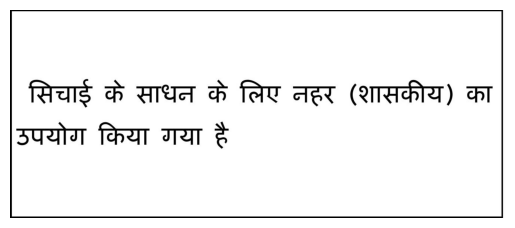


-----------------------------------------------------------------------------------

row_id = 253
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_3_054_pg1_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


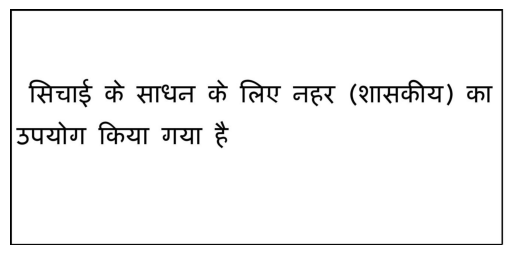


-----------------------------------------------------------------------------------

row_id = 254
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/056/056_pg1/pdf_to_images/column_0_row_1_056_pg1_cropped.jpg

खसरा आईडी : 108485949


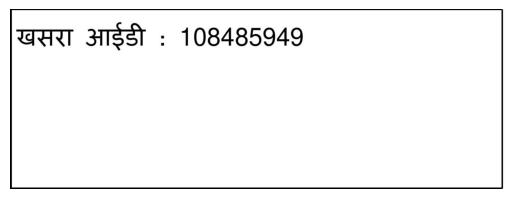


-----------------------------------------------------------------------------------

row_id = 255
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_1_007_pg1_cropped.jpg

खसरा आईडी : 108172746 ऋण पुस्तिकाः0
साल 1 महुआ 2


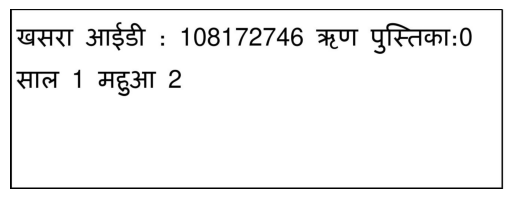


-----------------------------------------------------------------------------------

row_id = 256
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_2_007_pg1_cropped.jpg

———


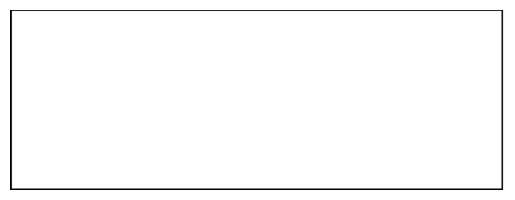


-----------------------------------------------------------------------------------

row_id = 257
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_3_007_pg1_cropped.jpg

_———


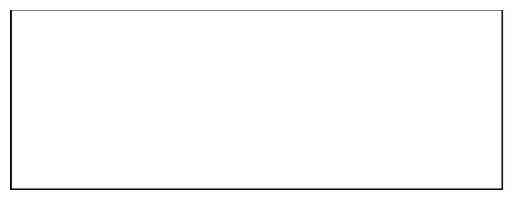


-----------------------------------------------------------------------------------

row_id = 258
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_4_007_pg1_cropped.jpg

—_—_—


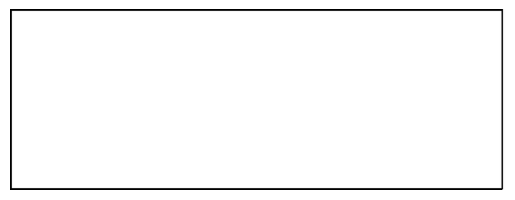


-----------------------------------------------------------------------------------

row_id = 259
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_1_007_pg2_cropped.jpg

SS —_——


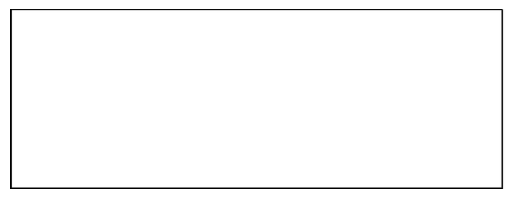


-----------------------------------------------------------------------------------

row_id = 260
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_2_007_pg2_cropped.jpg

———


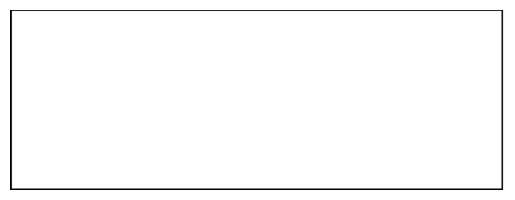


-----------------------------------------------------------------------------------

row_id = 261
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_3_007_pg2_cropped.jpg

_———


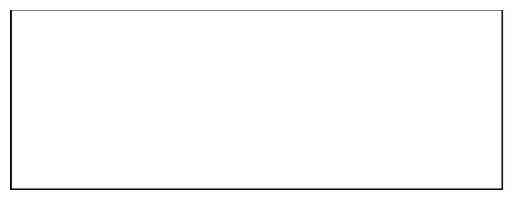


-----------------------------------------------------------------------------------

row_id = 262
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_4_007_pg2_cropped.jpg

—_—_—


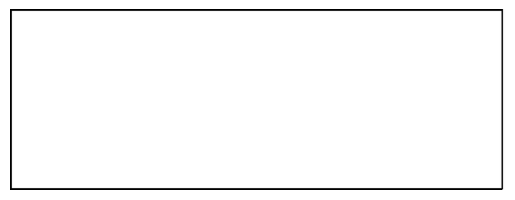


-----------------------------------------------------------------------------------

row_id = 263
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_2_007_pg3_cropped.jpg

———


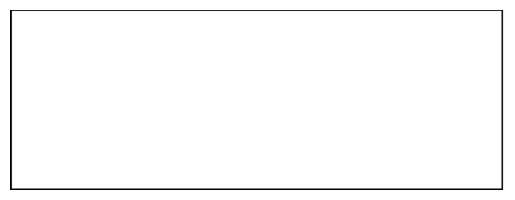


-----------------------------------------------------------------------------------

row_id = 264
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_3_007_pg3_cropped.jpg

खसरा आईडी : 108172740 ऋण पुस्तिकाः0


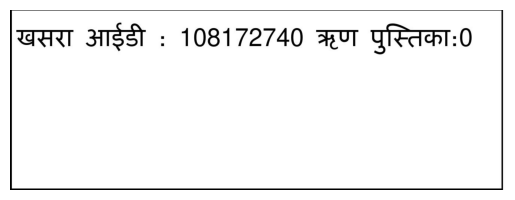


-----------------------------------------------------------------------------------

row_id = 265
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_1_007_pg3_cropped.jpg

SS —_——


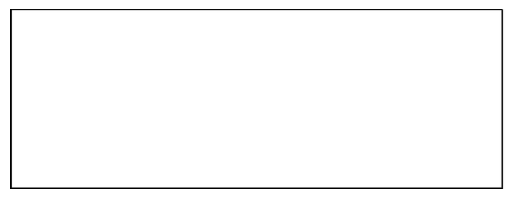


-----------------------------------------------------------------------------------

row_id = 266
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_4_007_pg3_cropped.jpg

खसरा आईडी : 108172855 ऋण पुस्तिकाः0


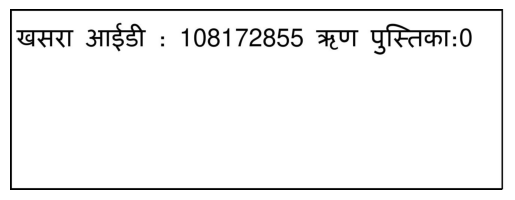


-----------------------------------------------------------------------------------

row_id = 267
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_2_019_pg4_cropped.jpg

खसरा आईडी : 121288623 ऋण
पुस्तिका:2292423


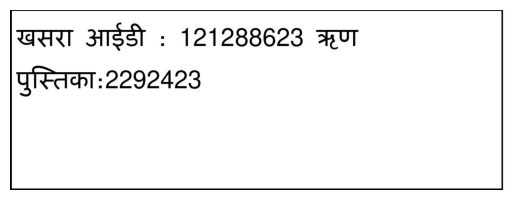


-----------------------------------------------------------------------------------

row_id = 268
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_3_019_pg4_cropped.jpg

खसरा आईडी : 121265530 ऋण
पुस्तिका:2292423


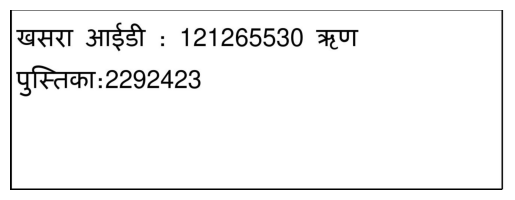


-----------------------------------------------------------------------------------

row_id = 269
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_1_019_pg4_cropped.jpg

खसरा आईडी : 121273372 ऋण
पुस्तिका:2292423


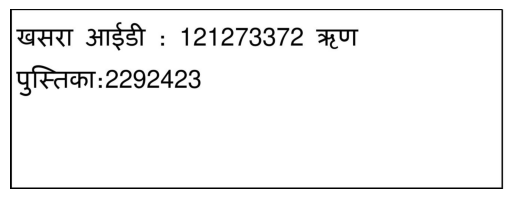


-----------------------------------------------------------------------------------

row_id = 270
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_4_019_pg2_cropped.jpg

खसरा आईडी : 121288403 ऋण
पुस्तिका:2292423


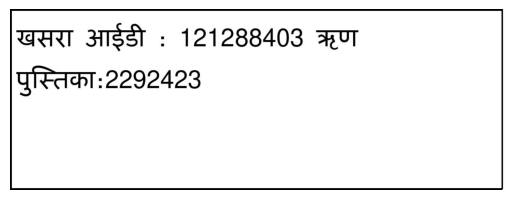


-----------------------------------------------------------------------------------

row_id = 271
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_1_019_pg2_cropped.jpg

खसरा आईडी : 121288404 ऋण
पुस्तिका:2292423 मकान


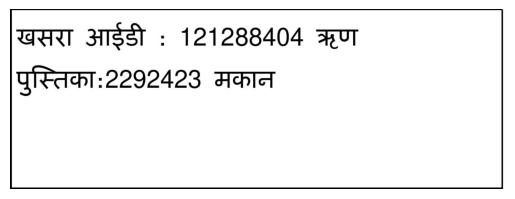


-----------------------------------------------------------------------------------

row_id = 272
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_2_019_pg2_cropped.jpg

खसरा आईडी : 121273000 ऋण
पुस्तिका:2292423


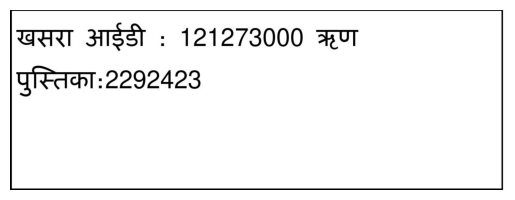


-----------------------------------------------------------------------------------

row_id = 273
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_3_019_pg2_cropped.jpg

खसरा आईडी : 121265102 ऋण
पुस्तिका:2292423


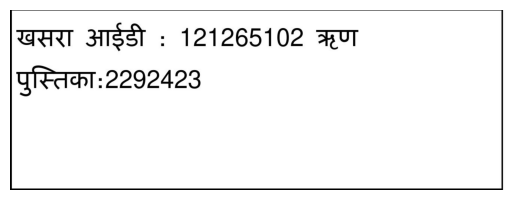


-----------------------------------------------------------------------------------

row_id = 274
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_2_019_pg1_cropped.jpg

खसरा आईडी : 121264934 ऋण
पुस्तिका:2292423


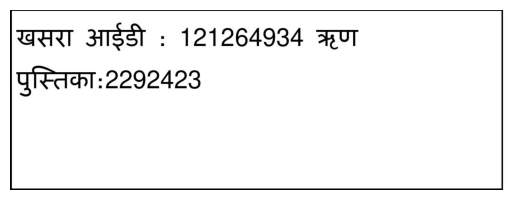


-----------------------------------------------------------------------------------

row_id = 275
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_4_019_pg1_cropped.jpg

खसरा आईडी : 121264932 ऋण
पुस्तिका:2292423


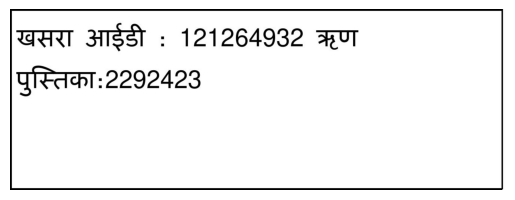


-----------------------------------------------------------------------------------

row_id = 276
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_3_019_pg1_cropped.jpg

खसरा आईडी : 121288304 ऋण
पुस्तिका:2292423


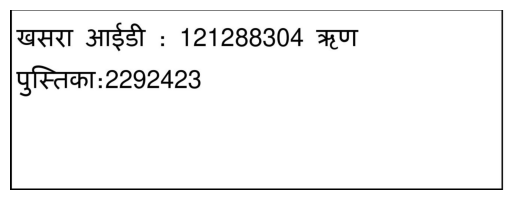


-----------------------------------------------------------------------------------

row_id = 277
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_1_019_pg1_cropped.jpg

खसरा आईडी : 121272969 ऋण
पुस्तिका:2292423 0000


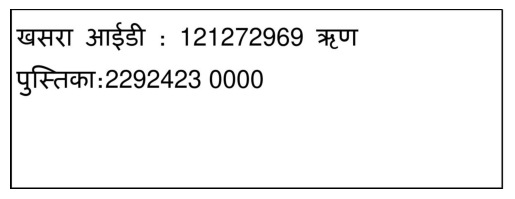


-----------------------------------------------------------------------------------

row_id = 278
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_3_019_pg3_cropped.jpg

खसरा आईडी : 121265340 ऋण
पुस्तिका:2292423


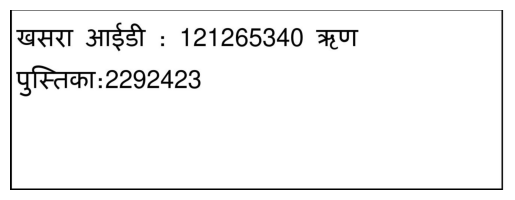


-----------------------------------------------------------------------------------

row_id = 279
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_1_019_pg3_cropped.jpg

खसरा आईडी : 121288406 ऋण
पुस्तिका:2292423


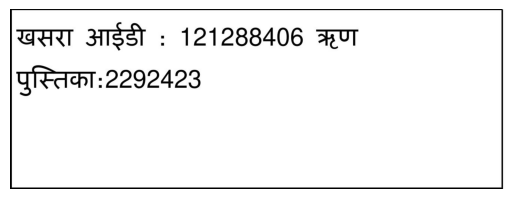


-----------------------------------------------------------------------------------

row_id = 280
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_4_019_pg3_cropped.jpg

खसरा आईडी : 121270028 ऋण
पुस्तिका:2292423


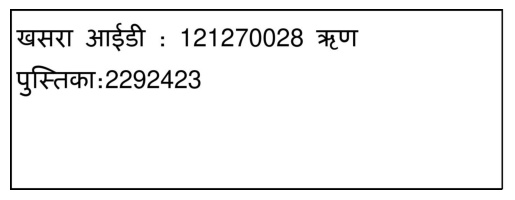


-----------------------------------------------------------------------------------

row_id = 281
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_2_019_pg3_cropped.jpg

खसरा आईडी : 121265335 ऋण
पुस्तिका:2292423


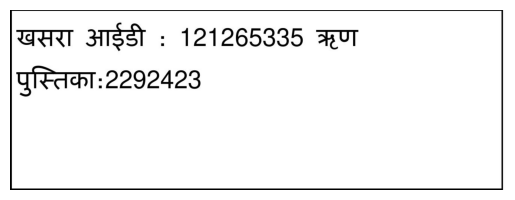


-----------------------------------------------------------------------------------

row_id = 282
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/029/029_pg1/pdf_to_images/column_0_row_1_029_pg1_cropped.jpg

खसरा आईडी : 105309578 छोटे झाड़ के
जंगल व घांस


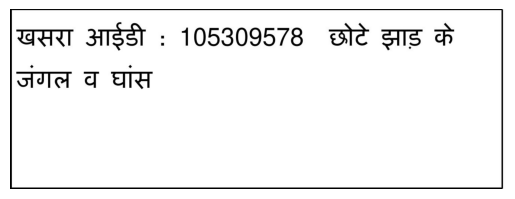


-----------------------------------------------------------------------------------

row_id = 283
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/033/033_pg1/pdf_to_images/column_0_row_1_033_pg1_cropped.jpg

खसरा आईडी : 101447080 पट्टे से प्रास
अहस्तांतरणीय


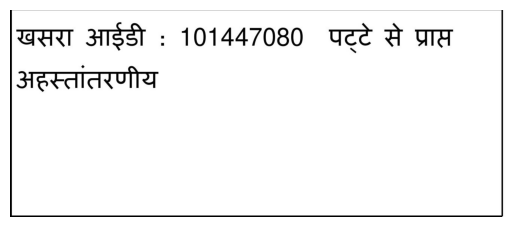


-----------------------------------------------------------------------------------



In [59]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(df.shape[0]):
    a = i

    print('row_id =', i)
    print(df['image_path_col0'][a])
    print()
    # Assuming imagePath contains the path to the image you want to display
    imagePath = df['image_path_col0'][a]
    print(df['col_0_content'][a])
    # Load the image
    img = mpimg.imread(imagePath)
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    #plt.title(df['Content'][a])  # Set the title
    plt.show()
    print()
    print('-----------------------------------------------------------------------------------')
    print()


In [60]:
merged_df.shape[0]

284

row_id = 249
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_2_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


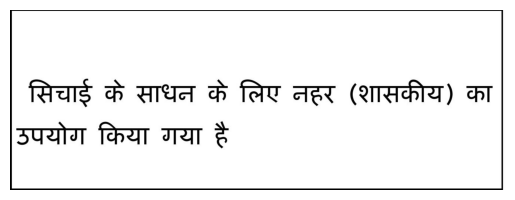


-----------------------------------------------------------------------------------

row_id = 250
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_0_row_4_054_pg2_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


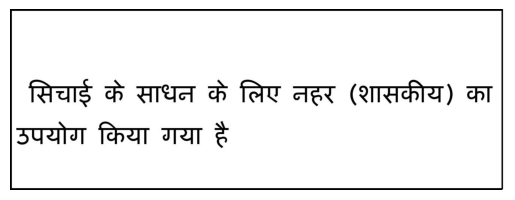


-----------------------------------------------------------------------------------

row_id = 251
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_1_054_pg1_cropped.jpg

खसरा आईडी : 104605318 *
सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


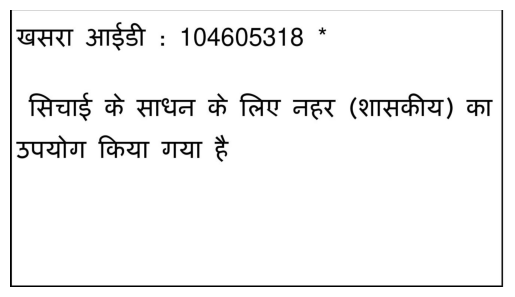


-----------------------------------------------------------------------------------

row_id = 252
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_2_054_pg1_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया है


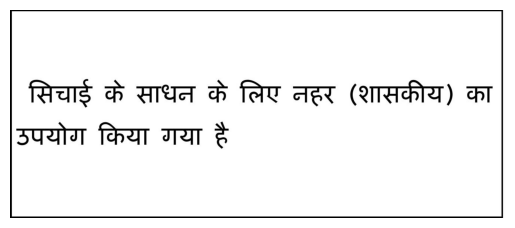


-----------------------------------------------------------------------------------

row_id = 253
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_0_row_3_054_pg1_cropped.jpg

सिचाई के साधन के लिए नहर (शासकीय) का
उपयोग किया गया टै


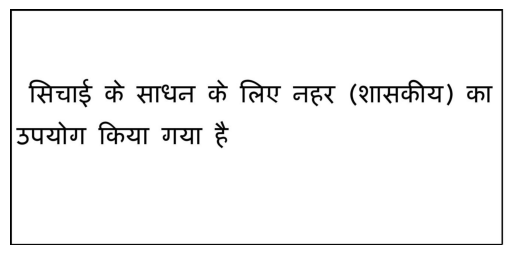


-----------------------------------------------------------------------------------

row_id = 254
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/056/056_pg1/pdf_to_images/column_0_row_1_056_pg1_cropped.jpg

खसरा आईडी : 108485949


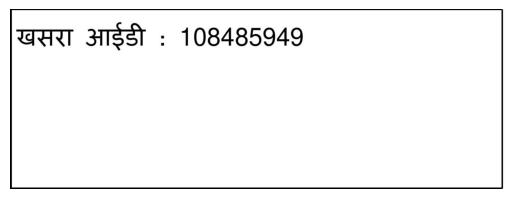


-----------------------------------------------------------------------------------

row_id = 255
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_1_007_pg1_cropped.jpg

खसरा आईडी : 108172746 ऋण पुस्तिकाः0
साल 1 महुआ 2


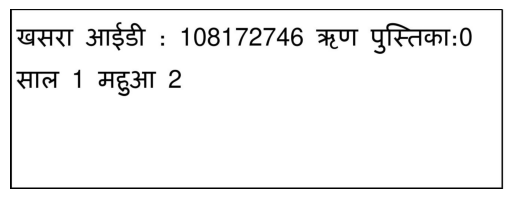


-----------------------------------------------------------------------------------

row_id = 256
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_2_007_pg1_cropped.jpg

———


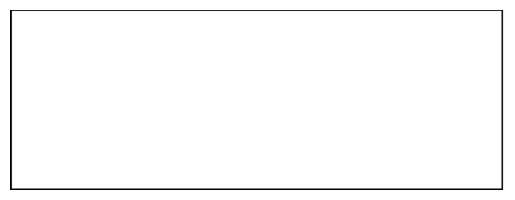


-----------------------------------------------------------------------------------

row_id = 257
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_3_007_pg1_cropped.jpg

_———


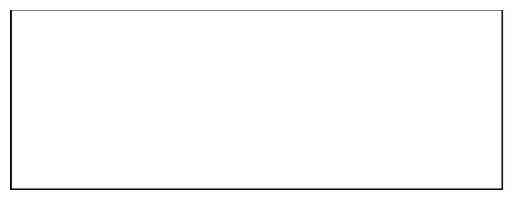


-----------------------------------------------------------------------------------

row_id = 258
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_0_row_4_007_pg1_cropped.jpg

—_—_—


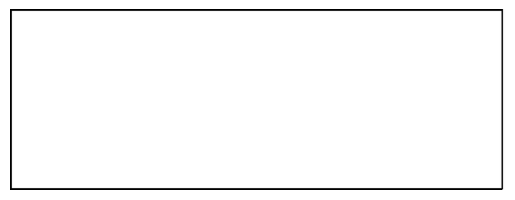


-----------------------------------------------------------------------------------

row_id = 259
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_1_007_pg2_cropped.jpg

SS —_——


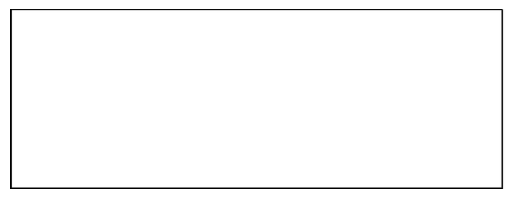


-----------------------------------------------------------------------------------

row_id = 260
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_2_007_pg2_cropped.jpg

———


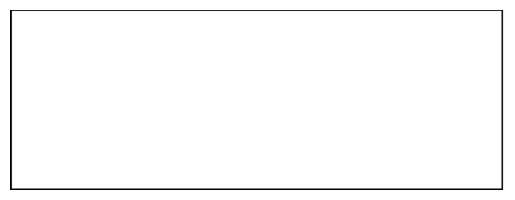


-----------------------------------------------------------------------------------

row_id = 261
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_3_007_pg2_cropped.jpg

_———


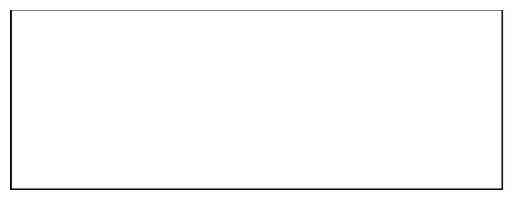


-----------------------------------------------------------------------------------

row_id = 262
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_0_row_4_007_pg2_cropped.jpg

—_—_—


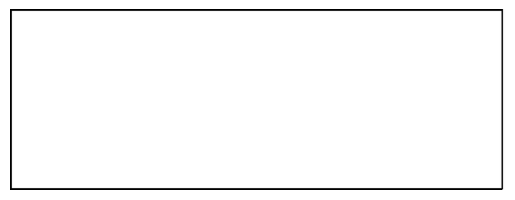


-----------------------------------------------------------------------------------

row_id = 263
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_2_007_pg3_cropped.jpg

———


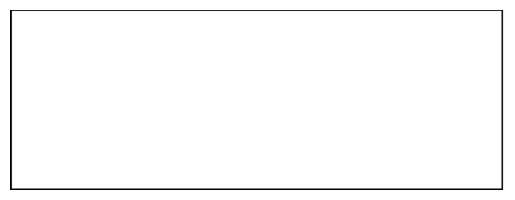


-----------------------------------------------------------------------------------

row_id = 264
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_3_007_pg3_cropped.jpg

खसरा आईडी : 108172740 ऋण पुस्तिकाः0


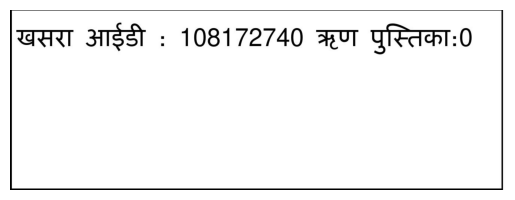


-----------------------------------------------------------------------------------

row_id = 265
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_1_007_pg3_cropped.jpg

SS —_——


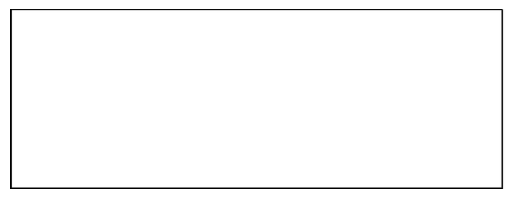


-----------------------------------------------------------------------------------

row_id = 266
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_0_row_4_007_pg3_cropped.jpg

खसरा आईडी : 108172855 ऋण पुस्तिकाः0


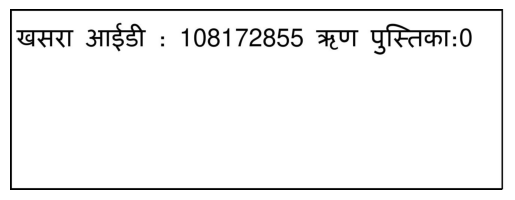


-----------------------------------------------------------------------------------

row_id = 267
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_2_019_pg4_cropped.jpg

खसरा आईडी : 121288623 ऋण
पुस्तिका:2292423


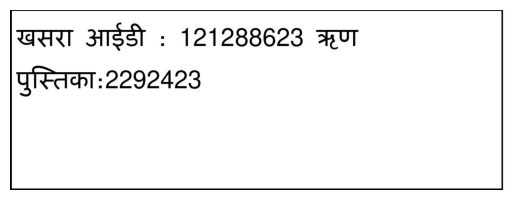


-----------------------------------------------------------------------------------

row_id = 268
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_3_019_pg4_cropped.jpg

खसरा आईडी : 121265530 ऋण
पुस्तिका:2292423


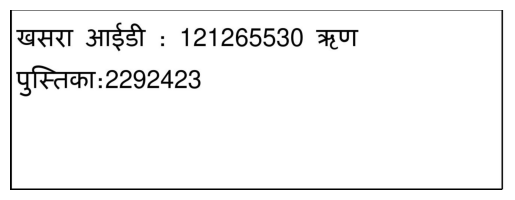


-----------------------------------------------------------------------------------

row_id = 269
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_0_row_1_019_pg4_cropped.jpg

खसरा आईडी : 121273372 ऋण
पुस्तिका:2292423


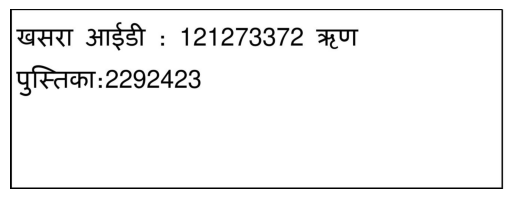


-----------------------------------------------------------------------------------

row_id = 270
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_4_019_pg2_cropped.jpg

खसरा आईडी : 121288403 ऋण
पुस्तिका:2292423


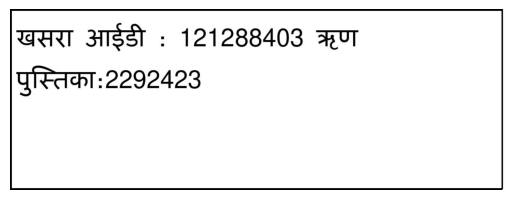


-----------------------------------------------------------------------------------

row_id = 271
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_1_019_pg2_cropped.jpg

खसरा आईडी : 121288404 ऋण
पुस्तिका:2292423 मकान


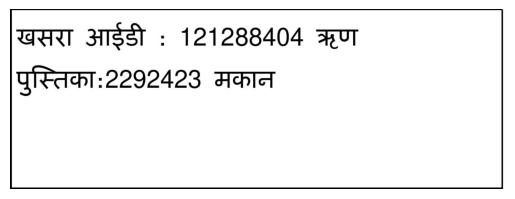


-----------------------------------------------------------------------------------

row_id = 272
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_2_019_pg2_cropped.jpg

खसरा आईडी : 121273000 ऋण
पुस्तिका:2292423


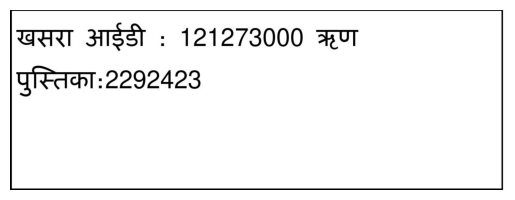


-----------------------------------------------------------------------------------

row_id = 273
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_0_row_3_019_pg2_cropped.jpg

खसरा आईडी : 121265102 ऋण
पुस्तिका:2292423


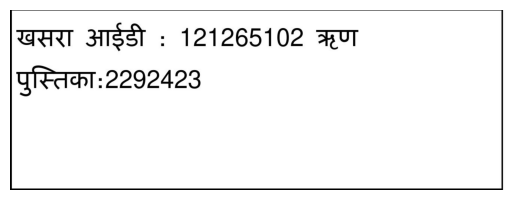


-----------------------------------------------------------------------------------

row_id = 274
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_2_019_pg1_cropped.jpg

खसरा आईडी : 121264934 ऋण
पुस्तिका:2292423


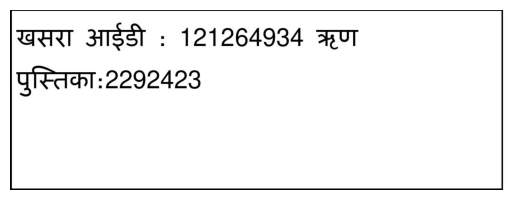


-----------------------------------------------------------------------------------

row_id = 275
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_4_019_pg1_cropped.jpg

खसरा आईडी : 121264932 ऋण
पुस्तिका:2292423


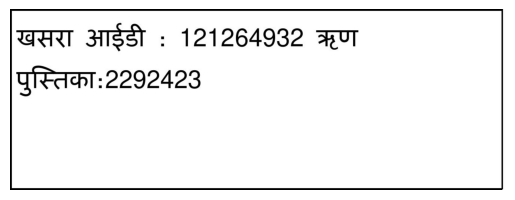


-----------------------------------------------------------------------------------

row_id = 276
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_3_019_pg1_cropped.jpg

खसरा आईडी : 121288304 ऋण
पुस्तिका:2292423


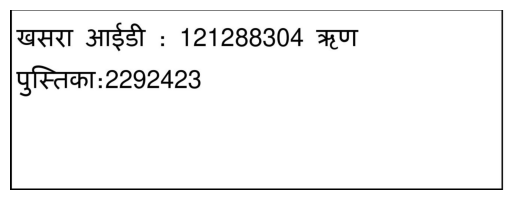


-----------------------------------------------------------------------------------

row_id = 277
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_0_row_1_019_pg1_cropped.jpg

खसरा आईडी : 121272969 ऋण
पुस्तिका:2292423 0000


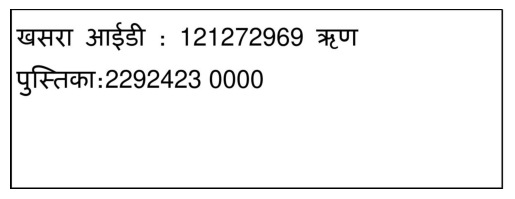


-----------------------------------------------------------------------------------

row_id = 278
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_3_019_pg3_cropped.jpg

खसरा आईडी : 121265340 ऋण
पुस्तिका:2292423


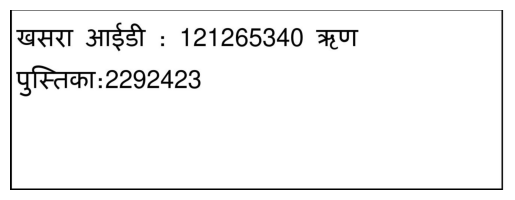


-----------------------------------------------------------------------------------

row_id = 279
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_1_019_pg3_cropped.jpg

खसरा आईडी : 121288406 ऋण
पुस्तिका:2292423


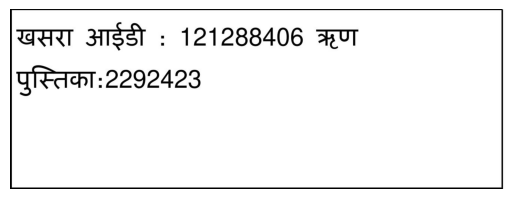


-----------------------------------------------------------------------------------

row_id = 280
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_4_019_pg3_cropped.jpg

खसरा आईडी : 121270028 ऋण
पुस्तिका:2292423


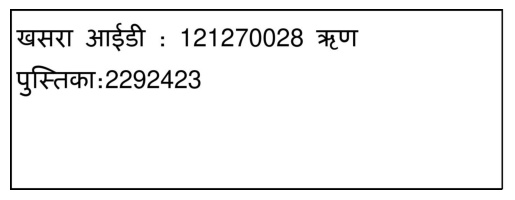


-----------------------------------------------------------------------------------

row_id = 281
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_0_row_2_019_pg3_cropped.jpg

खसरा आईडी : 121265335 ऋण
पुस्तिका:2292423


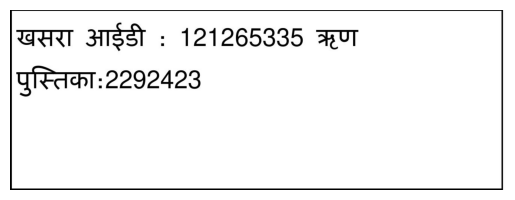


-----------------------------------------------------------------------------------

row_id = 282
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/029/029_pg1/pdf_to_images/column_0_row_1_029_pg1_cropped.jpg

खसरा आईडी : 105309578 छोटे झाड़ के
जंगल व घांस


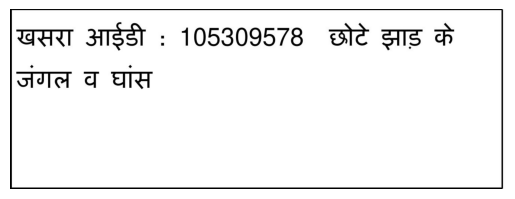


-----------------------------------------------------------------------------------

row_id = 283
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/033/033_pg1/pdf_to_images/column_0_row_1_033_pg1_cropped.jpg

खसरा आईडी : 101447080 पट्टे से प्रास
अहस्तांतरणीय


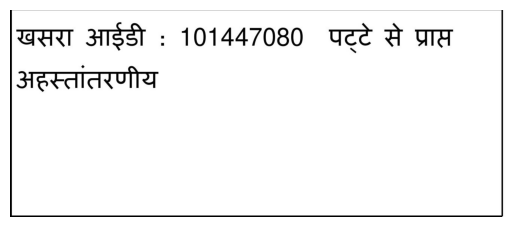


-----------------------------------------------------------------------------------



In [62]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(249,merged_df.shape[0]):
    a = i

    print('row_id =', i)
    print(df['image_path_col0'][a])
    print()
    # Assuming imagePath contains the path to the image you want to display
    imagePath = df['image_path_col0'][a]
    print(df['col_0_content'][a])
    # Load the image
    img = mpimg.imread(imagePath)
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    #plt.title(df['Content'][a])  # Set the title
    plt.show()
    print()
    print('-----------------------------------------------------------------------------------')
    print()

In [65]:
merged_df.head()

,pdf_file_name,col_0_txt_files,col_0_content,image_path_col0,col_1_txt_files,col_1_content,image_path_col1
0,041_pg2,column_0_row_2_041_pg2_cropped.txt,खसरा आईडी : 121288437 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_1_041_pg2_cropped.txt,1134,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
1,041_pg2,column_0_row_3_041_pg2_cropped.txt,खसरा आईडी : 121269750 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_3_041_pg2_cropped.txt,1350,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
2,041_pg2,column_0_row_1_041_pg2_cropped.txt,खसरा आईडी : 121272802 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_4_041_pg2_cropped.txt,1409,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
3,041_pg2,column_0_row_4_041_pg2_cropped.txt,खसरा आईडी : 121273201 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_2_041_pg2_cropped.txt,1348,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...
4,041_pg1,column_0_row_2_041_pg1_cropped.txt,खसरा आईडी : 121266301 ऋण पुस्तिकाः?,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...,column_1_row_1_041_pg1_cropped.txt,718,/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/sep...


In [68]:
merged_df['image_path_col1'][0]

'/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_1_row_1_041_pg2_cropped.jpg'

row_id = 0
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_1_row_1_041_pg2_cropped.jpg

1134


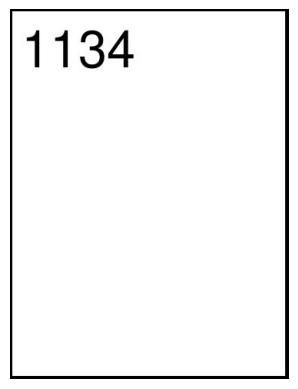


-----------------------------------------------------------------------------------

row_id = 1
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_1_row_3_041_pg2_cropped.jpg

1350


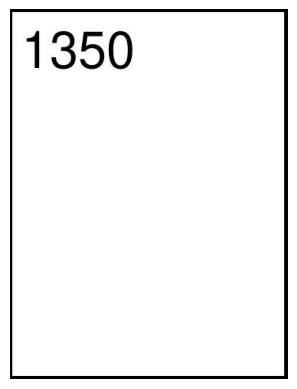


-----------------------------------------------------------------------------------

row_id = 2
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_1_row_4_041_pg2_cropped.jpg

1409


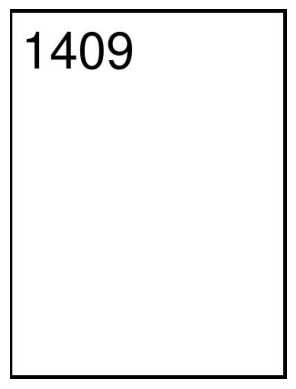


-----------------------------------------------------------------------------------

row_id = 3
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg2/pdf_to_images/column_1_row_2_041_pg2_cropped.jpg

1348


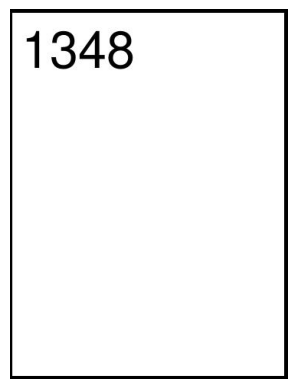


-----------------------------------------------------------------------------------

row_id = 4
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_1_row_1_041_pg1_cropped.jpg

718


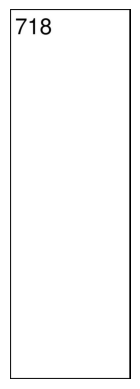


-----------------------------------------------------------------------------------

row_id = 5
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_1_row_3_041_pg1_cropped.jpg

1130/1


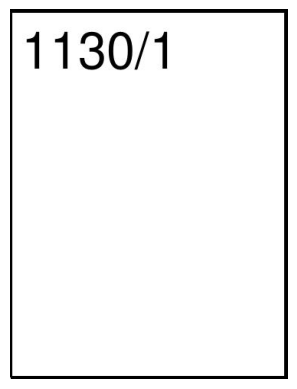


-----------------------------------------------------------------------------------

row_id = 6
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg1/pdf_to_images/column_1_row_2_041_pg1_cropped.jpg

719


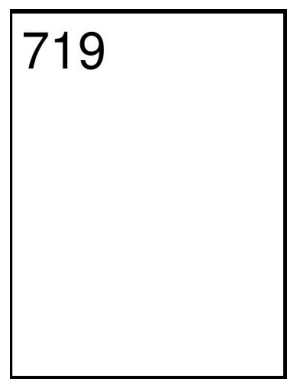


-----------------------------------------------------------------------------------

row_id = 7
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_1_row_3_041_pg3_cropped.jpg

1503


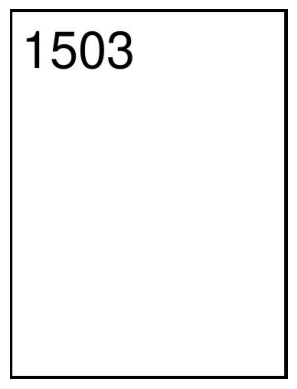


-----------------------------------------------------------------------------------

row_id = 8
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_1_row_2_041_pg3_cropped.jpg

1501


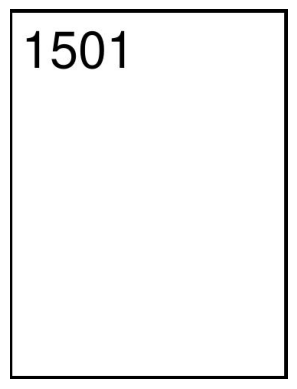


-----------------------------------------------------------------------------------

row_id = 9
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_1_row_4_041_pg3_cropped.jpg

1506


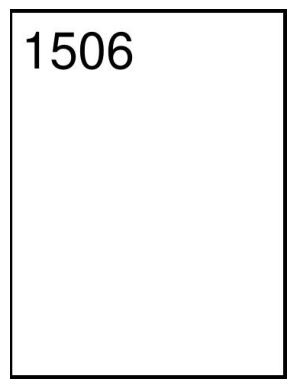


-----------------------------------------------------------------------------------

row_id = 10
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg3/pdf_to_images/column_1_row_1_041_pg3_cropped.jpg

1420


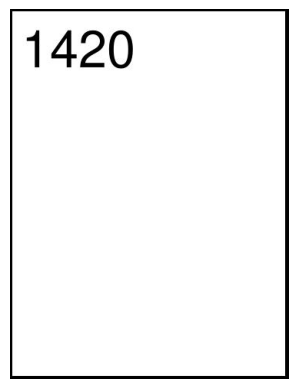


-----------------------------------------------------------------------------------

row_id = 11
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_1_row_4_041_pg4_cropped.jpg

1731


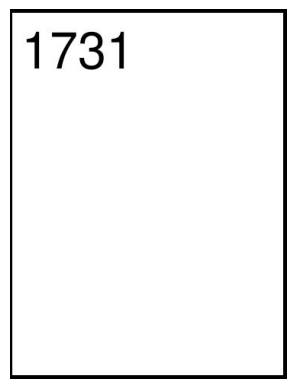


-----------------------------------------------------------------------------------

row_id = 12
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_1_row_1_041_pg4_cropped.jpg

1507


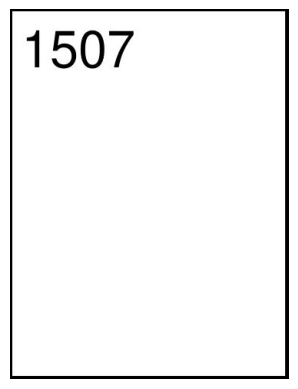


-----------------------------------------------------------------------------------

row_id = 13
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_1_row_3_041_pg4_cropped.jpg

1706


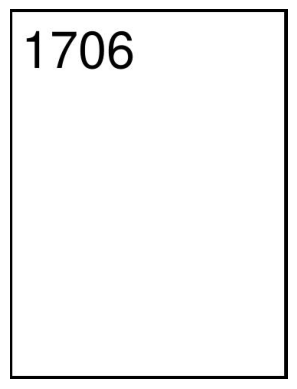


-----------------------------------------------------------------------------------

row_id = 14
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/041/041_pg4/pdf_to_images/column_1_row_2_041_pg4_cropped.jpg

1694


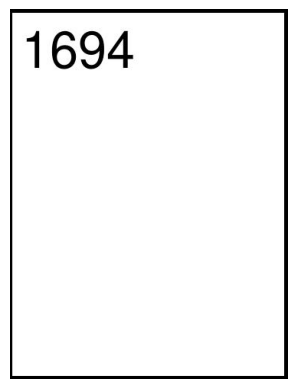


-----------------------------------------------------------------------------------

row_id = 15
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_1_row_1_063_pg1_cropped.jpg

142/3


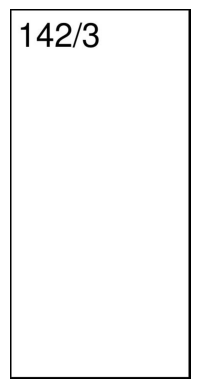


-----------------------------------------------------------------------------------

row_id = 16
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_1_row_2_063_pg1_cropped.jpg




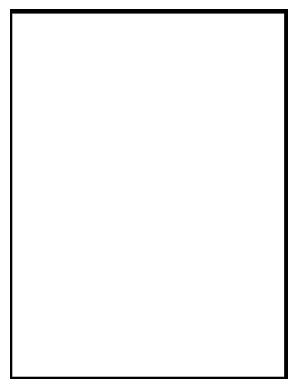


-----------------------------------------------------------------------------------

row_id = 17
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_1_row_4_063_pg1_cropped.jpg




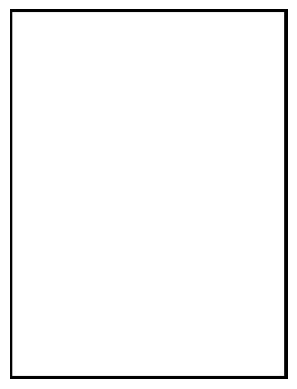


-----------------------------------------------------------------------------------

row_id = 18
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg1/pdf_to_images/column_1_row_3_063_pg1_cropped.jpg




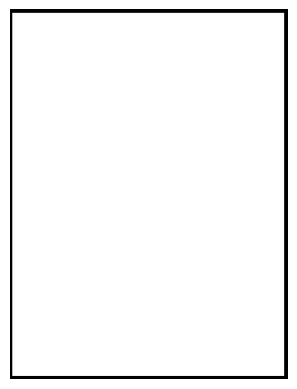


-----------------------------------------------------------------------------------

row_id = 19
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg2/pdf_to_images/column_1_row_1_063_pg2_cropped.jpg

143/2


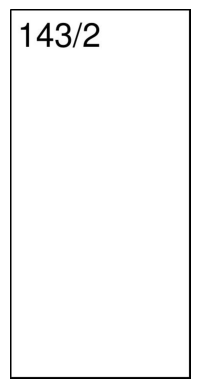


-----------------------------------------------------------------------------------

row_id = 20
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/063/063_pg2/pdf_to_images/column_1_row_2_063_pg2_cropped.jpg

261/2


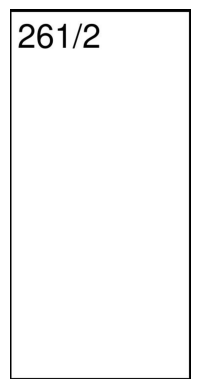


-----------------------------------------------------------------------------------

row_id = 21
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_1_row_3_065_pg1_cropped.jpg

1467/7


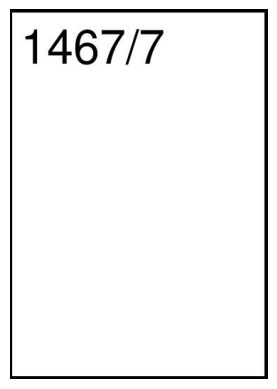


-----------------------------------------------------------------------------------

row_id = 22
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_1_row_2_065_pg1_cropped.jpg

1453/3


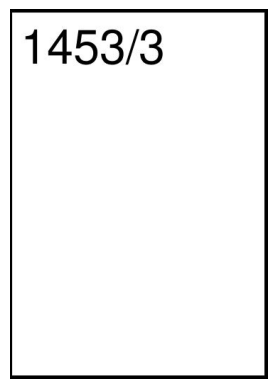


-----------------------------------------------------------------------------------

row_id = 23
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_1_row_1_065_pg1_cropped.jpg

1418/3


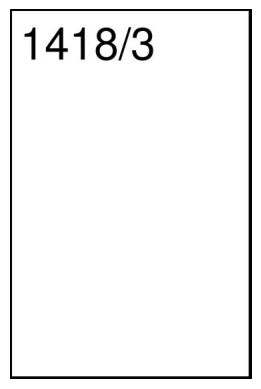


-----------------------------------------------------------------------------------

row_id = 24
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/065/065_pg1/pdf_to_images/column_1_row_4_065_pg1_cropped.jpg

1470/6


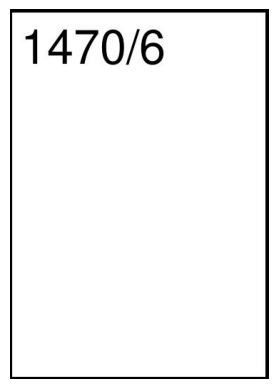


-----------------------------------------------------------------------------------

row_id = 25
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_1_row_2_026_pg1_cropped.jpg

329


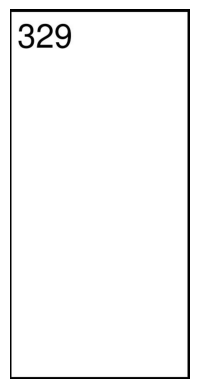


-----------------------------------------------------------------------------------

row_id = 26
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_1_row_3_026_pg1_cropped.jpg

655/2


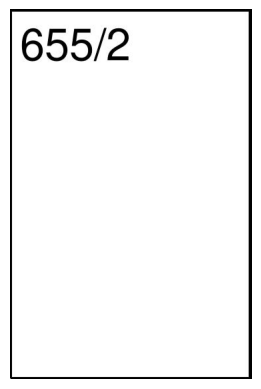


-----------------------------------------------------------------------------------

row_id = 27
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg1/pdf_to_images/column_1_row_1_026_pg1_cropped.jpg

265


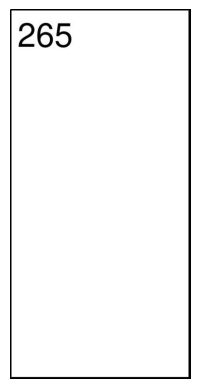


-----------------------------------------------------------------------------------

row_id = 28
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg3/pdf_to_images/column_1_row_2_026_pg3_cropped.jpg

920/3


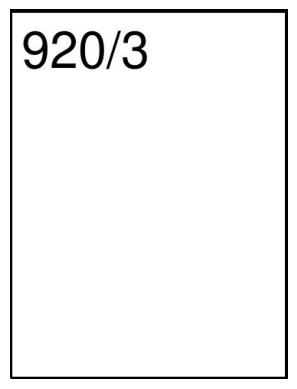


-----------------------------------------------------------------------------------

row_id = 29
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg3/pdf_to_images/column_1_row_1_026_pg3_cropped.jpg

806/3


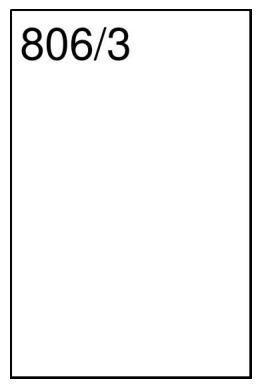


-----------------------------------------------------------------------------------

row_id = 30
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_1_row_2_026_pg2_cropped.jpg

789/3


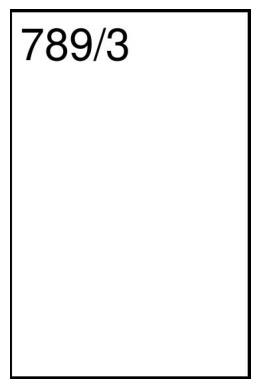


-----------------------------------------------------------------------------------

row_id = 31
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_1_row_1_026_pg2_cropped.jpg

784/3


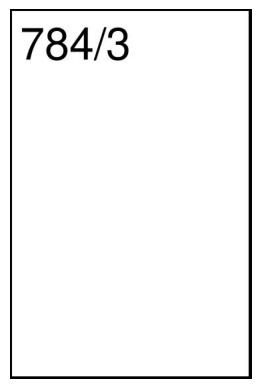


-----------------------------------------------------------------------------------

row_id = 32
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_1_row_3_026_pg2_cropped.jpg

790/1


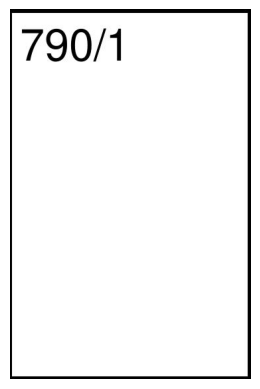


-----------------------------------------------------------------------------------

row_id = 33
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/026/026_pg2/pdf_to_images/column_1_row_4_026_pg2_cropped.jpg

790/2


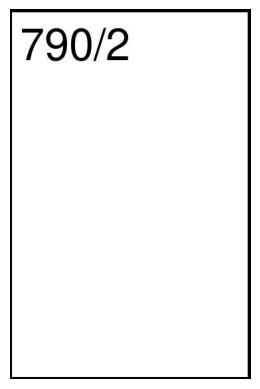


-----------------------------------------------------------------------------------

row_id = 34
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_1_row_2_020_pg1_cropped.jpg

87/1


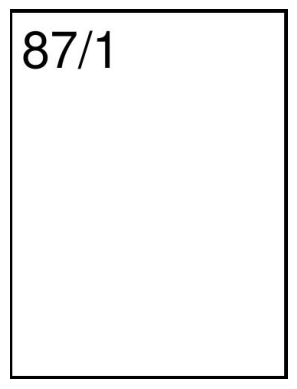


-----------------------------------------------------------------------------------

row_id = 35
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_1_row_4_020_pg1_cropped.jpg

96/1


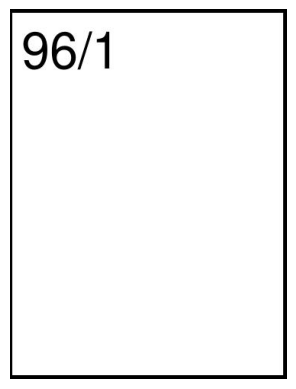


-----------------------------------------------------------------------------------

row_id = 36
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_1_row_3_020_pg1_cropped.jpg

94


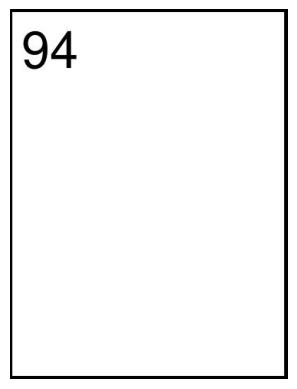


-----------------------------------------------------------------------------------

row_id = 37
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg1/pdf_to_images/column_1_row_1_020_pg1_cropped.jpg

86/1


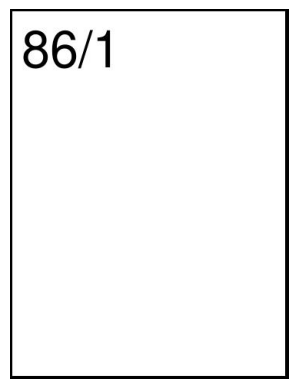


-----------------------------------------------------------------------------------

row_id = 38
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_1_row_3_020_pg2_cropped.jpg

335/2


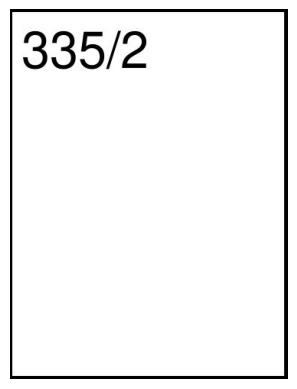


-----------------------------------------------------------------------------------

row_id = 39
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_1_row_1_020_pg2_cropped.jpg

99/2


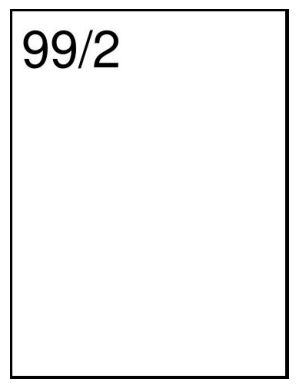


-----------------------------------------------------------------------------------

row_id = 40
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_1_row_2_020_pg2_cropped.jpg

228/1


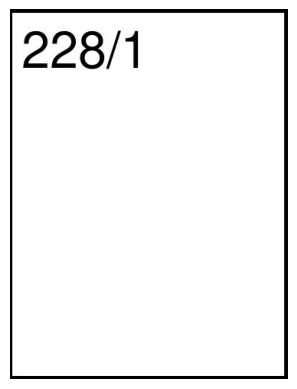


-----------------------------------------------------------------------------------

row_id = 41
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg2/pdf_to_images/column_1_row_4_020_pg2_cropped.jpg

337/2


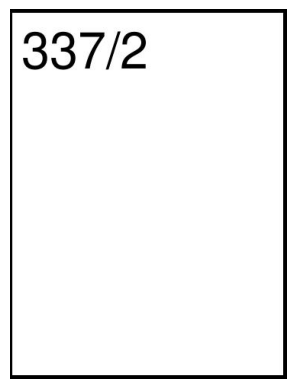


-----------------------------------------------------------------------------------

row_id = 42
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_1_row_1_020_pg3_cropped.jpg

337/579


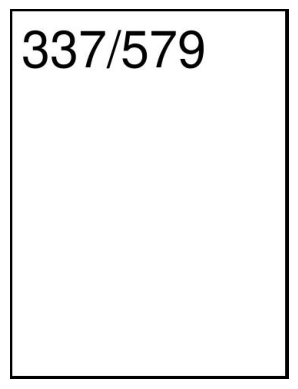


-----------------------------------------------------------------------------------

row_id = 43
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_1_row_4_020_pg3_cropped.jpg

368/2


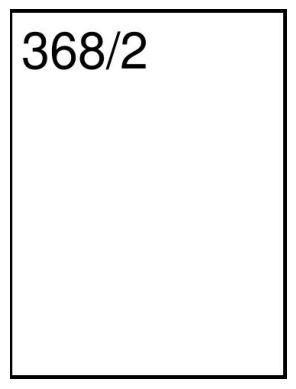


-----------------------------------------------------------------------------------

row_id = 44
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_1_row_2_020_pg3_cropped.jpg

338/2


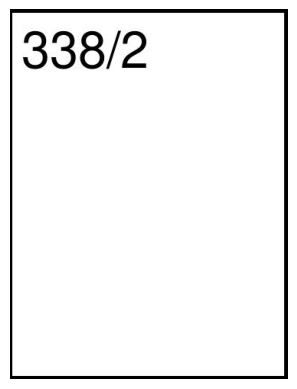


-----------------------------------------------------------------------------------

row_id = 45
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg3/pdf_to_images/column_1_row_3_020_pg3_cropped.jpg

366/2


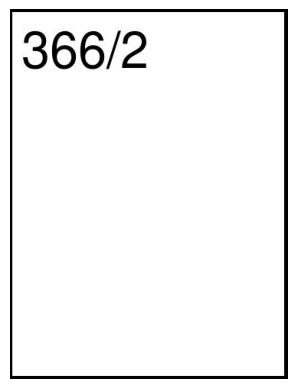


-----------------------------------------------------------------------------------

row_id = 46
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_1_row_3_020_pg4_cropped.jpg

399/2


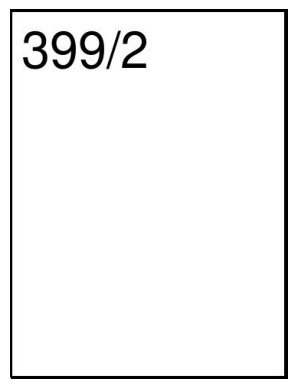


-----------------------------------------------------------------------------------

row_id = 47
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_1_row_1_020_pg4_cropped.jpg

369/1


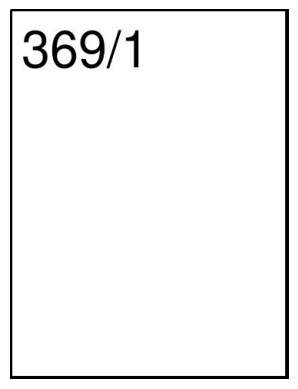


-----------------------------------------------------------------------------------

row_id = 48
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/020/020_pg4/pdf_to_images/column_1_row_2_020_pg4_cropped.jpg

370/3


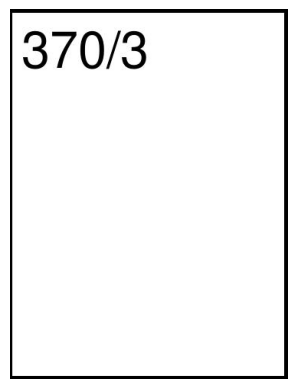


-----------------------------------------------------------------------------------

row_id = 49
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg6/pdf_to_images/column_1_row_1_038_pg6_cropped.jpg

942


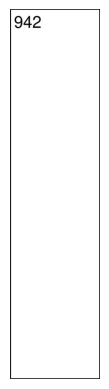


-----------------------------------------------------------------------------------

row_id = 50
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg3/pdf_to_images/column_1_row_1_038_pg3_cropped.jpg

346


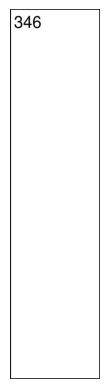


-----------------------------------------------------------------------------------

row_id = 51
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg8/pdf_to_images/column_1_row_1_038_pg8_cropped.jpg

950


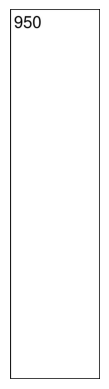


-----------------------------------------------------------------------------------

row_id = 52
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg1/pdf_to_images/column_1_row_1_038_pg1_cropped.jpg

96


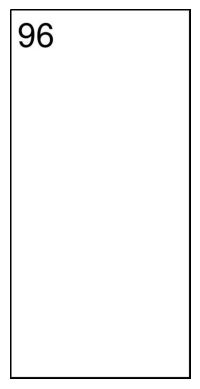


-----------------------------------------------------------------------------------

row_id = 53
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg1/pdf_to_images/column_1_row_2_038_pg1_cropped.jpg




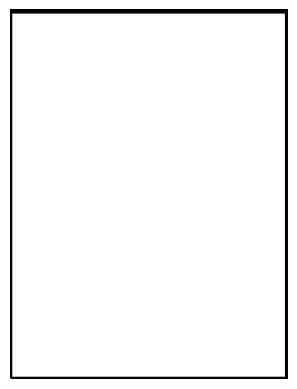


-----------------------------------------------------------------------------------

row_id = 54
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg9/pdf_to_images/column_1_row_1_038_pg9_cropped.jpg

957


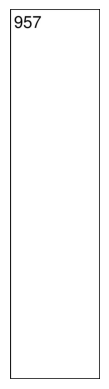


-----------------------------------------------------------------------------------

row_id = 55
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg7/pdf_to_images/column_1_row_1_038_pg7_cropped.jpg

947


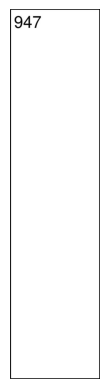


-----------------------------------------------------------------------------------

row_id = 56
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg5/pdf_to_images/column_1_row_1_038_pg5_cropped.jpg

941


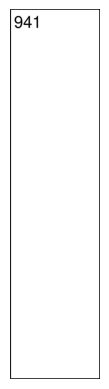


-----------------------------------------------------------------------------------

row_id = 57
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg4/pdf_to_images/column_1_row_1_038_pg4_cropped.jpg

935/1


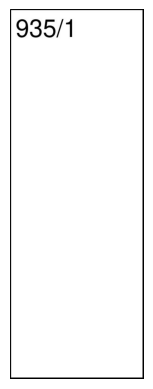


-----------------------------------------------------------------------------------

row_id = 58
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg4/pdf_to_images/column_1_row_2_038_pg4_cropped.jpg

940


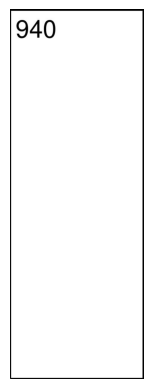


-----------------------------------------------------------------------------------

row_id = 59
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/038/038_pg2/pdf_to_images/column_1_row_1_038_pg2_cropped.jpg

345/1


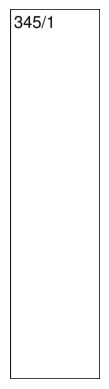


-----------------------------------------------------------------------------------

row_id = 60
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/025/025_pg1/pdf_to_images/column_1_row_1_025_pg1_cropped.jpg

141/11


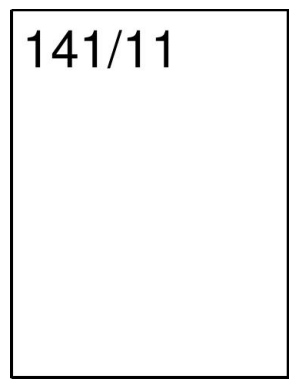


-----------------------------------------------------------------------------------

row_id = 61
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/064/064_pg1/pdf_to_images/column_1_row_1_064_pg1_cropped.jpg

100


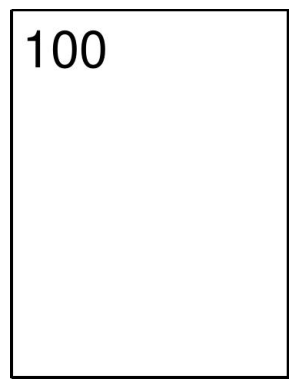


-----------------------------------------------------------------------------------

row_id = 62
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_1_row_2_032_pg2_cropped.jpg

417/2


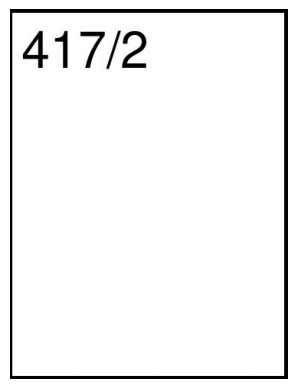


-----------------------------------------------------------------------------------

row_id = 63
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_1_row_3_032_pg2_cropped.jpg

546/4


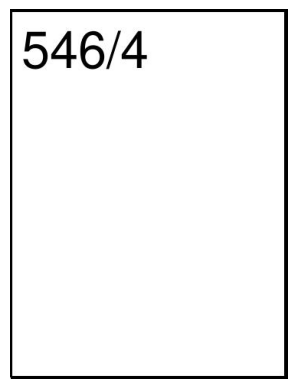


-----------------------------------------------------------------------------------

row_id = 64
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg2/pdf_to_images/column_1_row_1_032_pg2_cropped.jpg

371/2


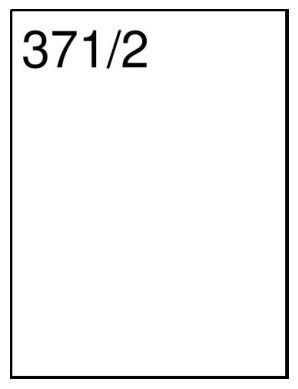


-----------------------------------------------------------------------------------

row_id = 65
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_1_row_3_032_pg1_cropped.jpg

26/3


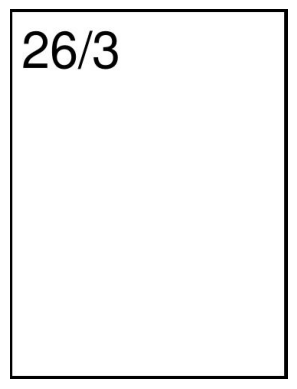


-----------------------------------------------------------------------------------

row_id = 66
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_1_row_1_032_pg1_cropped.jpg

12/1


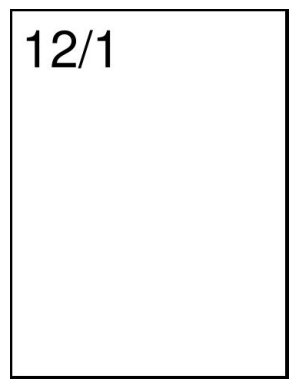


-----------------------------------------------------------------------------------

row_id = 67
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_1_row_4_032_pg1_cropped.jpg

78/2


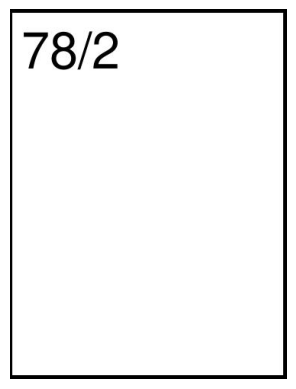


-----------------------------------------------------------------------------------

row_id = 68
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/032/032_pg1/pdf_to_images/column_1_row_2_032_pg1_cropped.jpg

22/2


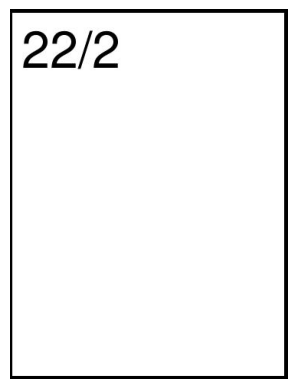


-----------------------------------------------------------------------------------

row_id = 69
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/055/055_pg1/pdf_to_images/column_1_row_1_055_pg1_cropped.jpg

1582/1


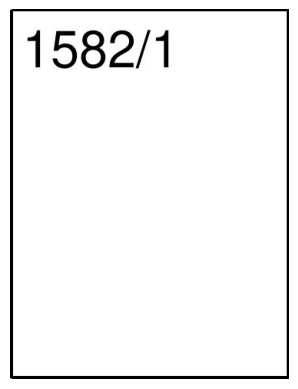


-----------------------------------------------------------------------------------

row_id = 70
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/022/022_pg1/pdf_to_images/column_1_row_1_022_pg1_cropped.jpg

38/5


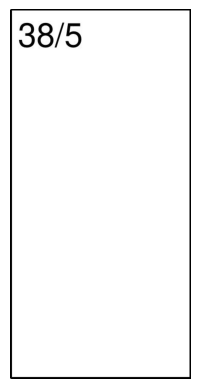


-----------------------------------------------------------------------------------

row_id = 71
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/049/049_pg1/pdf_to_images/column_1_row_1_049_pg1_cropped.jpg

48


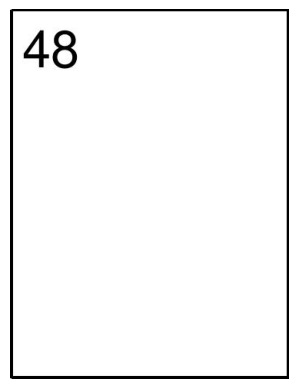


-----------------------------------------------------------------------------------

row_id = 72
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/058/058_pg1/pdf_to_images/column_1_row_1_058_pg1_cropped.jpg

18


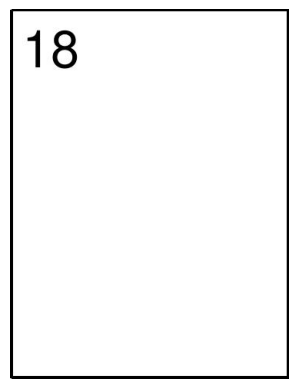


-----------------------------------------------------------------------------------

row_id = 73
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/060/060_pg1/pdf_to_images/column_1_row_2_060_pg1_cropped.jpg

279/3


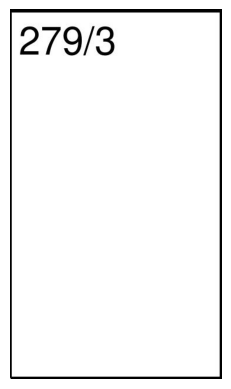


-----------------------------------------------------------------------------------

row_id = 74
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/060/060_pg1/pdf_to_images/column_1_row_1_060_pg1_cropped.jpg

279/1


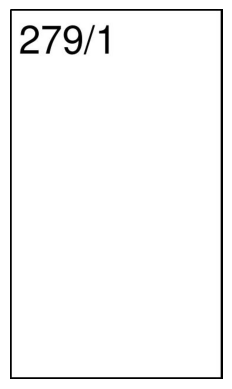


-----------------------------------------------------------------------------------

row_id = 75
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/037/037_pg1/pdf_to_images/column_1_row_1_037_pg1_cropped.jpg

30


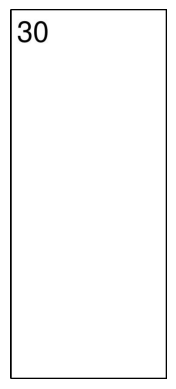


-----------------------------------------------------------------------------------

row_id = 76
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/061/061_pg1/pdf_to_images/column_1_row_1_061_pg1_cropped.jpg

9


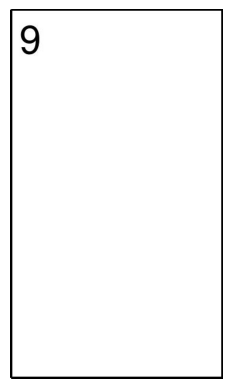


-----------------------------------------------------------------------------------

row_id = 77
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/034/034_pg1/pdf_to_images/column_1_row_1_034_pg1_cropped.jpg

185


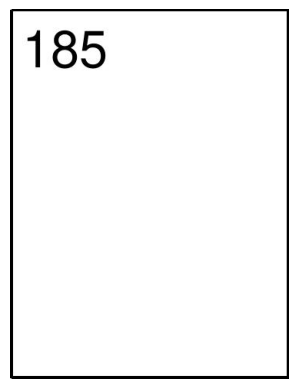


-----------------------------------------------------------------------------------

row_id = 78
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/046/046_pg1/pdf_to_images/column_1_row_1_046_pg1_cropped.jpg

77


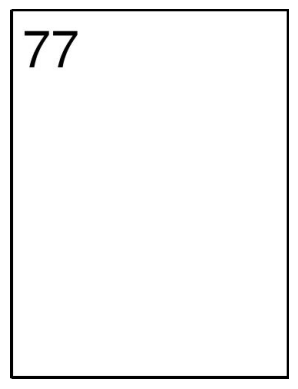


-----------------------------------------------------------------------------------

row_id = 79
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_1_row_3_052_pg1_cropped.jpg

336


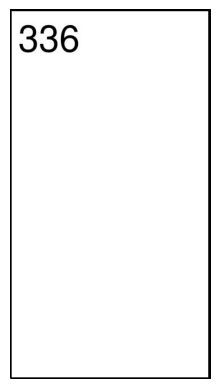


-----------------------------------------------------------------------------------

row_id = 80
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_1_row_1_052_pg1_cropped.jpg

265/3 ȡǓ 266,267/1


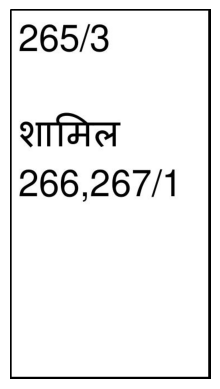


-----------------------------------------------------------------------------------

row_id = 81
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/052/052_pg1/pdf_to_images/column_1_row_2_052_pg1_cropped.jpg

267/2


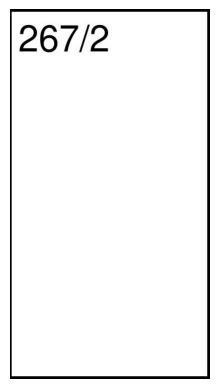


-----------------------------------------------------------------------------------

row_id = 82
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg2/pdf_to_images/column_1_row_1_059_pg2_cropped.jpg

347/3


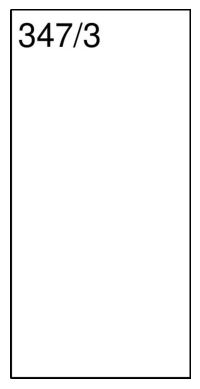


-----------------------------------------------------------------------------------

row_id = 83
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_1_row_2_059_pg1_cropped.jpg

347/1


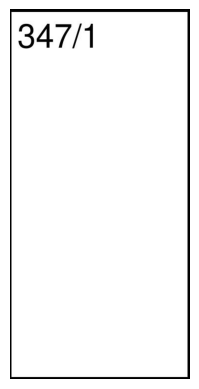


-----------------------------------------------------------------------------------

row_id = 84
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_1_row_1_059_pg1_cropped.jpg

346


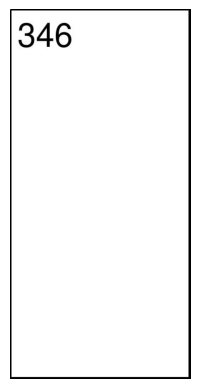


-----------------------------------------------------------------------------------

row_id = 85
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/059/059_pg1/pdf_to_images/column_1_row_3_059_pg1_cropped.jpg

347/2


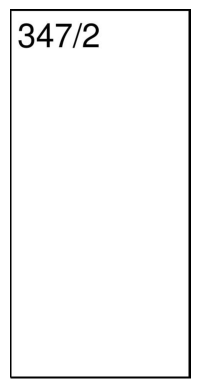


-----------------------------------------------------------------------------------

row_id = 86
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg1/pdf_to_images/column_1_row_2_040_pg1_cropped.jpg




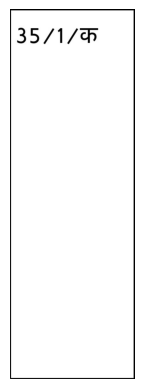


-----------------------------------------------------------------------------------

row_id = 87
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg1/pdf_to_images/column_1_row_1_040_pg1_cropped.jpg

21


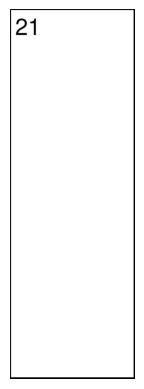


-----------------------------------------------------------------------------------

row_id = 88
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg7/pdf_to_images/column_1_row_1_040_pg7_cropped.jpg




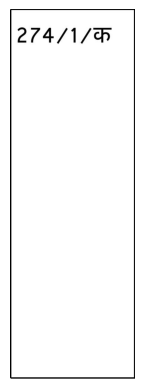


-----------------------------------------------------------------------------------

row_id = 89
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg6/pdf_to_images/column_1_row_1_040_pg6_cropped.jpg




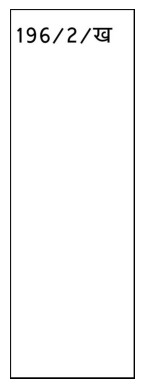


-----------------------------------------------------------------------------------

row_id = 90
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg6/pdf_to_images/column_1_row_2_040_pg6_cropped.jpg




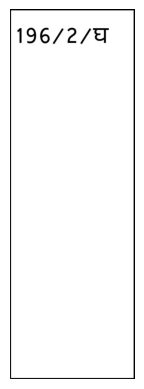


-----------------------------------------------------------------------------------

row_id = 91
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg5/pdf_to_images/column_1_row_2_040_pg5_cropped.jpg




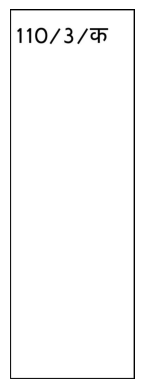


-----------------------------------------------------------------------------------

row_id = 92
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg5/pdf_to_images/column_1_row_1_040_pg5_cropped.jpg

94/1


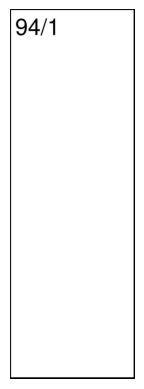


-----------------------------------------------------------------------------------

row_id = 93
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg4/pdf_to_images/column_1_row_1_040_pg4_cropped.jpg




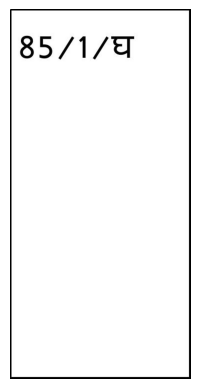


-----------------------------------------------------------------------------------

row_id = 94
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg4/pdf_to_images/column_1_row_2_040_pg4_cropped.jpg




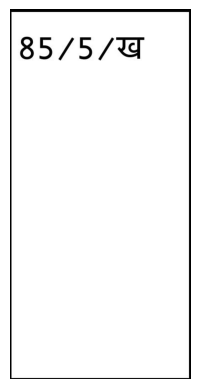


-----------------------------------------------------------------------------------

row_id = 95
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg2/pdf_to_images/column_1_row_2_040_pg2_cropped.jpg




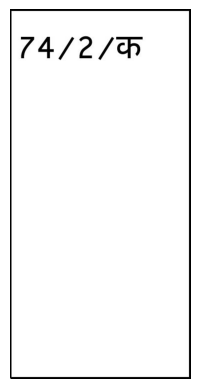


-----------------------------------------------------------------------------------

row_id = 96
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg2/pdf_to_images/column_1_row_1_040_pg2_cropped.jpg

48


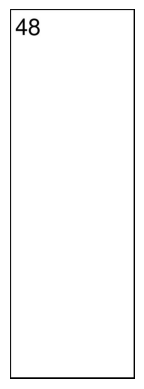


-----------------------------------------------------------------------------------

row_id = 97
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg3/pdf_to_images/column_1_row_1_040_pg3_cropped.jpg




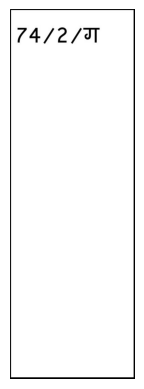


-----------------------------------------------------------------------------------

row_id = 98
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/040/040_pg3/pdf_to_images/column_1_row_2_040_pg3_cropped.jpg

83/2


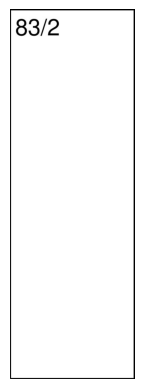


-----------------------------------------------------------------------------------

row_id = 99
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_1_row_1_021_pg1_cropped.jpg

34/3


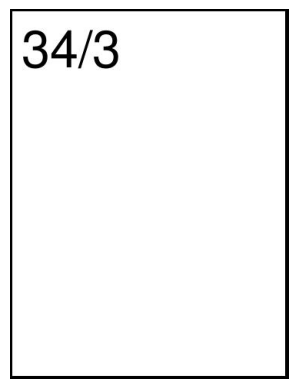


-----------------------------------------------------------------------------------

row_id = 100
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_1_row_3_021_pg1_cropped.jpg

64/6


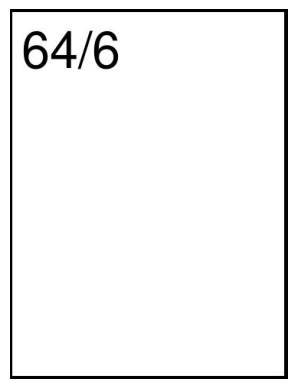


-----------------------------------------------------------------------------------

row_id = 101
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_1_row_2_021_pg1_cropped.jpg

51/2


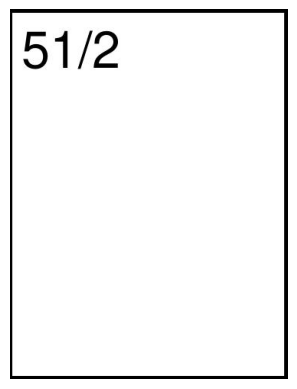


-----------------------------------------------------------------------------------

row_id = 102
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg1/pdf_to_images/column_1_row_4_021_pg1_cropped.jpg

94/1


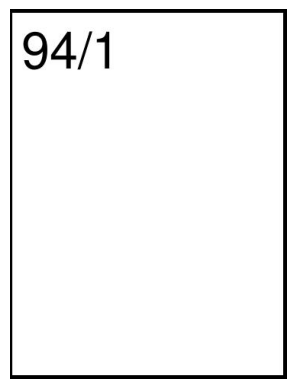


-----------------------------------------------------------------------------------

row_id = 103
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/021/021_pg2/pdf_to_images/column_1_row_1_021_pg2_cropped.jpg

109/3


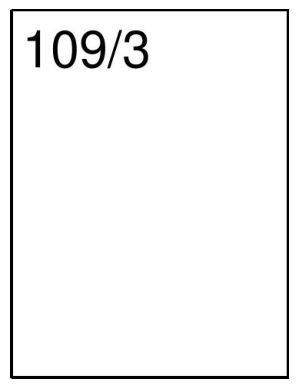


-----------------------------------------------------------------------------------

row_id = 104
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/066/066_pg1/pdf_to_images/column_1_row_1_066_pg1_cropped.jpg

84/11


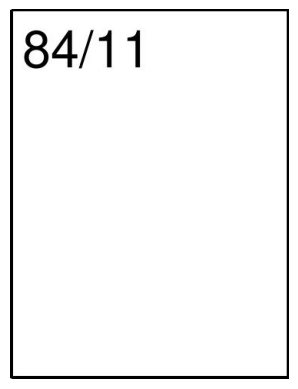


-----------------------------------------------------------------------------------

row_id = 105
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/035/035_pg1/pdf_to_images/column_1_row_1_035_pg1_cropped.jpg

107/11


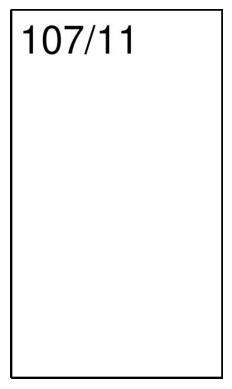


-----------------------------------------------------------------------------------

row_id = 106
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_1_row_4_053_pg1_cropped.jpg

85


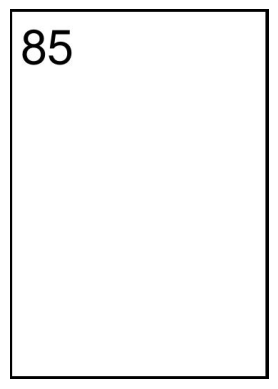


-----------------------------------------------------------------------------------

row_id = 107
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_1_row_2_053_pg1_cropped.jpg




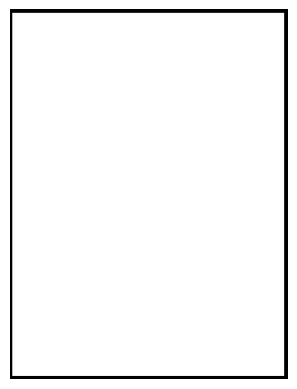


-----------------------------------------------------------------------------------

row_id = 108
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_1_row_1_053_pg1_cropped.jpg

16


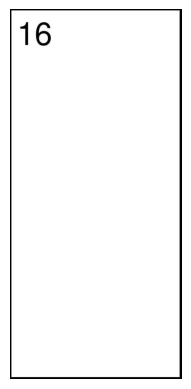


-----------------------------------------------------------------------------------

row_id = 109
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg1/pdf_to_images/column_1_row_3_053_pg1_cropped.jpg

17


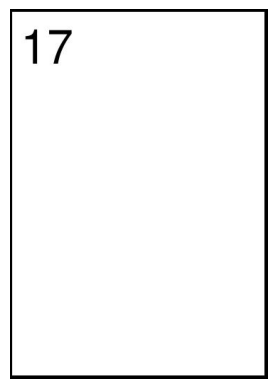


-----------------------------------------------------------------------------------

row_id = 110
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/053/053_pg2/pdf_to_images/column_1_row_1_053_pg2_cropped.jpg

174


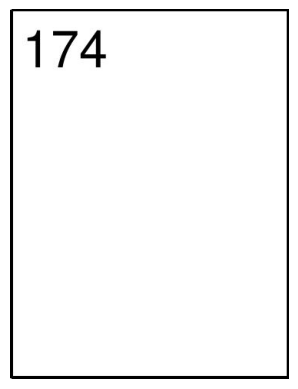


-----------------------------------------------------------------------------------

row_id = 111
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/051/051_pg1/pdf_to_images/column_1_row_1_051_pg1_cropped.jpg

153


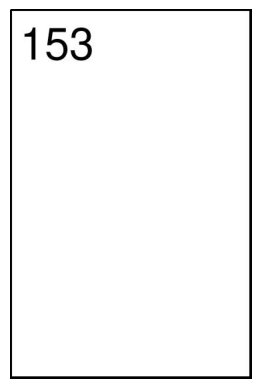


-----------------------------------------------------------------------------------

row_id = 112
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/051/051_pg1/pdf_to_images/column_1_row_2_051_pg1_cropped.jpg

189


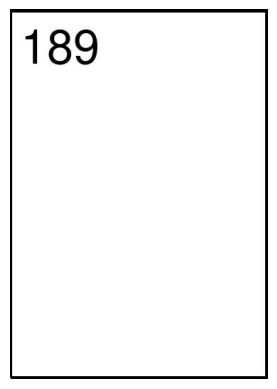


-----------------------------------------------------------------------------------

row_id = 113
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/024/024_pg1/pdf_to_images/column_1_row_1_024_pg1_cropped.jpg

252


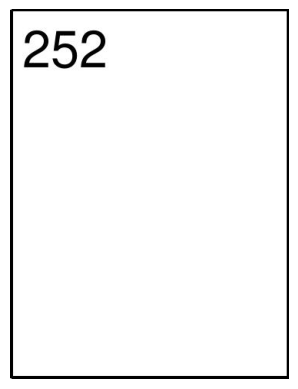


-----------------------------------------------------------------------------------

row_id = 114
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_1_row_3_017_pg2_cropped.jpg

210/6


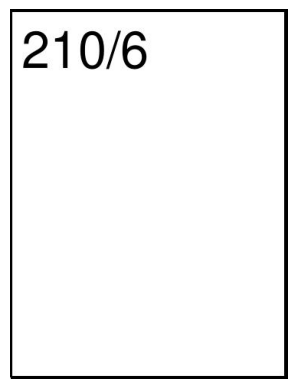


-----------------------------------------------------------------------------------

row_id = 115
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_1_row_2_017_pg2_cropped.jpg

186/6


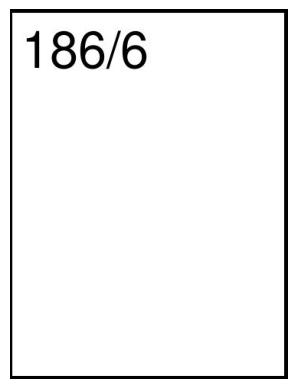


-----------------------------------------------------------------------------------

row_id = 116
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg2/pdf_to_images/column_1_row_1_017_pg2_cropped.jpg

63/6


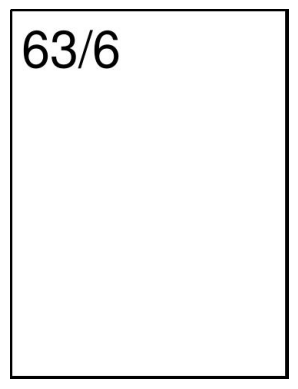


-----------------------------------------------------------------------------------

row_id = 117
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_1_row_2_017_pg1_cropped.jpg

28/6


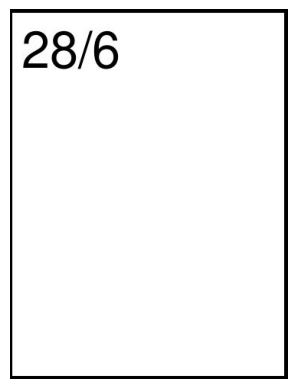


-----------------------------------------------------------------------------------

row_id = 118
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_1_row_4_017_pg1_cropped.jpg

53/6


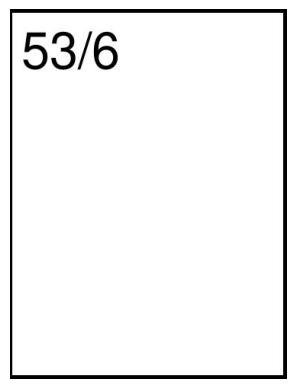


-----------------------------------------------------------------------------------

row_id = 119
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_1_row_3_017_pg1_cropped.jpg

33/6


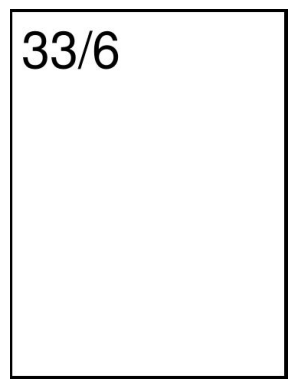


-----------------------------------------------------------------------------------

row_id = 120
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/017/017_pg1/pdf_to_images/column_1_row_1_017_pg1_cropped.jpg

26/6


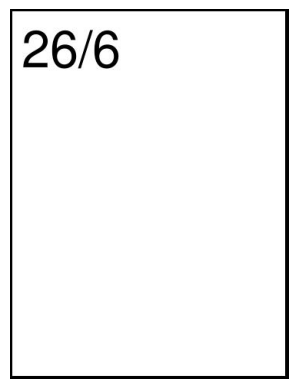


-----------------------------------------------------------------------------------

row_id = 121
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/047/047_pg1/pdf_to_images/column_1_row_1_047_pg1_cropped.jpg

328


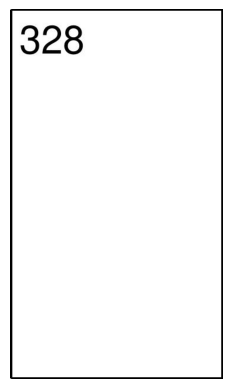


-----------------------------------------------------------------------------------

row_id = 122
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/043/043_pg1/pdf_to_images/column_1_row_1_043_pg1_cropped.jpg

703


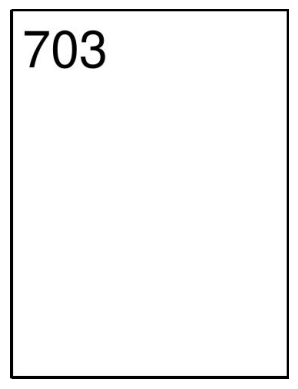


-----------------------------------------------------------------------------------

row_id = 123
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/018/018_pg1/pdf_to_images/column_1_row_1_018_pg1_cropped.jpg

36


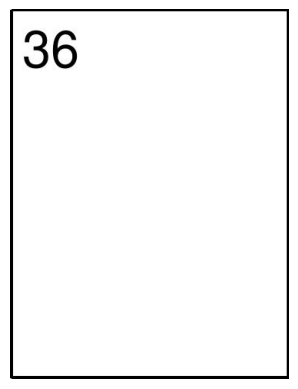


-----------------------------------------------------------------------------------

row_id = 124
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_1_row_1_057_pg4_cropped.jpg

365


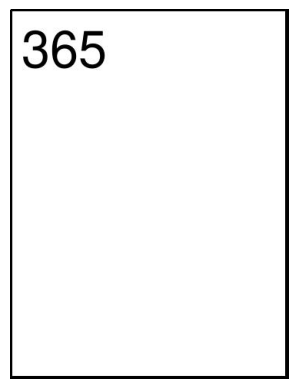


-----------------------------------------------------------------------------------

row_id = 125
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_1_row_2_057_pg4_cropped.jpg

404


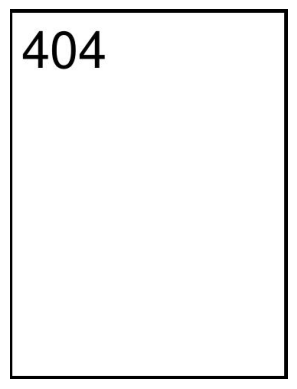


-----------------------------------------------------------------------------------

row_id = 126
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg4/pdf_to_images/column_1_row_3_057_pg4_cropped.jpg

427


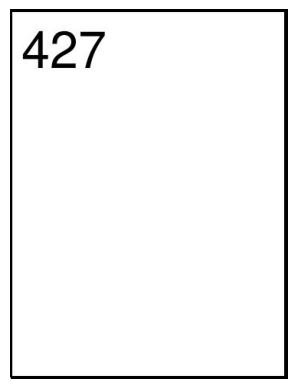


-----------------------------------------------------------------------------------

row_id = 127
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_1_row_3_057_pg1_cropped.jpg

222


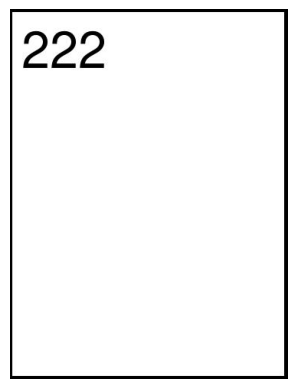


-----------------------------------------------------------------------------------

row_id = 128
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_1_row_2_057_pg1_cropped.jpg

217


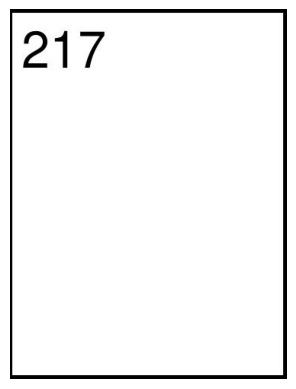


-----------------------------------------------------------------------------------

row_id = 129
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_1_row_1_057_pg1_cropped.jpg

216


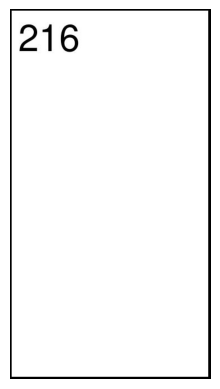


-----------------------------------------------------------------------------------

row_id = 130
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg1/pdf_to_images/column_1_row_4_057_pg1_cropped.jpg

254


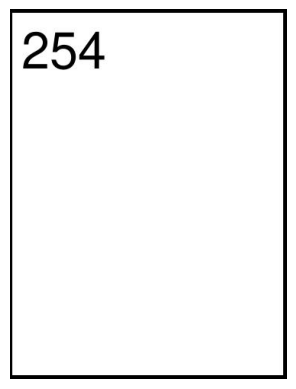


-----------------------------------------------------------------------------------

row_id = 131
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_1_row_1_057_pg2_cropped.jpg

292


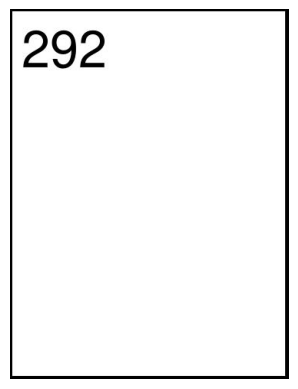


-----------------------------------------------------------------------------------

row_id = 132
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_1_row_4_057_pg2_cropped.jpg

309


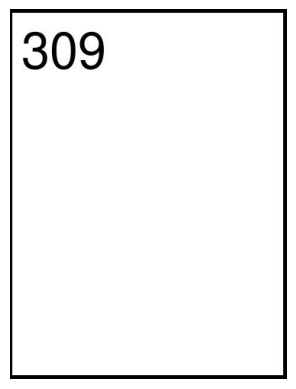


-----------------------------------------------------------------------------------

row_id = 133
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_1_row_3_057_pg2_cropped.jpg

294


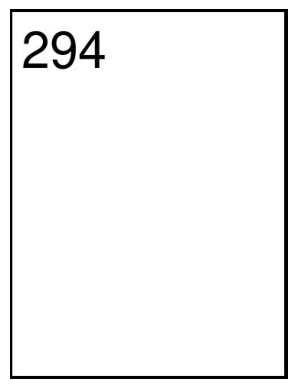


-----------------------------------------------------------------------------------

row_id = 134
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg2/pdf_to_images/column_1_row_2_057_pg2_cropped.jpg

293


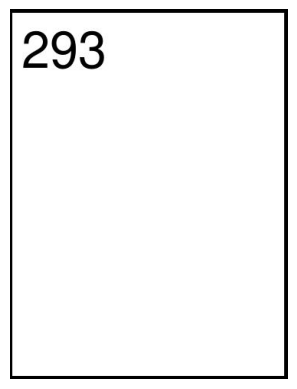


-----------------------------------------------------------------------------------

row_id = 135
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_1_row_3_057_pg3_cropped.jpg

361


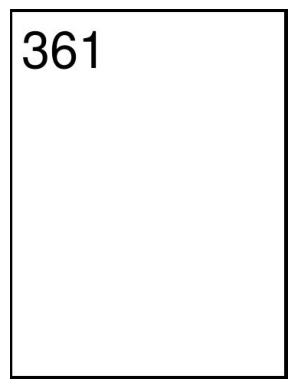


-----------------------------------------------------------------------------------

row_id = 136
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_1_row_2_057_pg3_cropped.jpg

360


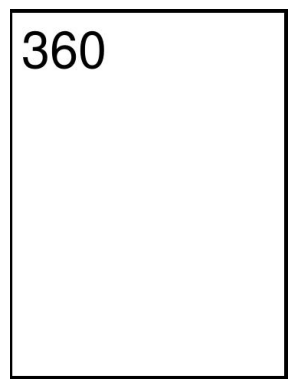


-----------------------------------------------------------------------------------

row_id = 137
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_1_row_1_057_pg3_cropped.jpg

319


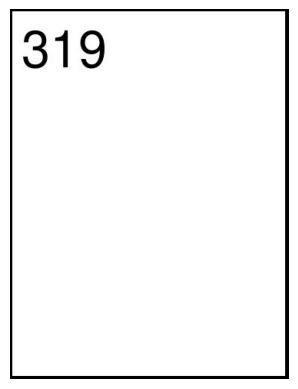


-----------------------------------------------------------------------------------

row_id = 138
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/057/057_pg3/pdf_to_images/column_1_row_4_057_pg3_cropped.jpg

363


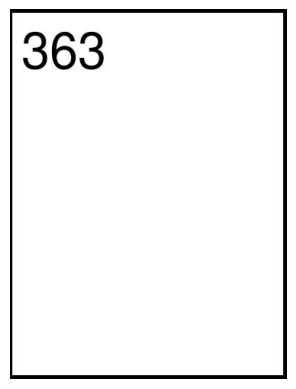


-----------------------------------------------------------------------------------

row_id = 139
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_1_row_1_036_pg3_cropped.jpg

72


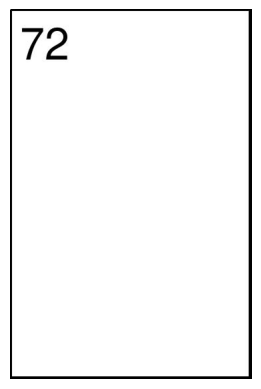


-----------------------------------------------------------------------------------

row_id = 140
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_1_row_2_036_pg3_cropped.jpg

125/2


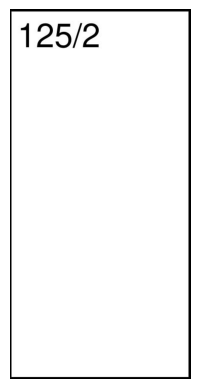


-----------------------------------------------------------------------------------

row_id = 141
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg3/pdf_to_images/column_1_row_3_036_pg3_cropped.jpg

157/2


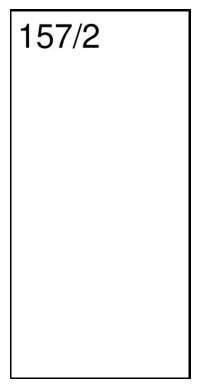


-----------------------------------------------------------------------------------

row_id = 142
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg2/pdf_to_images/column_1_row_1_036_pg2_cropped.jpg

38


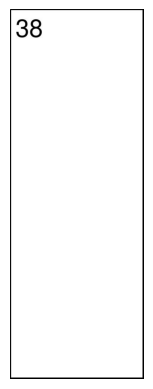


-----------------------------------------------------------------------------------

row_id = 143
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg2/pdf_to_images/column_1_row_2_036_pg2_cropped.jpg

61/3


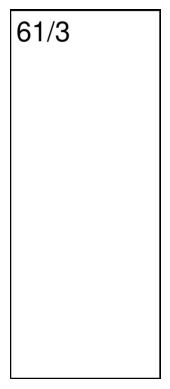


-----------------------------------------------------------------------------------

row_id = 144
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg4/pdf_to_images/column_1_row_2_036_pg4_cropped.jpg

234/1


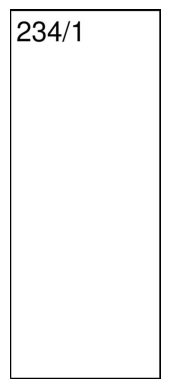


-----------------------------------------------------------------------------------

row_id = 145
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg4/pdf_to_images/column_1_row_1_036_pg4_cropped.jpg

233/2 ȡǓ 234/1


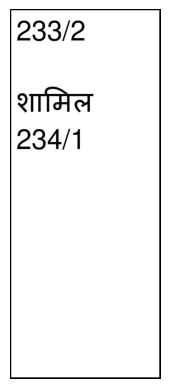


-----------------------------------------------------------------------------------

row_id = 146
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg5/pdf_to_images/column_1_row_1_036_pg5_cropped.jpg

249/2


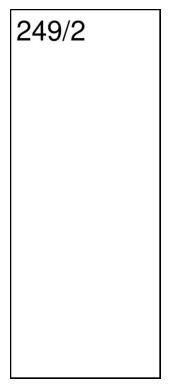


-----------------------------------------------------------------------------------

row_id = 147
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg5/pdf_to_images/column_1_row_2_036_pg5_cropped.jpg

279


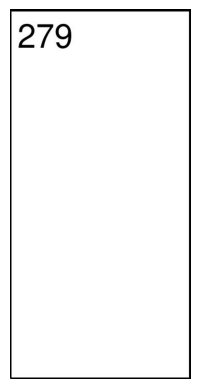


-----------------------------------------------------------------------------------

row_id = 148
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg1/pdf_to_images/column_1_row_1_036_pg1_cropped.jpg

9


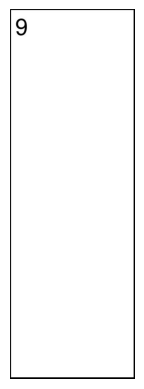


-----------------------------------------------------------------------------------

row_id = 149
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/036/036_pg1/pdf_to_images/column_1_row_2_036_pg1_cropped.jpg

19


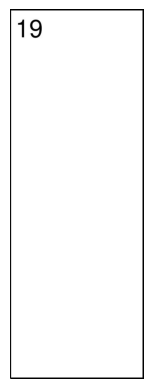


-----------------------------------------------------------------------------------

row_id = 150
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/027/027_pg1/pdf_to_images/column_1_row_1_027_pg1_cropped.jpg

107


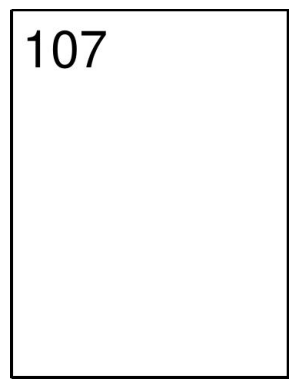


-----------------------------------------------------------------------------------

row_id = 151
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_1_row_1_031_pg2_cropped.jpg

289/3


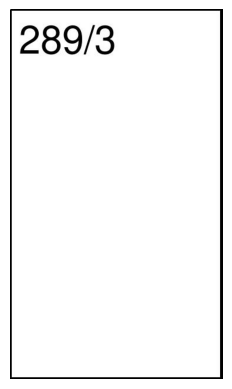


-----------------------------------------------------------------------------------

row_id = 152
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_1_row_2_031_pg2_cropped.jpg

289/4


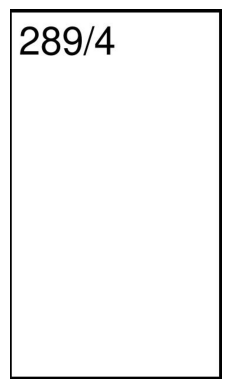


-----------------------------------------------------------------------------------

row_id = 153
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg2/pdf_to_images/column_1_row_3_031_pg2_cropped.jpg

435/2


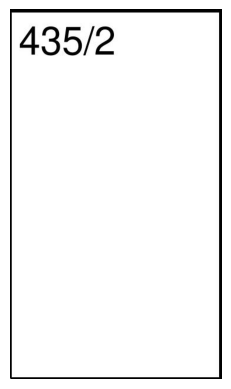


-----------------------------------------------------------------------------------

row_id = 154
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_1_row_3_031_pg3_cropped.jpg

477/6


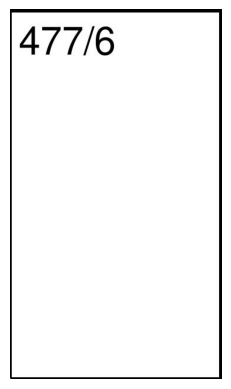


-----------------------------------------------------------------------------------

row_id = 155
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_1_row_1_031_pg3_cropped.jpg

453/2


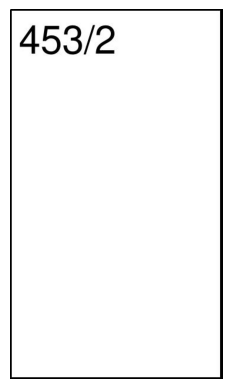


-----------------------------------------------------------------------------------

row_id = 156
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg3/pdf_to_images/column_1_row_2_031_pg3_cropped.jpg

453/4


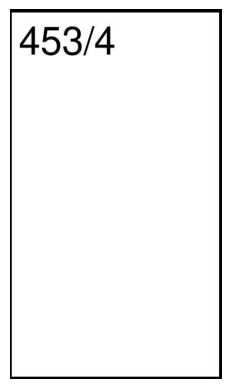


-----------------------------------------------------------------------------------

row_id = 157
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg4/pdf_to_images/column_1_row_1_031_pg4_cropped.jpg

623/2


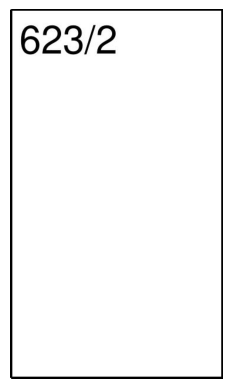


-----------------------------------------------------------------------------------

row_id = 158
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_1_row_2_031_pg1_cropped.jpg

6/2


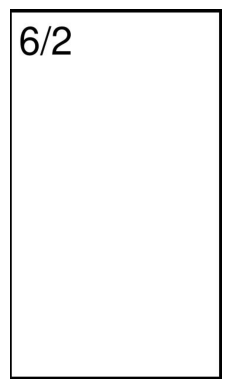


-----------------------------------------------------------------------------------

row_id = 159
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_1_row_3_031_pg1_cropped.jpg

212/1


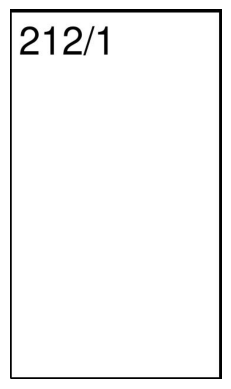


-----------------------------------------------------------------------------------

row_id = 160
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/031/031_pg1/pdf_to_images/column_1_row_1_031_pg1_cropped.jpg

6/1


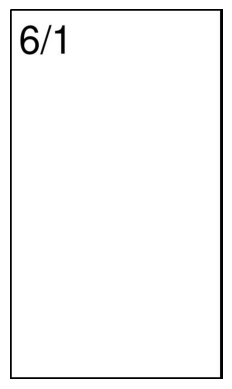


-----------------------------------------------------------------------------------

row_id = 161
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/045/045_pg1/pdf_to_images/column_1_row_1_045_pg1_cropped.jpg

37


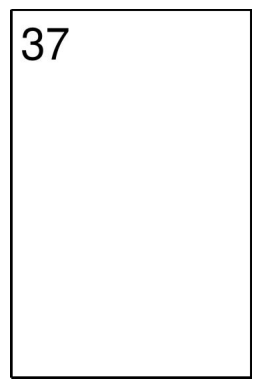


-----------------------------------------------------------------------------------

row_id = 162
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_1_row_2_028_pg1_cropped.jpg

231


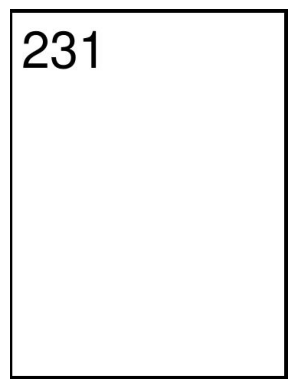


-----------------------------------------------------------------------------------

row_id = 163
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_1_row_4_028_pg1_cropped.jpg

302/1


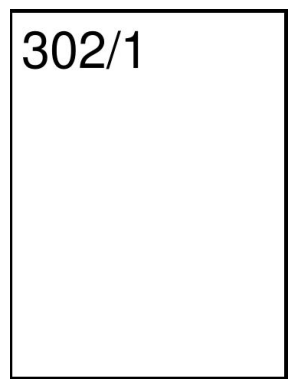


-----------------------------------------------------------------------------------

row_id = 164
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_1_row_1_028_pg1_cropped.jpg

228/1


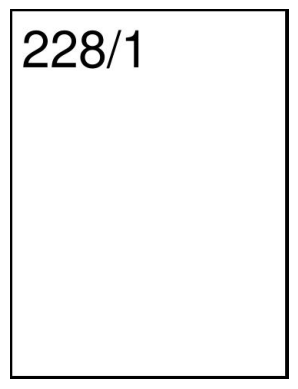


-----------------------------------------------------------------------------------

row_id = 165
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/028/028_pg1/pdf_to_images/column_1_row_3_028_pg1_cropped.jpg

251/1


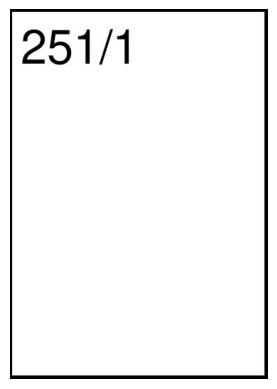


-----------------------------------------------------------------------------------

row_id = 166
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/062/062_pg1/pdf_to_images/column_1_row_2_062_pg1_cropped.jpg

100


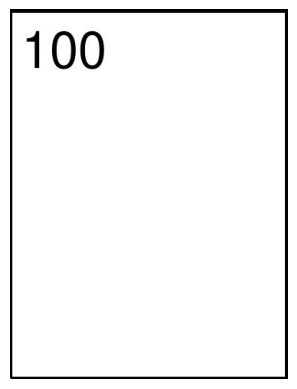


-----------------------------------------------------------------------------------

row_id = 167
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/062/062_pg1/pdf_to_images/column_1_row_1_062_pg1_cropped.jpg

99


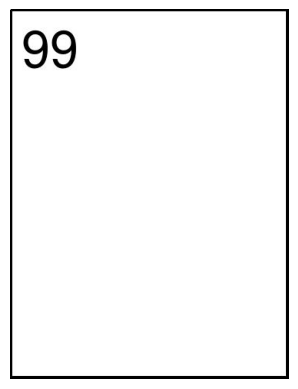


-----------------------------------------------------------------------------------

row_id = 168
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_1_row_3_039_pg2_cropped.jpg

1204/1


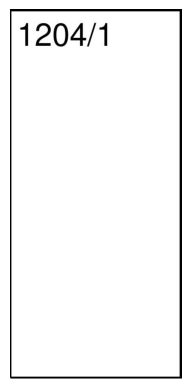


-----------------------------------------------------------------------------------

row_id = 169
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_1_row_2_039_pg2_cropped.jpg

1020


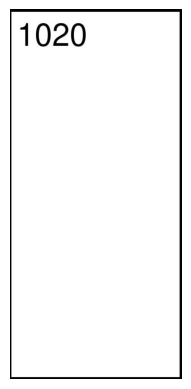


-----------------------------------------------------------------------------------

row_id = 170
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg2/pdf_to_images/column_1_row_1_039_pg2_cropped.jpg

723


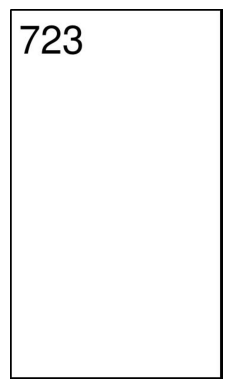


-----------------------------------------------------------------------------------

row_id = 171
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_1_row_3_039_pg3_cropped.jpg

1262


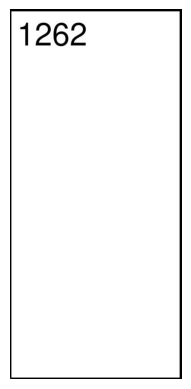


-----------------------------------------------------------------------------------

row_id = 172
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_1_row_2_039_pg3_cropped.jpg

1236


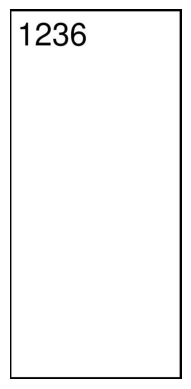


-----------------------------------------------------------------------------------

row_id = 173
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg3/pdf_to_images/column_1_row_1_039_pg3_cropped.jpg

1220


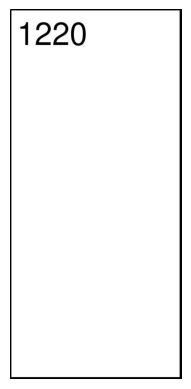


-----------------------------------------------------------------------------------

row_id = 174
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg1/pdf_to_images/column_1_row_1_039_pg1_cropped.jpg

66


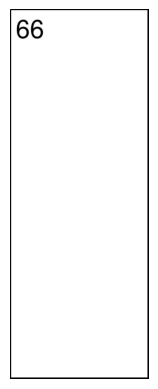


-----------------------------------------------------------------------------------

row_id = 175
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/039/039_pg1/pdf_to_images/column_1_row_2_039_pg1_cropped.jpg

508


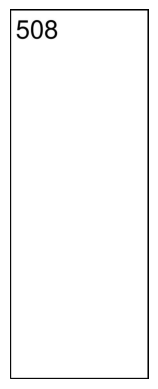


-----------------------------------------------------------------------------------

row_id = 176
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_1_row_4_042_pg1_cropped.jpg

328


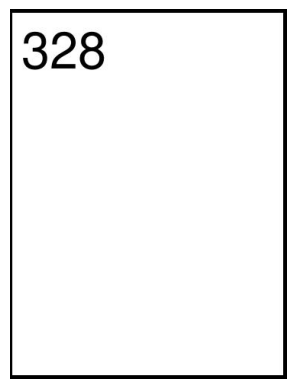


-----------------------------------------------------------------------------------

row_id = 177
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_1_row_3_042_pg1_cropped.jpg




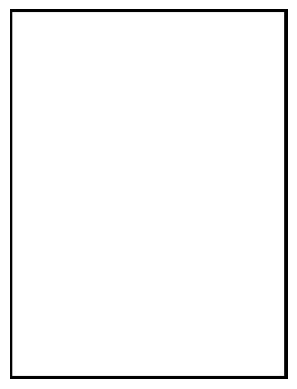


-----------------------------------------------------------------------------------

row_id = 178
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_1_row_2_042_pg1_cropped.jpg




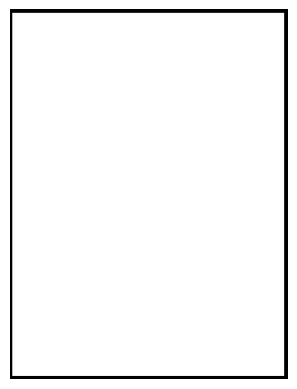


-----------------------------------------------------------------------------------

row_id = 179
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg1/pdf_to_images/column_1_row_1_042_pg1_cropped.jpg

313


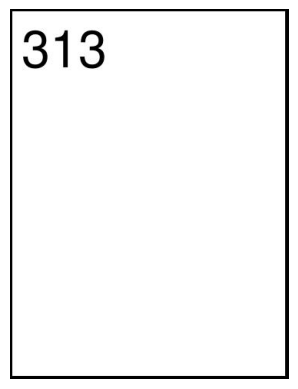


-----------------------------------------------------------------------------------

row_id = 180
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_1_row_4_042_pg2_cropped.jpg

854


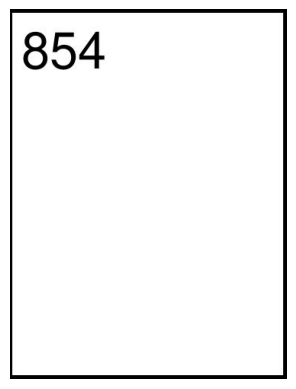


-----------------------------------------------------------------------------------

row_id = 181
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_1_row_3_042_pg2_cropped.jpg

851


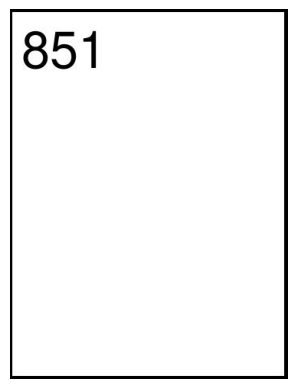


-----------------------------------------------------------------------------------

row_id = 182
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_1_row_1_042_pg2_cropped.jpg

334


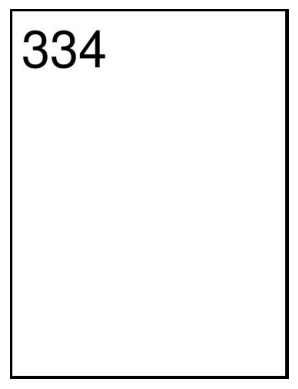


-----------------------------------------------------------------------------------

row_id = 183
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg2/pdf_to_images/column_1_row_2_042_pg2_cropped.jpg

808


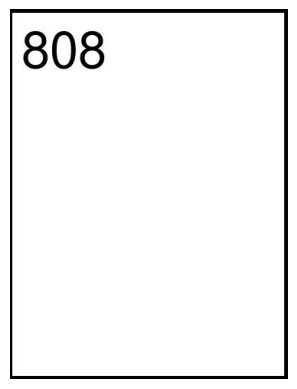


-----------------------------------------------------------------------------------

row_id = 184
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_1_row_1_042_pg3_cropped.jpg

946


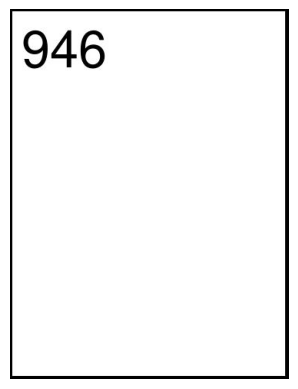


-----------------------------------------------------------------------------------

row_id = 185
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_1_row_2_042_pg3_cropped.jpg

956


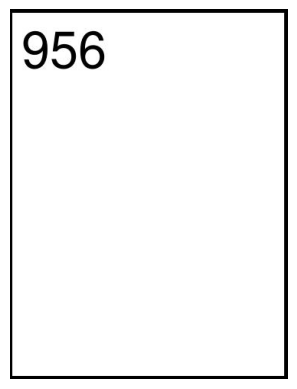


-----------------------------------------------------------------------------------

row_id = 186
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_1_row_4_042_pg3_cropped.jpg

1006


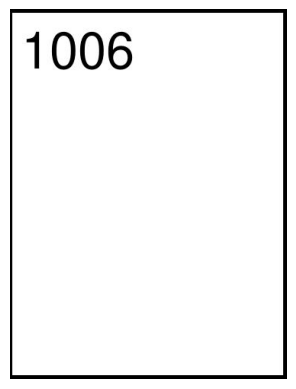


-----------------------------------------------------------------------------------

row_id = 187
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg3/pdf_to_images/column_1_row_3_042_pg3_cropped.jpg

972


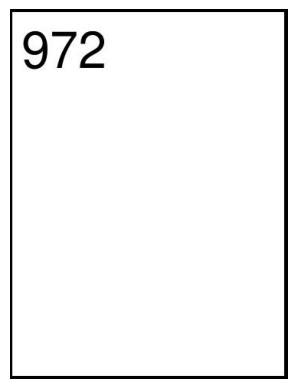


-----------------------------------------------------------------------------------

row_id = 188
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg4/pdf_to_images/column_1_row_1_042_pg4_cropped.jpg

1016


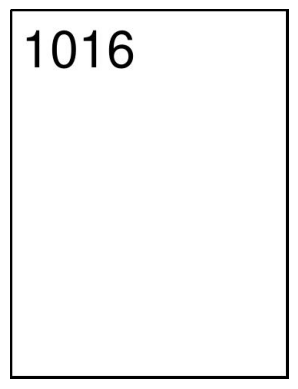


-----------------------------------------------------------------------------------

row_id = 189
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/042/042_pg4/pdf_to_images/column_1_row_2_042_pg4_cropped.jpg

1091


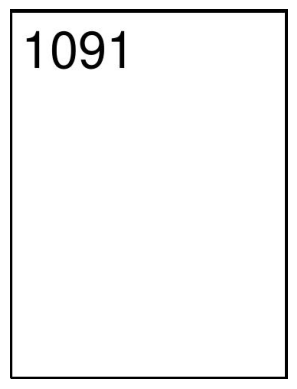


-----------------------------------------------------------------------------------

row_id = 190
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/050/050_pg1/pdf_to_images/column_1_row_1_050_pg1_cropped.jpg

650


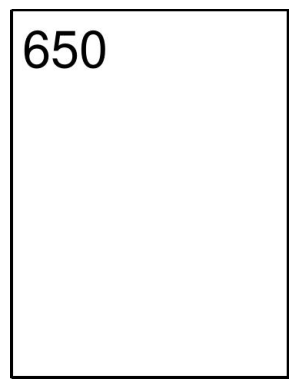


-----------------------------------------------------------------------------------

row_id = 191
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_1_row_2_015_pg5_cropped.jpg

494/1


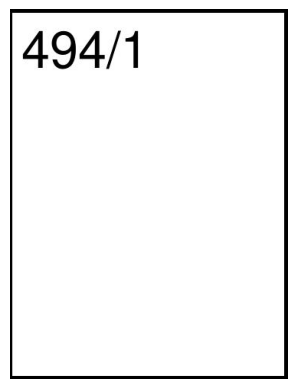


-----------------------------------------------------------------------------------

row_id = 192
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_1_row_3_015_pg5_cropped.jpg

509/1


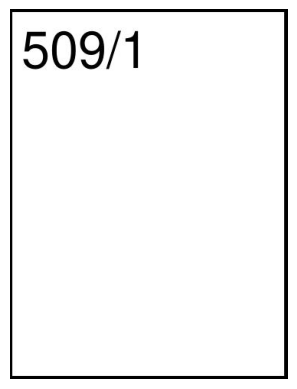


-----------------------------------------------------------------------------------

row_id = 193
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_1_row_1_015_pg5_cropped.jpg

441/1


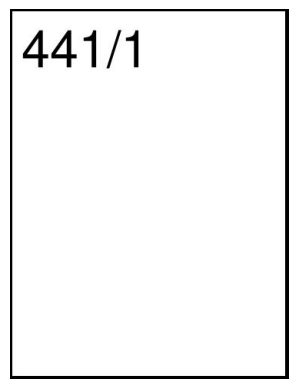


-----------------------------------------------------------------------------------

row_id = 194
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg5/pdf_to_images/column_1_row_4_015_pg5_cropped.jpg

516/1


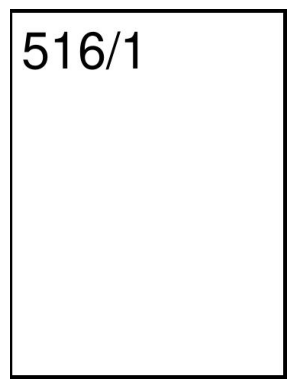


-----------------------------------------------------------------------------------

row_id = 195
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_1_row_1_015_pg2_cropped.jpg




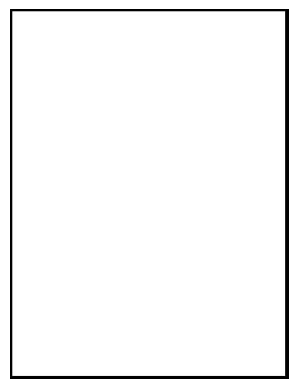


-----------------------------------------------------------------------------------

row_id = 196
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_1_row_2_015_pg2_cropped.jpg

41/1


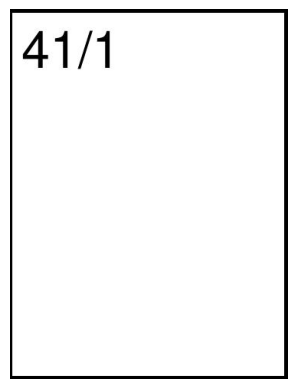


-----------------------------------------------------------------------------------

row_id = 197
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_1_row_4_015_pg2_cropped.jpg

125


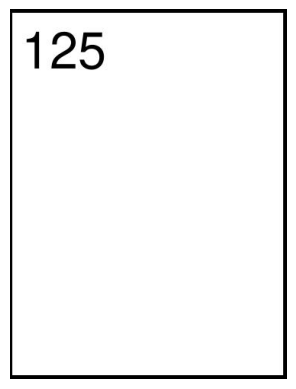


-----------------------------------------------------------------------------------

row_id = 198
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg2/pdf_to_images/column_1_row_3_015_pg2_cropped.jpg

106/1


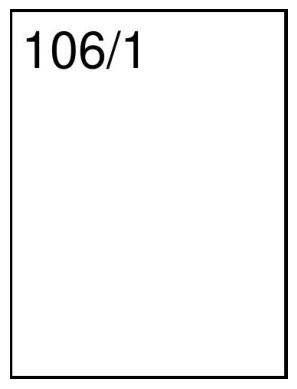


-----------------------------------------------------------------------------------

row_id = 199
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_1_row_3_015_pg1_cropped.jpg




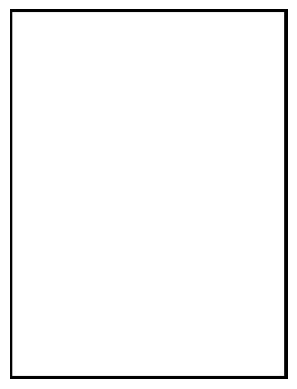


-----------------------------------------------------------------------------------

row_id = 200
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_1_row_1_015_pg1_cropped.jpg

2


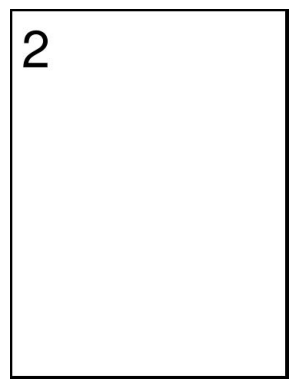


-----------------------------------------------------------------------------------

row_id = 201
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_1_row_4_015_pg1_cropped.jpg




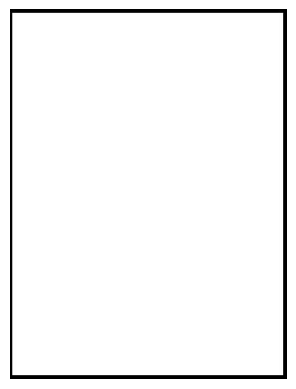


-----------------------------------------------------------------------------------

row_id = 202
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg1/pdf_to_images/column_1_row_2_015_pg1_cropped.jpg




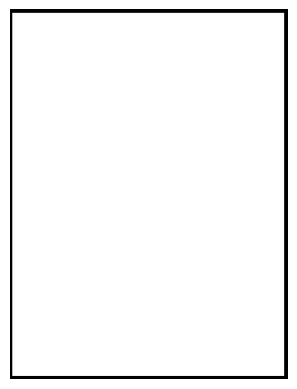


-----------------------------------------------------------------------------------

row_id = 203
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_1_row_1_015_pg7_cropped.jpg

761


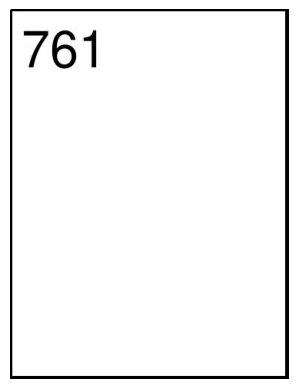


-----------------------------------------------------------------------------------

row_id = 204
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_1_row_3_015_pg7_cropped.jpg

967/1


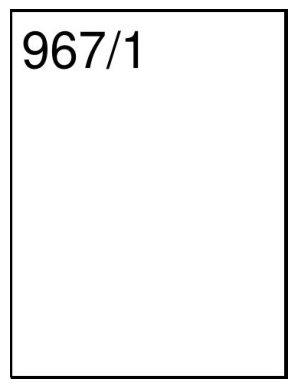


-----------------------------------------------------------------------------------

row_id = 205
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg7/pdf_to_images/column_1_row_2_015_pg7_cropped.jpg

956/1


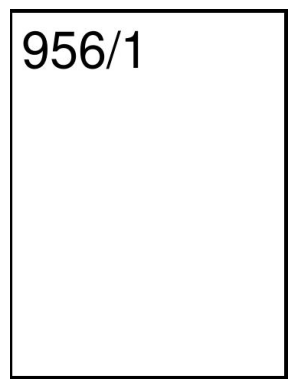


-----------------------------------------------------------------------------------

row_id = 206
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_1_row_1_015_pg3_cropped.jpg

127/1


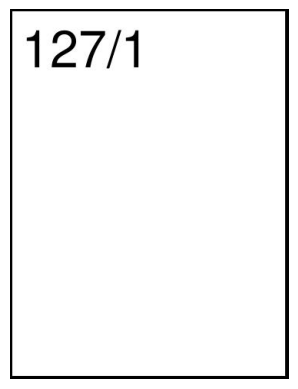


-----------------------------------------------------------------------------------

row_id = 207
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_1_row_4_015_pg3_cropped.jpg

133/1


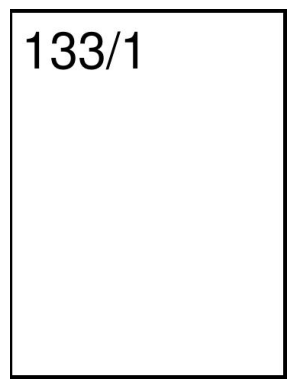


-----------------------------------------------------------------------------------

row_id = 208
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_1_row_2_015_pg3_cropped.jpg

130


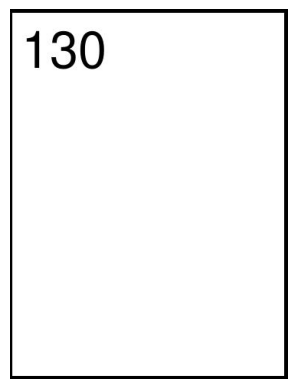


-----------------------------------------------------------------------------------

row_id = 209
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg3/pdf_to_images/column_1_row_3_015_pg3_cropped.jpg

132


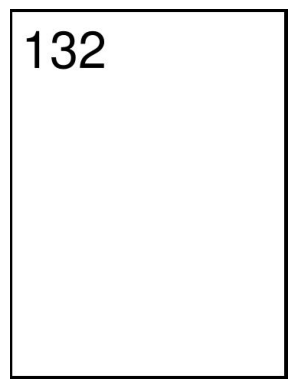


-----------------------------------------------------------------------------------

row_id = 210
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_1_row_3_015_pg6_cropped.jpg

596/1


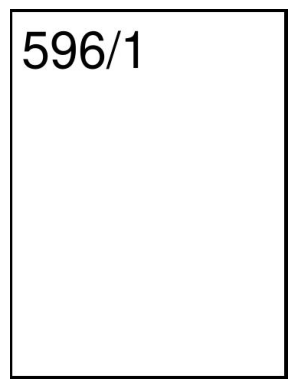


-----------------------------------------------------------------------------------

row_id = 211
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_1_row_1_015_pg6_cropped.jpg

566/1


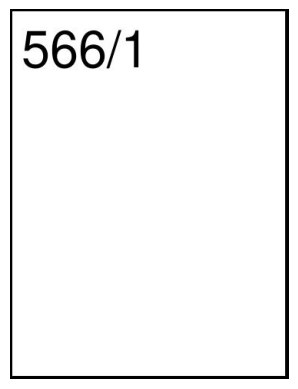


-----------------------------------------------------------------------------------

row_id = 212
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_1_row_2_015_pg6_cropped.jpg

569


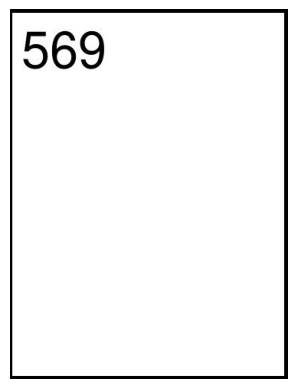


-----------------------------------------------------------------------------------

row_id = 213
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg6/pdf_to_images/column_1_row_4_015_pg6_cropped.jpg

682


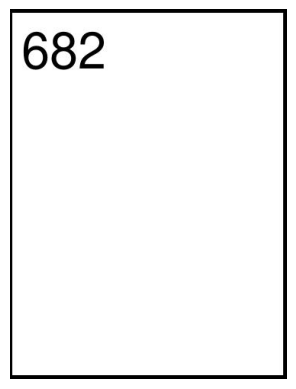


-----------------------------------------------------------------------------------

row_id = 214
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_1_row_3_015_pg4_cropped.jpg

245/1


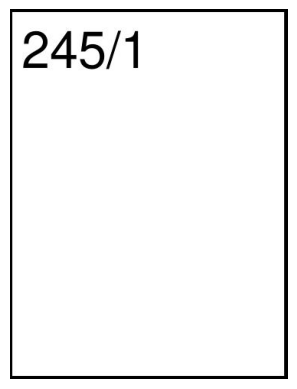


-----------------------------------------------------------------------------------

row_id = 215
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_1_row_1_015_pg4_cropped.jpg

162/1


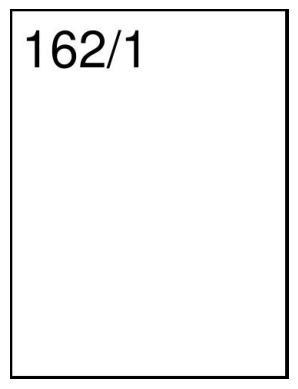


-----------------------------------------------------------------------------------

row_id = 216
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_1_row_4_015_pg4_cropped.jpg

248/1


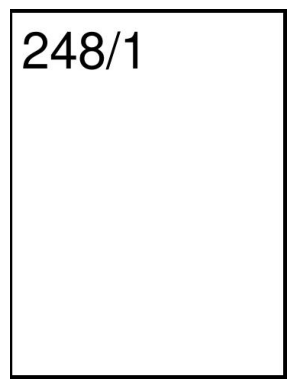


-----------------------------------------------------------------------------------

row_id = 217
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/015/015_pg4/pdf_to_images/column_1_row_2_015_pg4_cropped.jpg

181


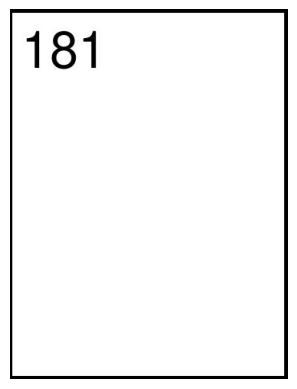


-----------------------------------------------------------------------------------

row_id = 218
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/048/048_pg1/pdf_to_images/column_1_row_1_048_pg1_cropped.jpg

9


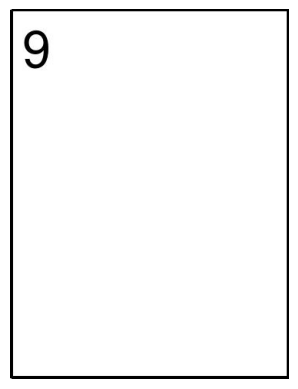


-----------------------------------------------------------------------------------

row_id = 219
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_1_row_2_044_pg1_cropped.jpg

1253/2


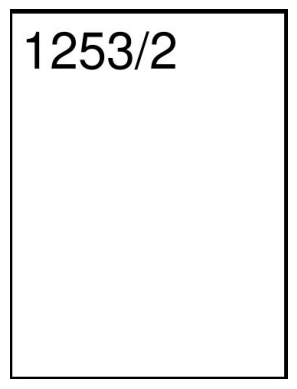


-----------------------------------------------------------------------------------

row_id = 220
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_1_row_1_044_pg1_cropped.jpg

1251/7


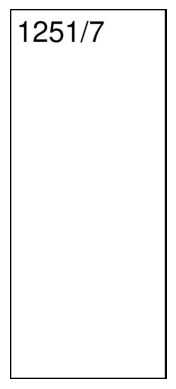


-----------------------------------------------------------------------------------

row_id = 221
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/044/044_pg1/pdf_to_images/column_1_row_3_044_pg1_cropped.jpg

1255/1


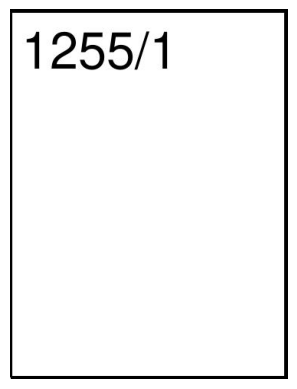


-----------------------------------------------------------------------------------

row_id = 222
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_1_row_4_016_pg5_cropped.jpg

440/1


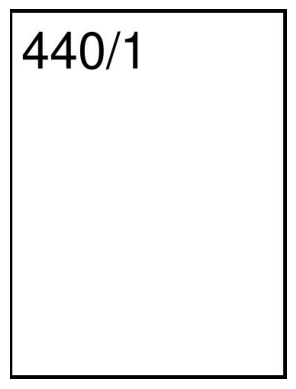


-----------------------------------------------------------------------------------

row_id = 223
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_1_row_2_016_pg5_cropped.jpg

364/3


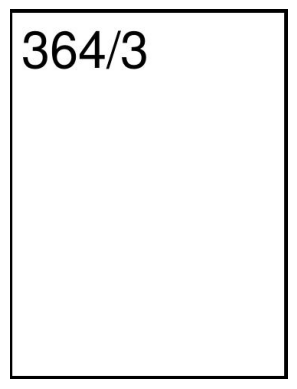


-----------------------------------------------------------------------------------

row_id = 224
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_1_row_3_016_pg5_cropped.jpg

365/2


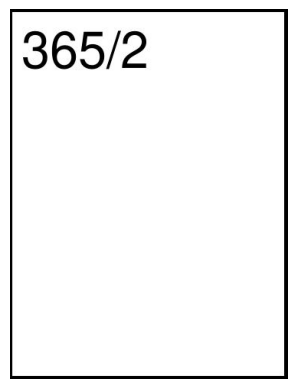


-----------------------------------------------------------------------------------

row_id = 225
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg5/pdf_to_images/column_1_row_1_016_pg5_cropped.jpg

298/1


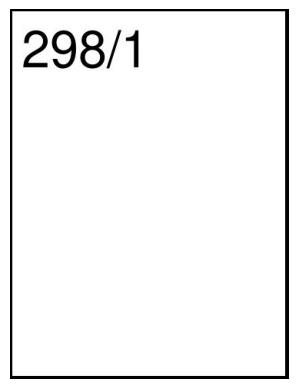


-----------------------------------------------------------------------------------

row_id = 226
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_1_row_1_016_pg1_cropped.jpg

11/3


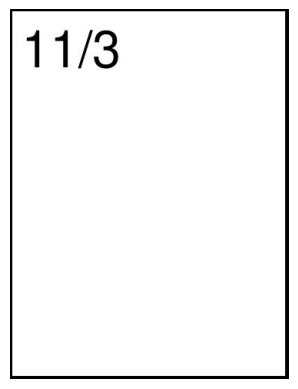


-----------------------------------------------------------------------------------

row_id = 227
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_1_row_4_016_pg1_cropped.jpg

103/3


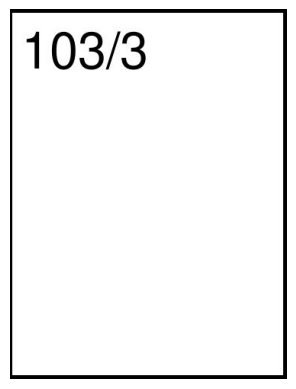


-----------------------------------------------------------------------------------

row_id = 228
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_1_row_2_016_pg1_cropped.jpg

38/2


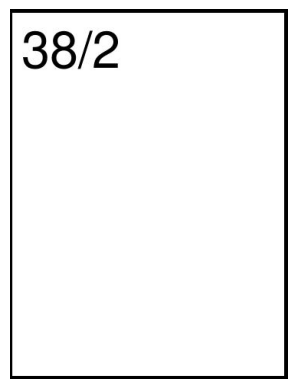


-----------------------------------------------------------------------------------

row_id = 229
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg1/pdf_to_images/column_1_row_3_016_pg1_cropped.jpg

51/2


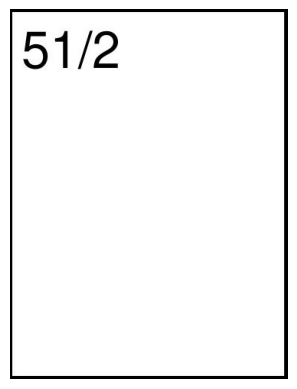


-----------------------------------------------------------------------------------

row_id = 230
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_1_row_4_016_pg4_cropped.jpg

267/3


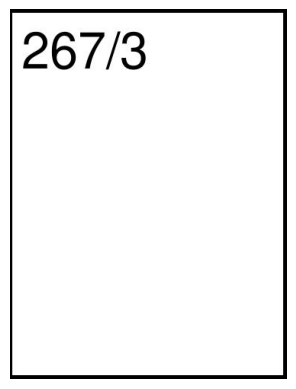


-----------------------------------------------------------------------------------

row_id = 231
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_1_row_3_016_pg4_cropped.jpg

267/1


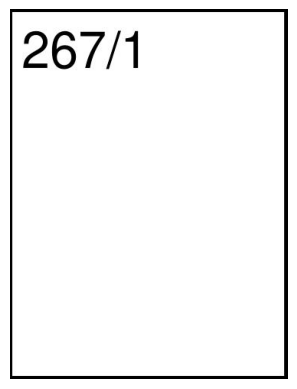


-----------------------------------------------------------------------------------

row_id = 232
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_1_row_2_016_pg4_cropped.jpg

266/1


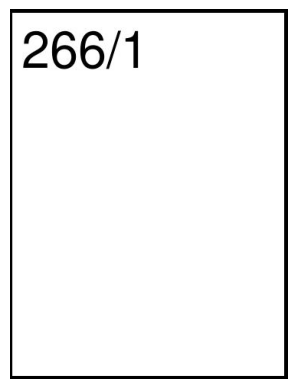


-----------------------------------------------------------------------------------

row_id = 233
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg4/pdf_to_images/column_1_row_1_016_pg4_cropped.jpg

265/1


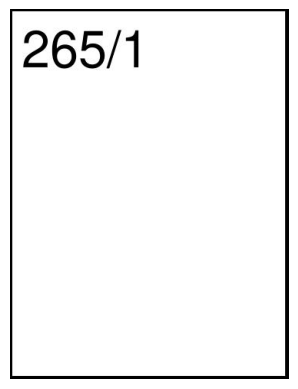


-----------------------------------------------------------------------------------

row_id = 234
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_1_row_3_016_pg3_cropped.jpg

220/1


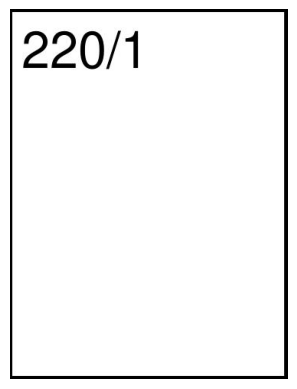


-----------------------------------------------------------------------------------

row_id = 235
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_1_row_4_016_pg3_cropped.jpg

264/1


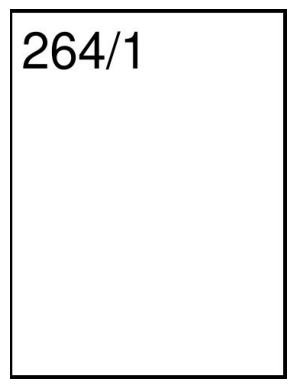


-----------------------------------------------------------------------------------

row_id = 236
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_1_row_2_016_pg3_cropped.jpg

142/1


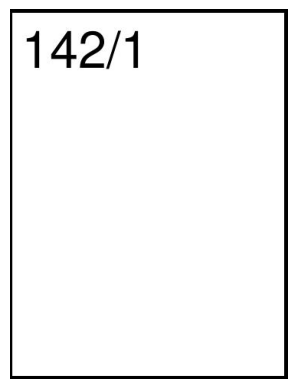


-----------------------------------------------------------------------------------

row_id = 237
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg3/pdf_to_images/column_1_row_1_016_pg3_cropped.jpg

124/1


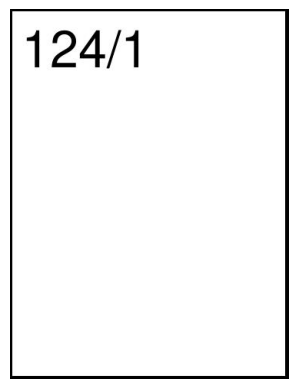


-----------------------------------------------------------------------------------

row_id = 238
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg6/pdf_to_images/column_1_row_1_016_pg6_cropped.jpg

525


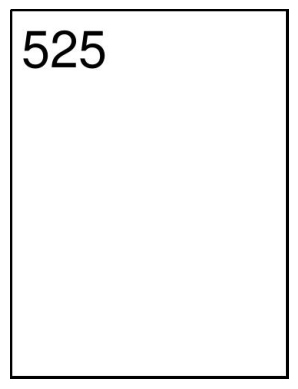


-----------------------------------------------------------------------------------

row_id = 239
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg6/pdf_to_images/column_1_row_2_016_pg6_cropped.jpg

621/1


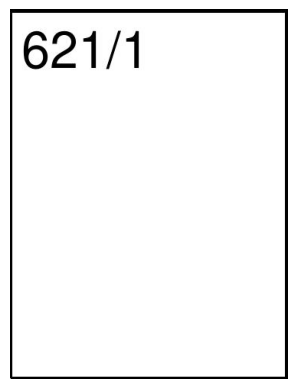


-----------------------------------------------------------------------------------

row_id = 240
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_1_row_3_016_pg2_cropped.jpg

119/1


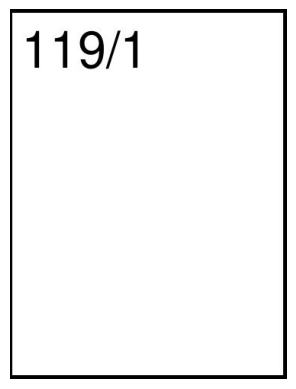


-----------------------------------------------------------------------------------

row_id = 241
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_1_row_4_016_pg2_cropped.jpg

122/1


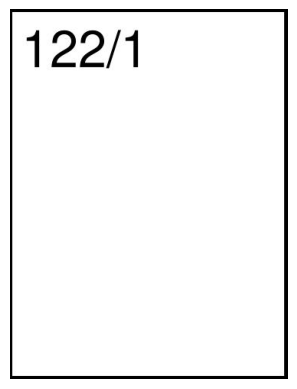


-----------------------------------------------------------------------------------

row_id = 242
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_1_row_1_016_pg2_cropped.jpg

117/2


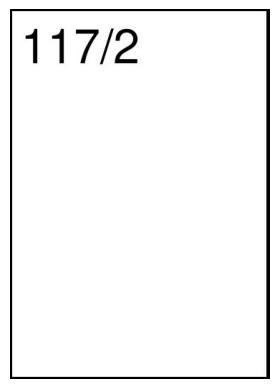


-----------------------------------------------------------------------------------

row_id = 243
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/016/016_pg2/pdf_to_images/column_1_row_2_016_pg2_cropped.jpg

118/1


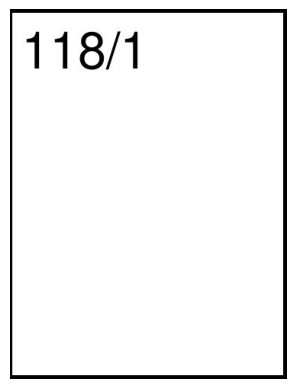


-----------------------------------------------------------------------------------

row_id = 244
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_1_row_1_054_pg3_cropped.jpg




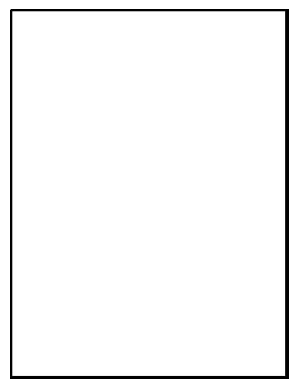


-----------------------------------------------------------------------------------

row_id = 245
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_1_row_3_054_pg3_cropped.jpg

92/1


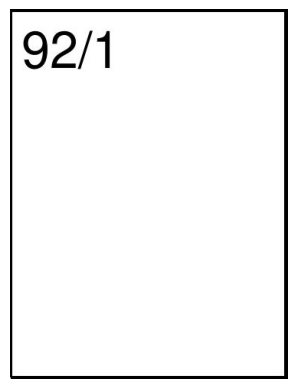


-----------------------------------------------------------------------------------

row_id = 246
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg3/pdf_to_images/column_1_row_2_054_pg3_cropped.jpg

69/3


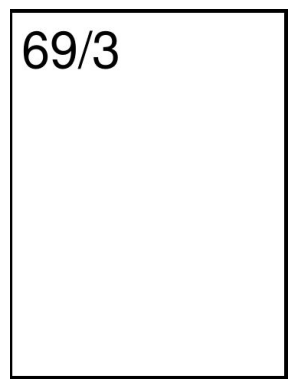


-----------------------------------------------------------------------------------

row_id = 247
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_3_054_pg2_cropped.jpg




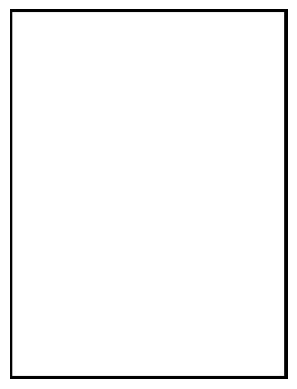


-----------------------------------------------------------------------------------

row_id = 248
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_2_054_pg2_cropped.jpg




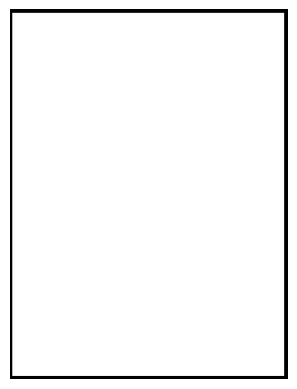


-----------------------------------------------------------------------------------

row_id = 249
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_1_054_pg2_cropped.jpg




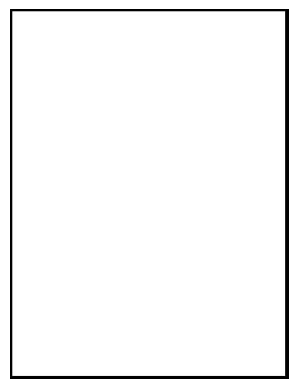


-----------------------------------------------------------------------------------

row_id = 250
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_4_054_pg2_cropped.jpg




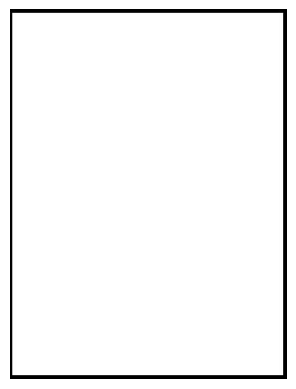


-----------------------------------------------------------------------------------

row_id = 251
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_2_054_pg1_cropped.jpg




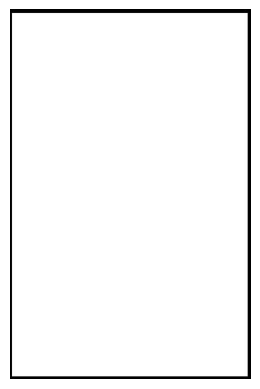


-----------------------------------------------------------------------------------

row_id = 252
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_3_054_pg1_cropped.jpg




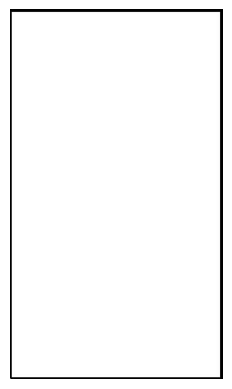


-----------------------------------------------------------------------------------

row_id = 253
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_1_054_pg1_cropped.jpg

69/1


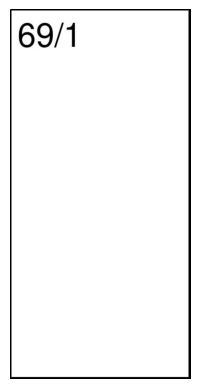


-----------------------------------------------------------------------------------

row_id = 254
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/056/056_pg1/pdf_to_images/column_1_row_1_056_pg1_cropped.jpg

1876


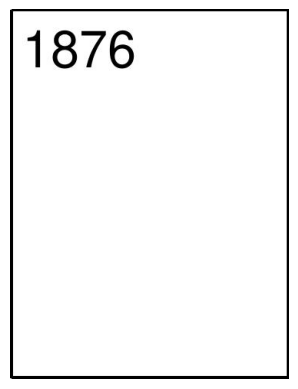


-----------------------------------------------------------------------------------

row_id = 255
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_4_007_pg1_cropped.jpg




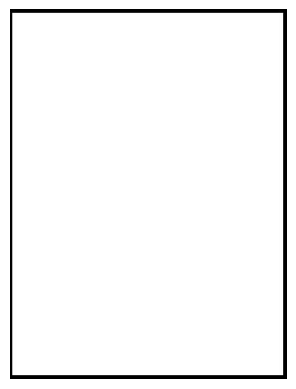


-----------------------------------------------------------------------------------

row_id = 256
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_1_007_pg1_cropped.jpg

9


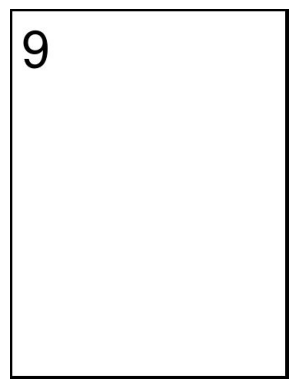


-----------------------------------------------------------------------------------

row_id = 257
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_2_007_pg1_cropped.jpg




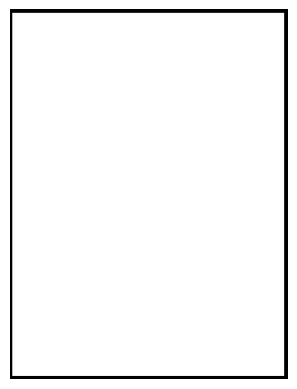


-----------------------------------------------------------------------------------

row_id = 258
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_3_007_pg1_cropped.jpg




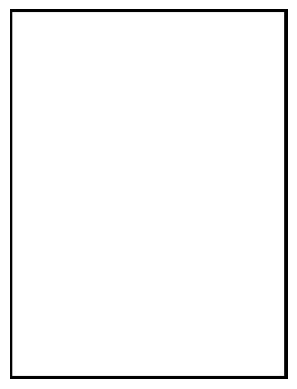


-----------------------------------------------------------------------------------

row_id = 259
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_1_007_pg2_cropped.jpg




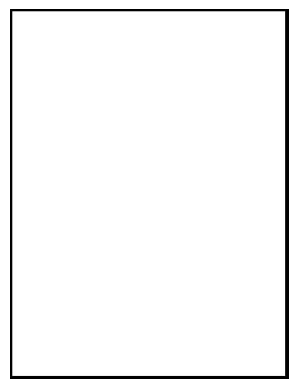


-----------------------------------------------------------------------------------

row_id = 260
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_4_007_pg2_cropped.jpg




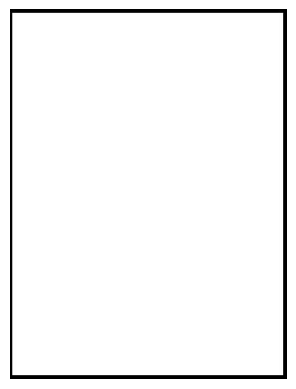


-----------------------------------------------------------------------------------

row_id = 261
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_2_007_pg2_cropped.jpg




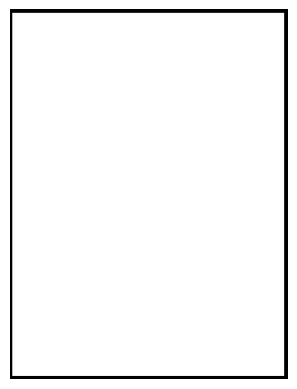


-----------------------------------------------------------------------------------

row_id = 262
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_3_007_pg2_cropped.jpg




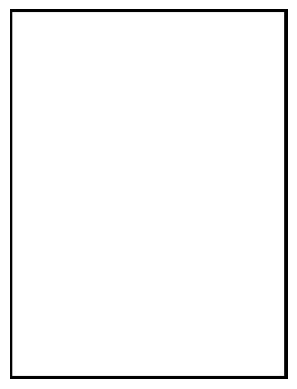


-----------------------------------------------------------------------------------

row_id = 263
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_3_007_pg3_cropped.jpg

16


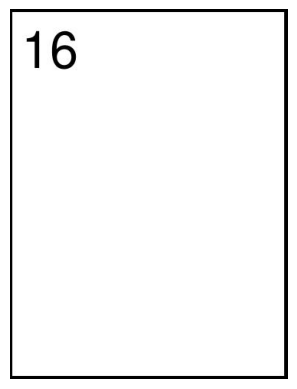


-----------------------------------------------------------------------------------

row_id = 264
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_2_007_pg3_cropped.jpg




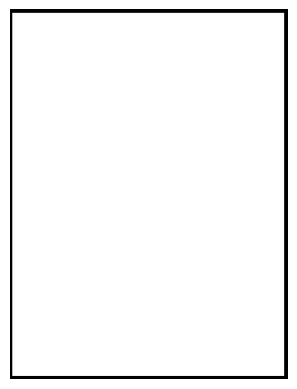


-----------------------------------------------------------------------------------

row_id = 265
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_1_007_pg3_cropped.jpg




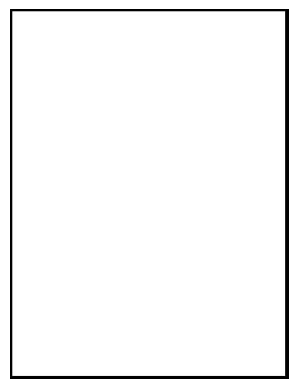


-----------------------------------------------------------------------------------

row_id = 266
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_4_007_pg3_cropped.jpg

20


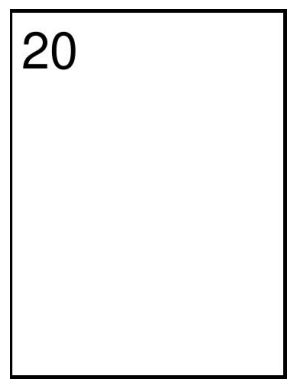


-----------------------------------------------------------------------------------

row_id = 267
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_2_019_pg4_cropped.jpg

1665/1


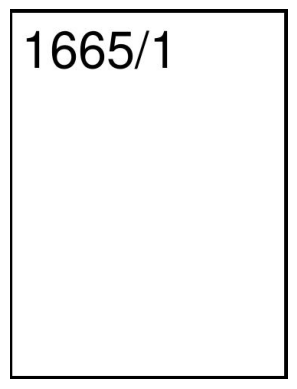


-----------------------------------------------------------------------------------

row_id = 268
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_1_019_pg4_cropped.jpg

1547/2


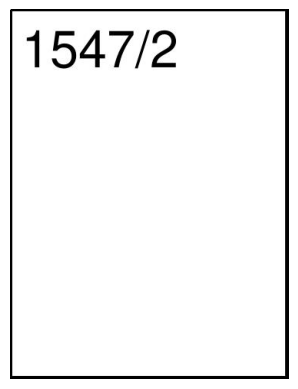


-----------------------------------------------------------------------------------

row_id = 269
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_3_019_pg4_cropped.jpg

1686/1


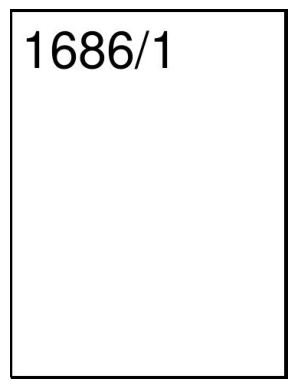


-----------------------------------------------------------------------------------

row_id = 270
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_4_019_pg2_cropped.jpg

1260/15


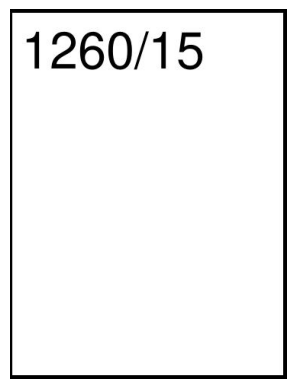


-----------------------------------------------------------------------------------

row_id = 271
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_1_019_pg2_cropped.jpg

1260/7


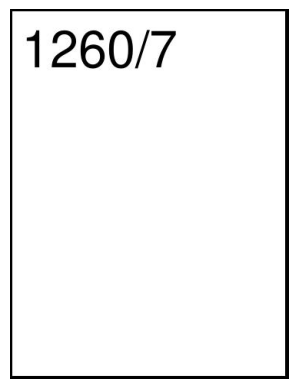


-----------------------------------------------------------------------------------

row_id = 272
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_2_019_pg2_cropped.jpg

1260/12


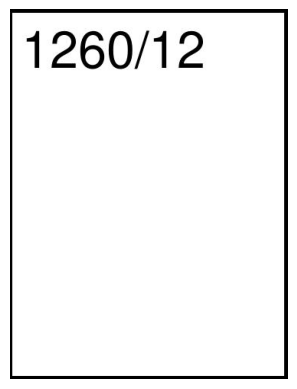


-----------------------------------------------------------------------------------

row_id = 273
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_3_019_pg2_cropped.jpg

1260/14


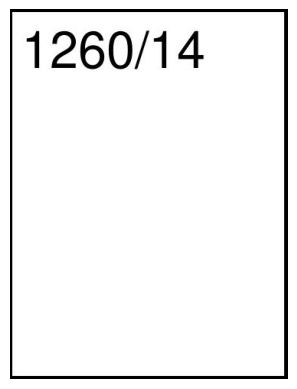


-----------------------------------------------------------------------------------

row_id = 274
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_3_019_pg1_cropped.jpg

1187/13


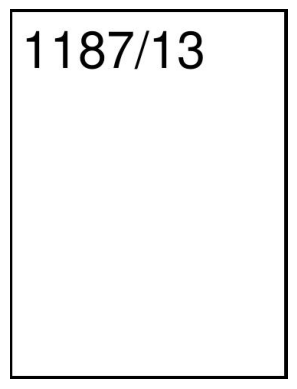


-----------------------------------------------------------------------------------

row_id = 275
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_1_019_pg1_cropped.jpg

1187/8


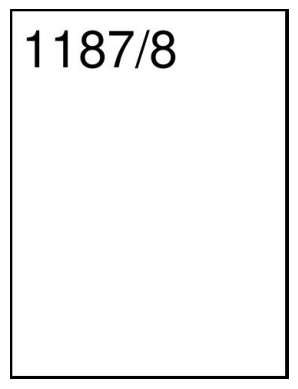


-----------------------------------------------------------------------------------

row_id = 276
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_4_019_pg1_cropped.jpg

1187/20


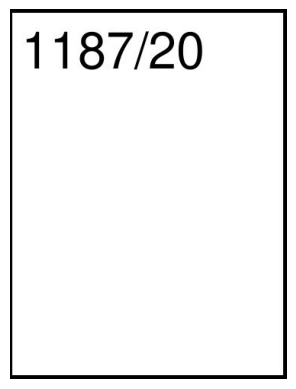


-----------------------------------------------------------------------------------

row_id = 277
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_2_019_pg1_cropped.jpg

1187/9


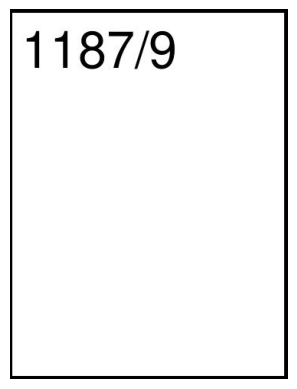


-----------------------------------------------------------------------------------

row_id = 278
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_1_019_pg3_cropped.jpg

1262


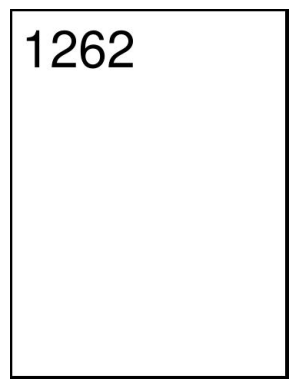


-----------------------------------------------------------------------------------

row_id = 279
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_2_019_pg3_cropped.jpg

1540/1


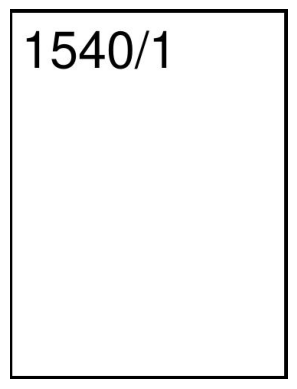


-----------------------------------------------------------------------------------

row_id = 280
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_4_019_pg3_cropped.jpg

1545/11


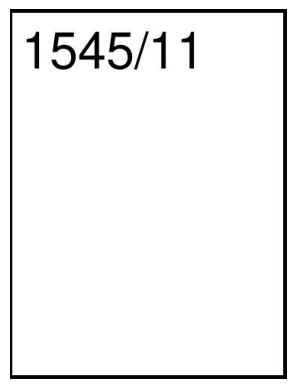


-----------------------------------------------------------------------------------

row_id = 281
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_3_019_pg3_cropped.jpg

1545/7


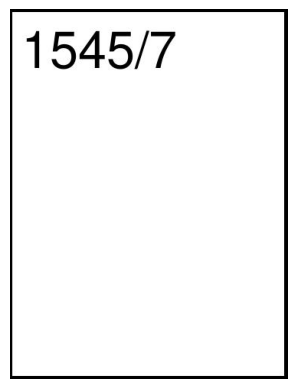


-----------------------------------------------------------------------------------

row_id = 282
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/029/029_pg1/pdf_to_images/column_1_row_1_029_pg1_cropped.jpg

98


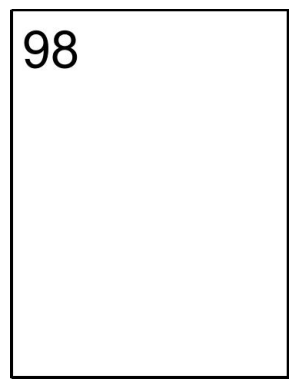


-----------------------------------------------------------------------------------

row_id = 283
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/033/033_pg1/pdf_to_images/column_1_row_1_033_pg1_cropped.jpg

24/83


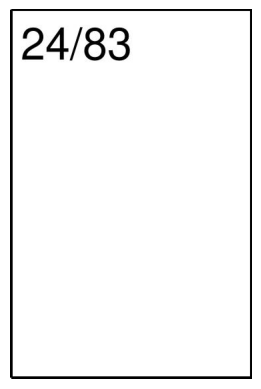


-----------------------------------------------------------------------------------



In [69]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(merged_df.shape[0]):
    a = i

    print('row_id =', i)
    print(merged_df['image_path_col1'][a])
    print()
    # Assuming imagePath contains the path to the image you want to display
    imagePath = merged_df['image_path_col1'][a]
    print(merged_df['col_1_content'][a])
    # Load the image
    img = mpimg.imread(imagePath)
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    #plt.title(df['Content'][a])  # Set the title
    plt.show()
    print()
    print('-----------------------------------------------------------------------------------')
    print()

row_id = 249
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_1_054_pg2_cropped.jpg




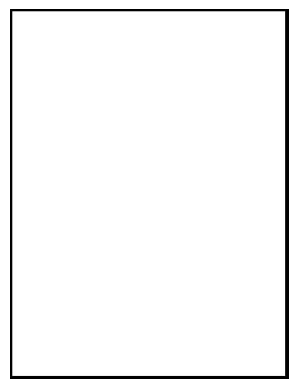


-----------------------------------------------------------------------------------

row_id = 250
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg2/pdf_to_images/column_1_row_4_054_pg2_cropped.jpg




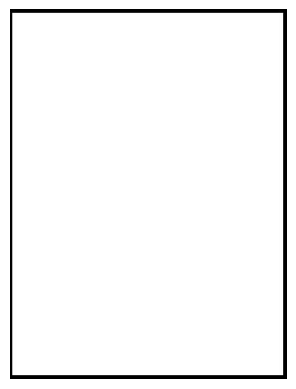


-----------------------------------------------------------------------------------

row_id = 251
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_2_054_pg1_cropped.jpg




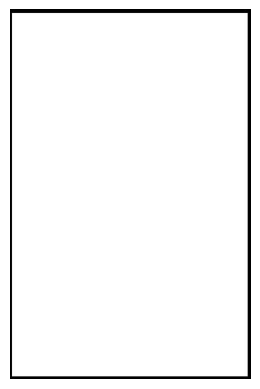


-----------------------------------------------------------------------------------

row_id = 252
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_3_054_pg1_cropped.jpg




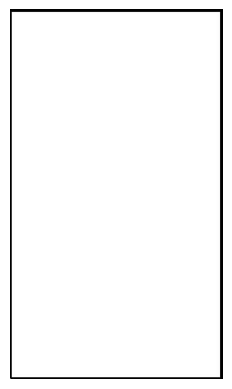


-----------------------------------------------------------------------------------

row_id = 253
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/054/054_pg1/pdf_to_images/column_1_row_1_054_pg1_cropped.jpg

69/1


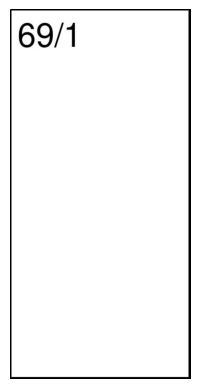


-----------------------------------------------------------------------------------

row_id = 254
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/056/056_pg1/pdf_to_images/column_1_row_1_056_pg1_cropped.jpg

1876


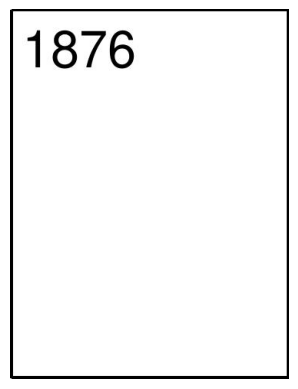


-----------------------------------------------------------------------------------

row_id = 255
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_4_007_pg1_cropped.jpg




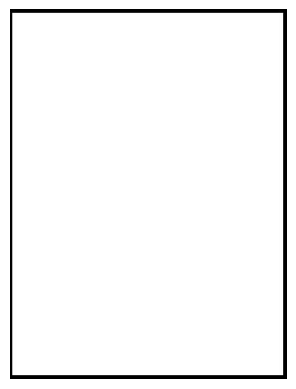


-----------------------------------------------------------------------------------

row_id = 256
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_1_007_pg1_cropped.jpg

9


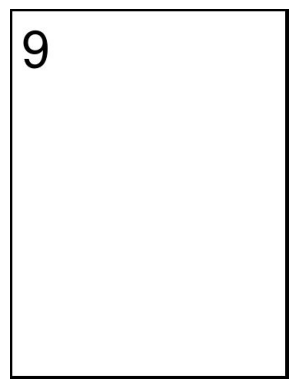


-----------------------------------------------------------------------------------

row_id = 257
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_2_007_pg1_cropped.jpg




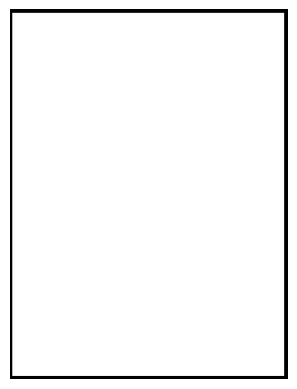


-----------------------------------------------------------------------------------

row_id = 258
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg1/pdf_to_images/column_1_row_3_007_pg1_cropped.jpg




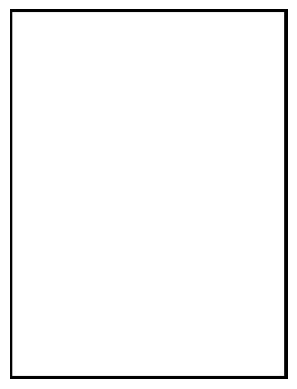


-----------------------------------------------------------------------------------

row_id = 259
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_1_007_pg2_cropped.jpg




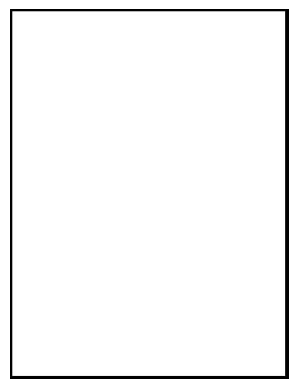


-----------------------------------------------------------------------------------

row_id = 260
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_4_007_pg2_cropped.jpg




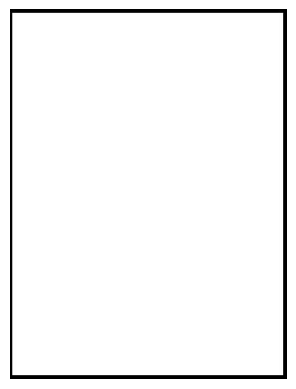


-----------------------------------------------------------------------------------

row_id = 261
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_2_007_pg2_cropped.jpg




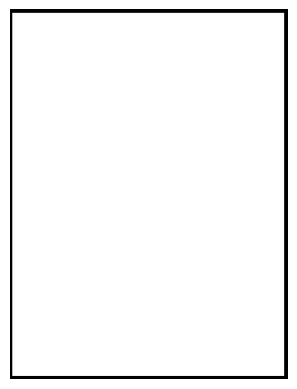


-----------------------------------------------------------------------------------

row_id = 262
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg2/pdf_to_images/column_1_row_3_007_pg2_cropped.jpg




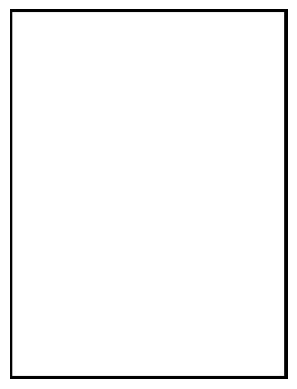


-----------------------------------------------------------------------------------

row_id = 263
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_3_007_pg3_cropped.jpg

16


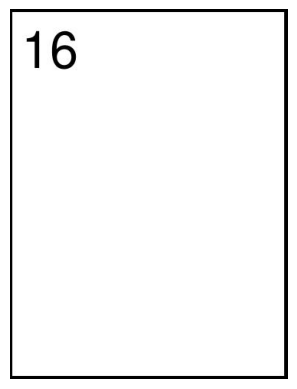


-----------------------------------------------------------------------------------

row_id = 264
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_2_007_pg3_cropped.jpg




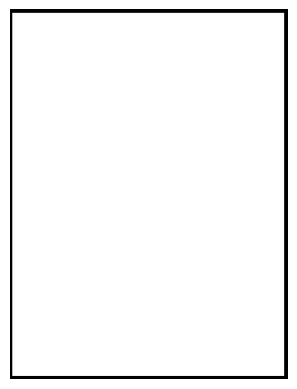


-----------------------------------------------------------------------------------

row_id = 265
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_1_007_pg3_cropped.jpg




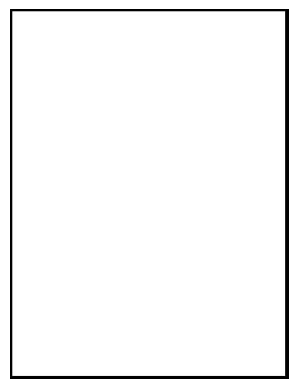


-----------------------------------------------------------------------------------

row_id = 266
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/007/007_pg3/pdf_to_images/column_1_row_4_007_pg3_cropped.jpg

20


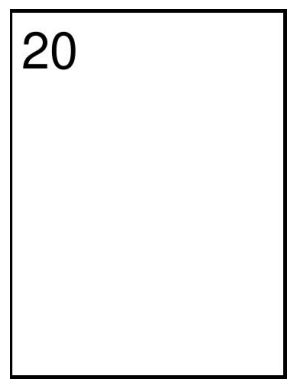


-----------------------------------------------------------------------------------

row_id = 267
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_2_019_pg4_cropped.jpg

1665/1


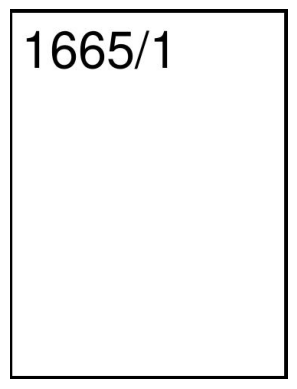


-----------------------------------------------------------------------------------

row_id = 268
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_1_019_pg4_cropped.jpg

1547/2


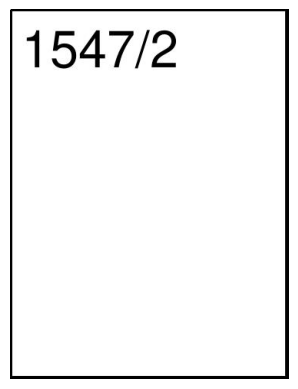


-----------------------------------------------------------------------------------

row_id = 269
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg4/pdf_to_images/column_1_row_3_019_pg4_cropped.jpg

1686/1


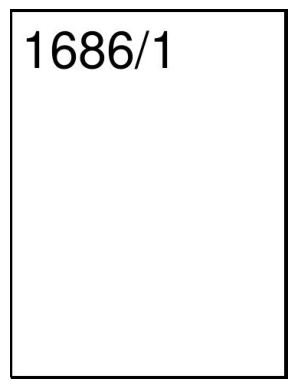


-----------------------------------------------------------------------------------

row_id = 270
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_4_019_pg2_cropped.jpg

1260/15


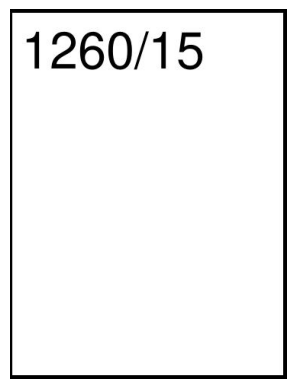


-----------------------------------------------------------------------------------

row_id = 271
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_1_019_pg2_cropped.jpg

1260/7


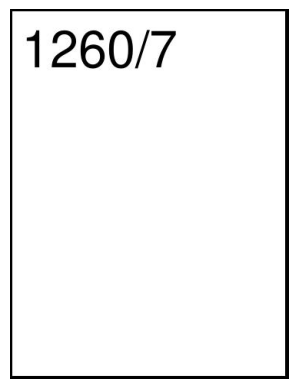


-----------------------------------------------------------------------------------

row_id = 272
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_2_019_pg2_cropped.jpg

1260/12


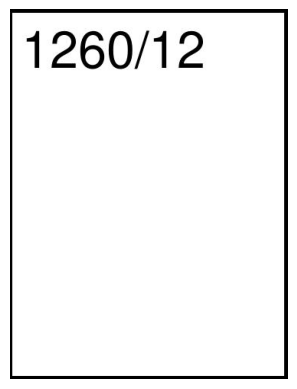


-----------------------------------------------------------------------------------

row_id = 273
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg2/pdf_to_images/column_1_row_3_019_pg2_cropped.jpg

1260/14


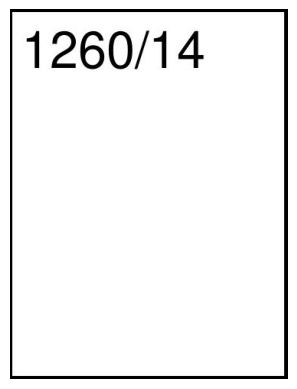


-----------------------------------------------------------------------------------

row_id = 274
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_3_019_pg1_cropped.jpg

1187/13


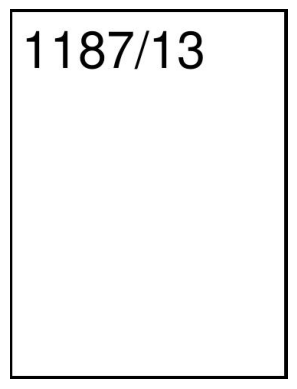


-----------------------------------------------------------------------------------

row_id = 275
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_1_019_pg1_cropped.jpg

1187/8


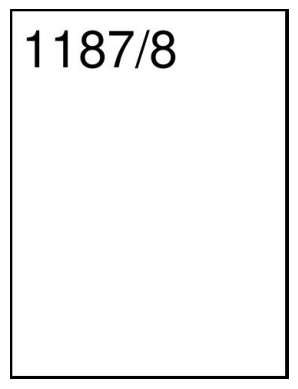


-----------------------------------------------------------------------------------

row_id = 276
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_4_019_pg1_cropped.jpg

1187/20


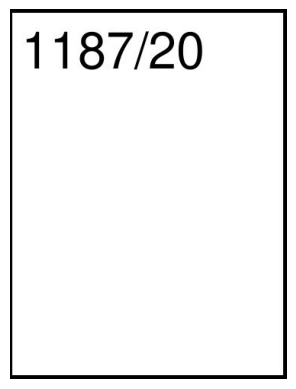


-----------------------------------------------------------------------------------

row_id = 277
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg1/pdf_to_images/column_1_row_2_019_pg1_cropped.jpg

1187/9


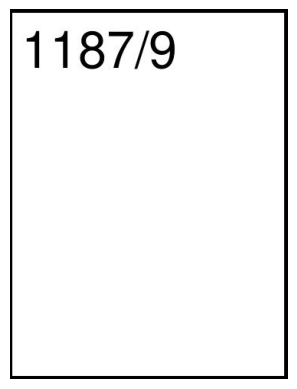


-----------------------------------------------------------------------------------

row_id = 278
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_1_019_pg3_cropped.jpg

1262


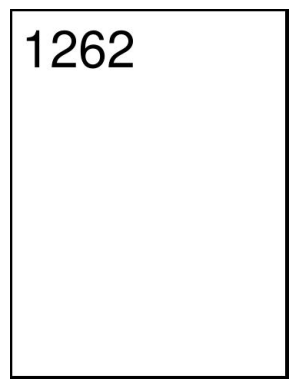


-----------------------------------------------------------------------------------

row_id = 279
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_2_019_pg3_cropped.jpg

1540/1


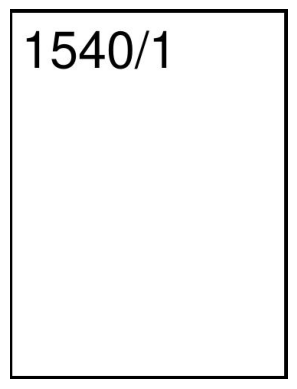


-----------------------------------------------------------------------------------

row_id = 280
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_4_019_pg3_cropped.jpg

1545/11


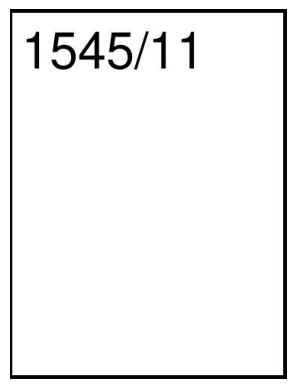


-----------------------------------------------------------------------------------

row_id = 281
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/019/019_pg3/pdf_to_images/column_1_row_3_019_pg3_cropped.jpg

1545/7


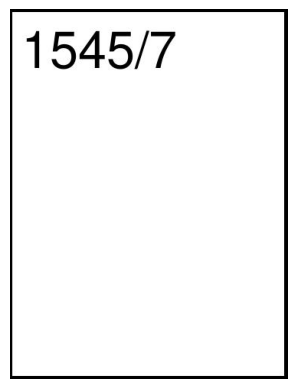


-----------------------------------------------------------------------------------

row_id = 282
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/029/029_pg1/pdf_to_images/column_1_row_1_029_pg1_cropped.jpg

98


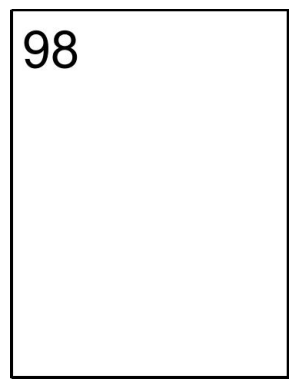


-----------------------------------------------------------------------------------

row_id = 283
/home/pratiksalunkhe/Vallabh/Fin_OCR_Model/separate_pdf/033/033_pg1/pdf_to_images/column_1_row_1_033_pg1_cropped.jpg

24/83


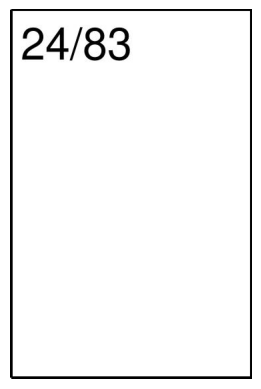


-----------------------------------------------------------------------------------



In [70]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(249 , merged_df.shape[0]):
    a = i

    print('row_id =', i)
    print(merged_df['image_path_col1'][a])
    print()
    # Assuming imagePath contains the path to the image you want to display
    imagePath = merged_df['image_path_col1'][a]
    print(merged_df['col_1_content'][a])
    # Load the image
    img = mpimg.imread(imagePath)
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    #plt.title(df['Content'][a])  # Set the title
    plt.show()
    print()
    print('-----------------------------------------------------------------------------------')
    print()